In [42]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), "../src"))

In [20]:
import logging
import jax
import jax.numpy as np
import numpy as onp
import skbio.stats.composition as cmp
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import statsmodels.api as sm
from datetime import datetime

from simulate_data_fct import sim_IV_lognormal_linear
from plot_fct import update_layout, img_path, update_layout_px, colours, plot_ilr_X_vs_Y
from run_methods_all import run_methods_confidence_interval
from plot_fct import plot_mse_results, plot_beta_results
from run_methods_all import run_methods_all
from method_fct import LinearInstrumentModel

In [21]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [22]:
# set up logging file
logging.getLogger().setLevel(logging.INFO)

In [23]:
key = jax.random.PRNGKey(191)

# Semi Synthetic

## Data Generation

In [24]:
savepath = os.path.join(img_path, "SemiSyntheticSetUp")

In [25]:
# load real data on different aggregation levels

data_path = "/Users/elisabeth.ailer/Projekte/P1_Microbiom/microbiom/CausalDiversity/generalIVmodel/Input/"

data = pd.read_csv(data_path + "ORG_metaSPARSim_otucountFamily_210222.csv", index_col=0)
Yreal = data.iloc[-1, :].values
Xreal_count = data[data.sum(axis=1)!=0].iloc[:-1, :].T.values
n, p = Xreal_count.shape
Xreal = np.array([Xreal_count[i, :]/Xreal_count[i, :].sum() for i in range(n)])
Zreal = np.array([data.columns.values[i].find("control") for i in range(n)])*(-1)

In [26]:
Xreal_n0 = LinearInstrumentModel.add_term_to_zeros(Xreal)
Xreal_ilr = cmp.ilr(Xreal_n0)
# Compute F-Statistics 
ZZreal = onp.array(sm.add_constant(Zreal))
alphahat = np.linalg.inv(ZZreal.T@ZZreal)@ZZreal.T@Xreal_ilr
MSM = np.sum(((ZZreal@alphahat - np.mean(Xreal_ilr, axis=0))**2), axis=0)/(num_inst)
MSE = np.sum(((ZZreal@alphahat - Xreal_ilr)**2), axis=0)/(n-num_inst)
F = MSM / MSE
np.round(F,2)

DeviceArray([0.03, 0.00, 0.91, 0.37, 0.00, 0.31, 0.36, 0.55, 0.53, 0.03,
             0.33, 0.01, 2.49, 0.09, 0.03, 1.61, 1.50, 0.07, 0.06, 0.01,
             0.24, 2.44, 0.00, 0.26, 0.41, 0.74, 0.02, 0.73, 1.33, 0.04,
             0.16, 0.08, 3.56, 1.12, 0.83, 0.52, 0.01, 1.40, 0.68, 0.88,
             0.86, 7.97, 0.03, 0.11, 0.31, 0.40], dtype=float32)

## Data Visualization

In [98]:
X_plot = np.hstack([Xreal[:, Xreal.mean(axis=0)>0.03], Xreal[:, Xreal.mean(axis=0)<0.03].sum(axis=1).T[..., np.newaxis]])
fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.write_image(os.path.join(savepath,
                             "Barplot_Sample_" +str(p)+".pdf" ))
fig.show()

In [106]:
Xreal.shape

(57, 47)

In [28]:
fig = px.bar(pd.DataFrame(Xreal, columns=["Microbe "+str(i) for i in range(Xreal.shape[1])]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.write_image(os.path.join(savepath,
                             "Barplot_Sample_" +str(p)+".pdf" ))
fig.show()

In [29]:
Xreal_ilr = cmp.ilr(Xreal_n0)

In [32]:
Xreal_ilr
instrument_strength="real"

In [33]:
fig = plot_ilr_X_vs_Y(Xreal_ilr, Xreal_ilr, Yreal, Yreal)

fig.update_layout(xaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(width=2000, height=500)
fig.write_image(os.path.join(savepath,
                             "Data_vs_trueeffect_" +str(p)+"RealData_"+str(instrument_strength)+".pdf" ))


fig.show()

# Estimate parameters from real data

In [34]:
# FIRST STAGE ESTIMATION
nreal, preal = Xreal.shape

x0, x1 = Xreal_count[Zreal==0], Xreal_count[Zreal==1]
alpha0_hat = x0.mean(axis=0)
alphaT_hat = x1.mean(axis=0) - alpha0_hat

ps_hat = (Xreal_count==0).sum(axis=0) / n

In [35]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.2f}".format(x)})

In [36]:
alpha0_hat

array([6.23, 0.05, 0.09, 0.00, 144.14, 0.14, 0.05, 0.00, 0.00, 0.00, 0.00,
       0.00, 0.00, 0.09, 0.82, 8.36, 0.09, 6.27, 28.64, 0.00, 60.27, 1.23,
       11936.32, 194.09, 0.14, 36.68, 16.32, 27.68, 9.05, 886.14, 288.82,
       5.68, 1427.73, 0.00, 56.64, 928.73, 0.00, 0.09, 25.36, 0.09, 0.55,
       0.00, 6.23, 0.00, 141.23, 0.27, 1057.05])

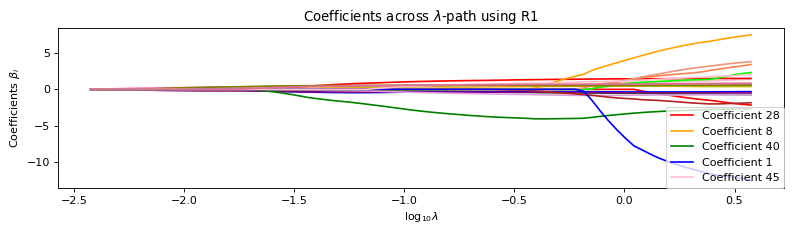

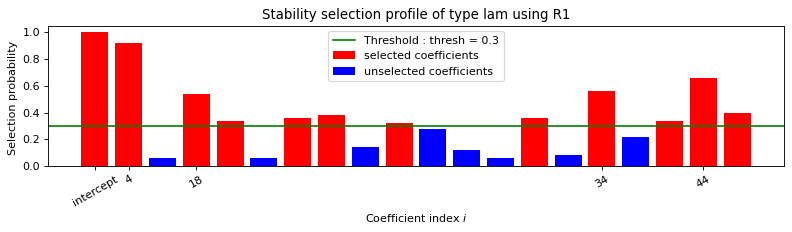

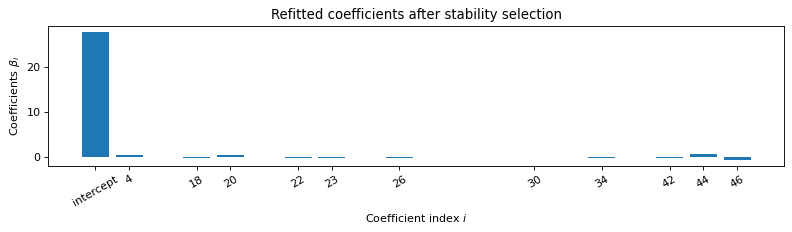


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.018s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    18    20    22    23    26    30    34    42    44    46    
   Running time :  0.063s

[27.83 0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19
 0.00 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 -0.25 0.00 0.70 0.00 -0.53]
6.214842


In [37]:
# SECOND STAGE ESTIMATION
from method_fct import LinearInstrumentModel, noregression_logcontrast

Xreal_n0 = LinearInstrumentModel.add_term_to_zeros(Xreal)
Xreal_ilr = cmp.ilr(Xreal_n0)
betahat, Yhat = noregression_logcontrast(ZZreal, Xreal, Yreal, Xreal_n0, logcontrast_threshold=0.3)
print(betahat)
print(np.mean((Yhat-Yreal)**2))

In [38]:
# Compute F-Statistics 
ZZreal = onp.array(sm.add_constant(Zreal))
alphahat = np.linalg.inv(ZZreal.T@Zreal)@ZZreal.T@Xreal_ilr
MSM = np.sum(((ZZreal@alphahat - np.mean(Xreal_ilr, axis=0))**2), axis=0)/(1)
MSE = np.sum(((ZZreal@alphahat - Xreal_ilr)**2), axis=0)/(n-1)
F = MSM / MSE
F

ValueError: Argument to inv must have shape [..., n, n], got (2,).

# Simulate from real parameters

In [39]:
n = 1000
p = preal
num_star = 250


V = cmp._gram_schmidt_basis(p)
num_inst=1
c_X = 0.2  

# instrument strength
alpha0 = alpha0_hat
alphaT = alphaT_hat[..., np.newaxis].T

# confounder
#mu_c = np.ones((p, )) * 1/p  # neutral element

mu_c = onp.zeros((p, ))
mu_c[np.where(alpha0>100)] = jax.random.uniform(key, ((len(np.where(alpha0>100)[0])), ), minval=3, maxval=10)
mu_c = mu_c / mu_c.sum()  # has to be a compositional vector

ps = ps_hat
# relationship between X and Y
beta0 = float(betahat[0])
betaT = betahat[1:]  # beta is chosen to sum up to one
# confounder influence to Y
c_Y_helper = onp.zeros((p, ))
c_Y_helper[np.where(alpha0>100)] = jax.random.choice(key, np.array([-3, 3]), ((len(np.where(alpha0>100)[0])), ))
c_Y = np.hstack([c_Y_helper[:-1], -c_Y_helper[:-1].sum() ])  

In [40]:
confounder, Z_sim, X_sim, Y_sim, X_star, Y_star = sim_IV_lognormal_linear(
            key,
            n=n,
            p=p,
            num_inst=num_inst,
            mu_c=mu_c,
            c_X=c_X,
            alpha0=alpha0,
            alphaT=alphaT,
            c_Y=c_Y,
            beta0=beta0,
            betaT=betaT,
            num_star=500,
ps=ps)
X_sim_ilr = cmp.ilr(X_sim)
X_star_ilr = cmp.ilr(X_star)

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



In [92]:
X_sim.mean(axis=0)>0.05

DeviceArray([False, False, False, False, False, False, False, False,
             False, False, False, False, False, False, False, False,
             False, False, False, False, False, False,  True, False,
             False, False, False, False, False, False, False, False,
              True, False, False,  True, False, False, False, False,
             False, False, False, False, False, False,  True], dtype=bool)

In [99]:
X_plot = np.hstack([X_sim[:, X_sim.mean(axis=0)>0.03], X_sim[:, X_sim.mean(axis=0)<0.03].sum(axis=1).T[..., np.newaxis]])
fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.write_image(os.path.join(savepath,
                             "Barplot_Sample_" +str(p)+"SemiParametric_"+str(instrument_strength)+".pdf" ))
fig.show()

In [41]:
fig = px.bar(pd.DataFrame(X_sim[:100, :], columns=["Microbe "+str(i) for i in range(X_sim.shape[1])]))
fig = update_layout_px(fig)
fig.update_xaxes(title="Sample number")
fig.update_yaxes(title="Percentage of microbiota in sample")
fig.write_image(os.path.join(savepath,
                             "Barplot_Sample_" +str(p)+"SemiParametric_"+str(instrument_strength)+".pdf" ))
fig.show()

In [43]:
# Compute F-Statistics 
ZZ_sim = onp.array(sm.add_constant(Z_sim))
alphahat = np.linalg.inv(ZZ_sim.T@ZZ_sim)@ZZ_sim.T@X_sim_ilr
MSM = np.sum(((ZZ_sim@alphahat - np.mean(X_sim_ilr, axis=0))**2), axis=0)/(num_inst)
MSE = np.sum(((ZZ_sim@alphahat - X_sim_ilr)**2), axis=0)/(n-num_inst)
F = MSM / MSE
F

DeviceArray([1.18, 713.91, 618.37, 2.89, 2.89, 2.89, 2.89, 2.89, 2.89,
             2.89, 2.89, 2.89, 2.89, 2.89, 2.89, 2.89, 2.89, 2.89, 2.89,
             2.89, 2.89, 854.72, 49.81, 353.97, 353.97, 353.97, 353.97,
             353.97, 361.10, 15.80, 301.54, 60.23, 203.12, 203.12, 20.50,
             136.59, 136.59, 136.59, 136.59, 136.59, 136.59, 136.59,
             136.59, 1.80, 101.96, 2945.09], dtype=float32)

In [83]:
fig = plot_ilr_X_vs_Y(X_sim_ilr, X_star_ilr, Y_sim, Y_star)

fig.update_layout(xaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis3=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis4=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(xaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(yaxis5=dict(showline=True, linewidth=2, linecolor="black"))
fig.update_layout(width=2000, height=500)
fig.write_image(os.path.join(savepath,
                             "Data_vs_trueeffect_" +str(p)+"SemiParametric_"+str(instrument_strength)+".pdf" ))


fig.show()

**************************************************************************************************
*****************************************We are at 0 of 50***********************************************
**************************************************************************************************
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.36 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.17 -0.14 0.02 0.02 0.02 0.01 0.01
 -0.13 -0.25 0.03 0.03 0.02 0.02 0.11 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.93 0.04

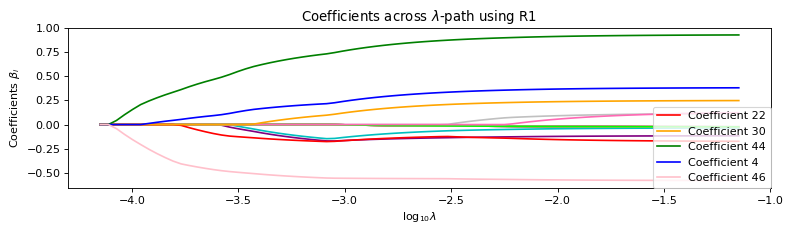

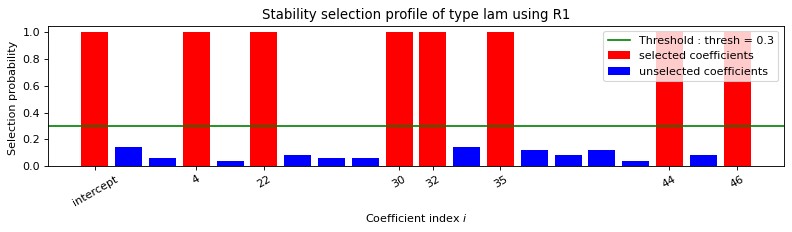

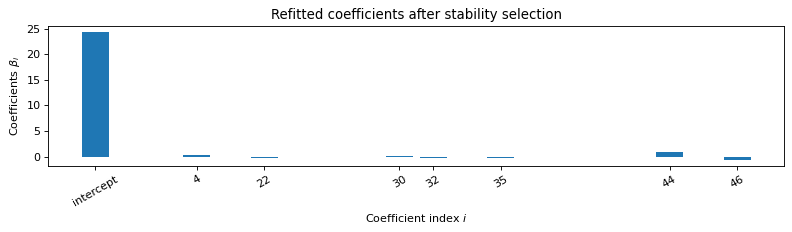


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.042s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.127s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.26 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.21 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.17 0.00 -0.23 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.84 0.00 -0.59]
Error: 0.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

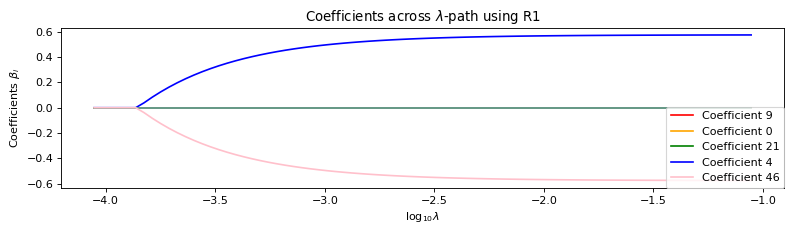

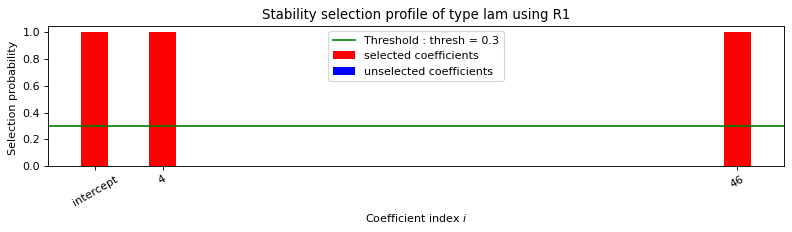

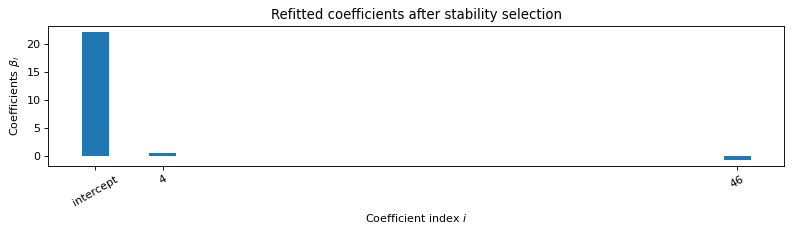


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 3.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


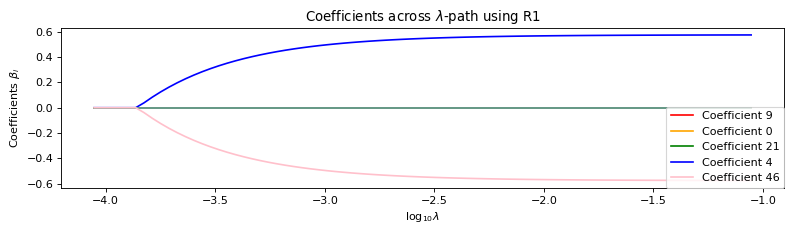

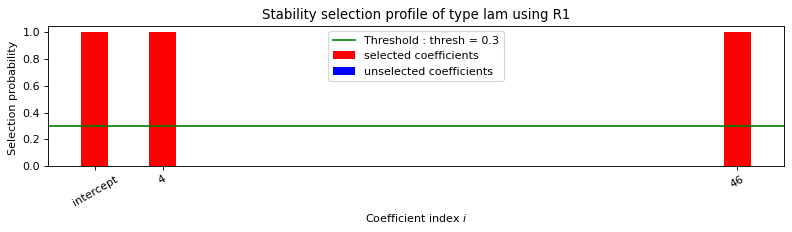

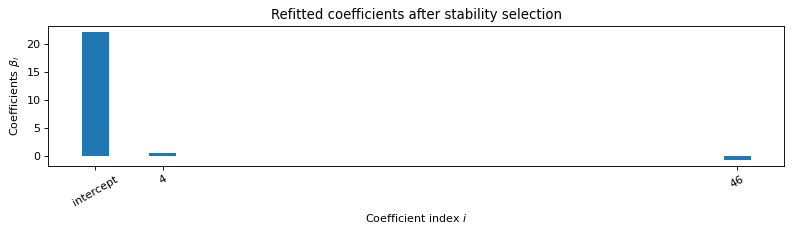


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.52 0.11 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.04

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -2877421.200
Model:                         IV2SLS   Adj. R-squared:           -3016310.414
Method:                     Two Stage   F-statistic:                -8.082e-18
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        08:52:09                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        326.7735   1.08e+12   3.02e-10      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.11 -0.19 0.02 0.02 0.02 0.02 0.02
 0.01 -0.20 0.03 0.01 0.03 0.02 0.01 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.77 0.04 0.57]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.45 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.11 0.19
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.20 -0.02 -0.01 -0.02 -0.02 -0.01
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.77 -0.02 -0.56]

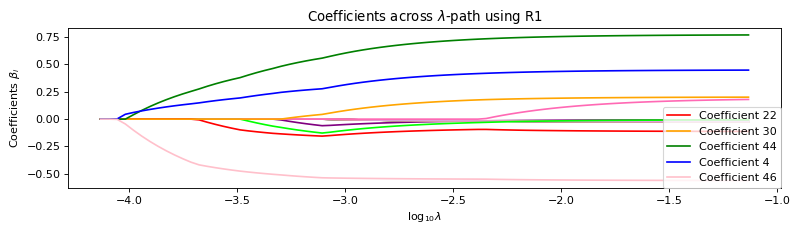

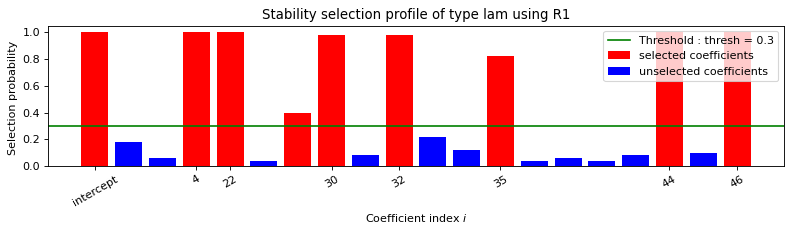

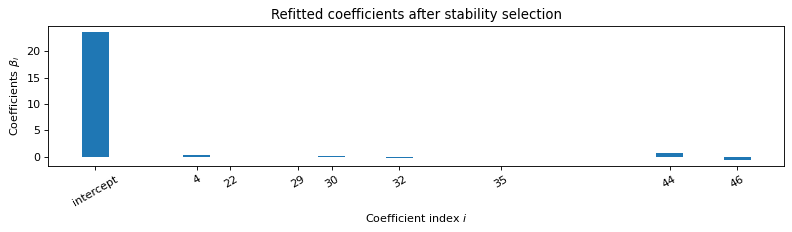


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.1s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.35 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00
 0.00 -0.11 0.13 0.00 -0.20 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.70 0.00 -0.57]
Error: 0.43

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------

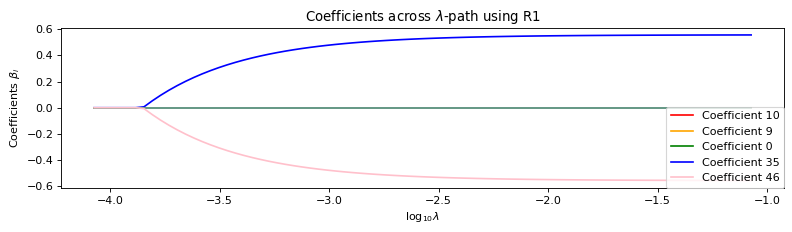

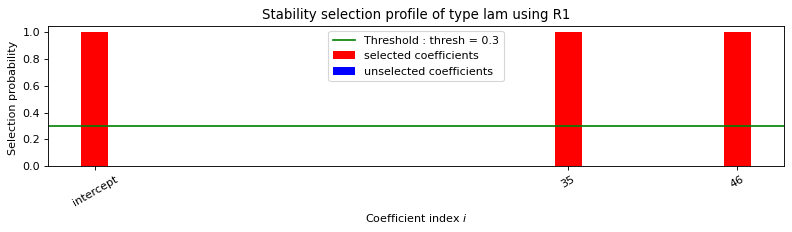

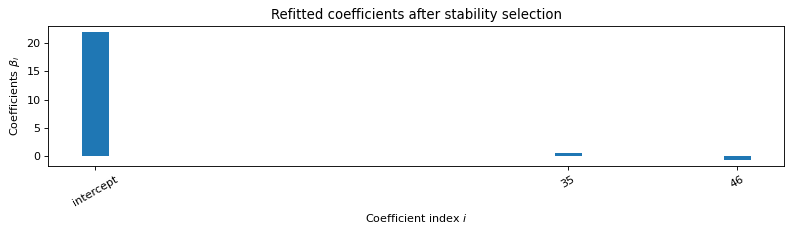


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    35    46    
   Running time :  0.078s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 7.26

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


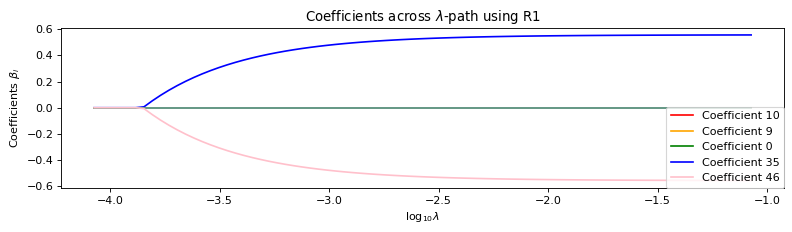

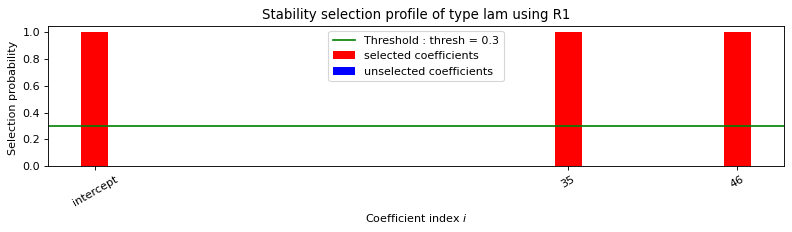

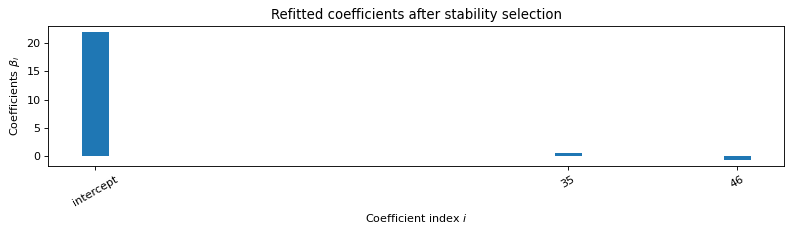


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    35    46    
   Running time :  0.056s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 -0.55 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.56]
Error: 7.26

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.43

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -18947.265
Model:                         IV2SLS   Adj. R-squared:             -19861.872
Method:                     Two Stage   F-statistic:                 1.856e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        08:54:37                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -80.8535   1.42e+09  -5.68e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.41 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.12 -0.16 0.02 0.02 0.02 0.02 0.02
 -0.06 -0.17 0.03 0.01 0.02 0.02 0.08 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.80 0.04 0.60]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.44 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.13 0.16
 -0.02 -0.02 -0.02 -0.02 -0.02 0.06 0.17 -0.02 0.00 -0.02 -0.02 -0.08
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.80 -0.02 -0.60]


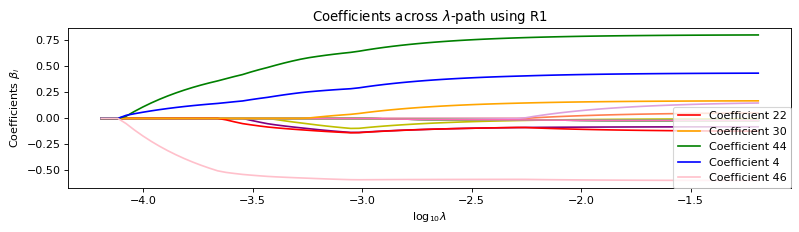

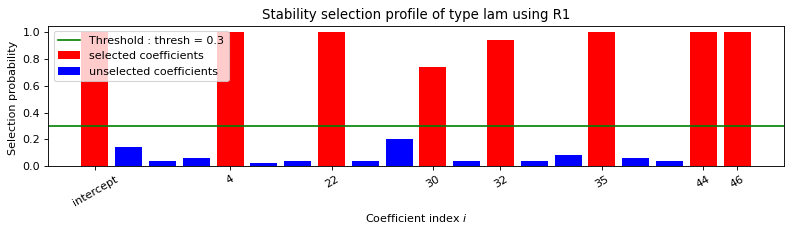

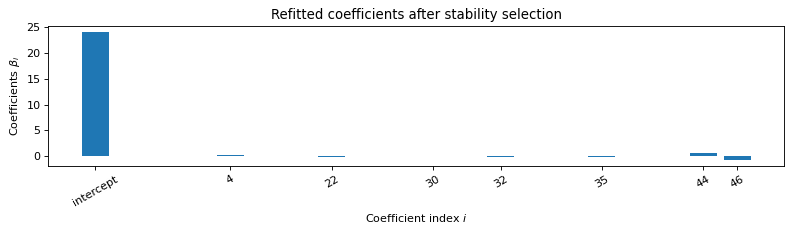


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.119s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.18 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.10 0.00 -0.17 0.00 0.00 -0.20 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.73 0.00 -0.61]
Error: 0.55

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

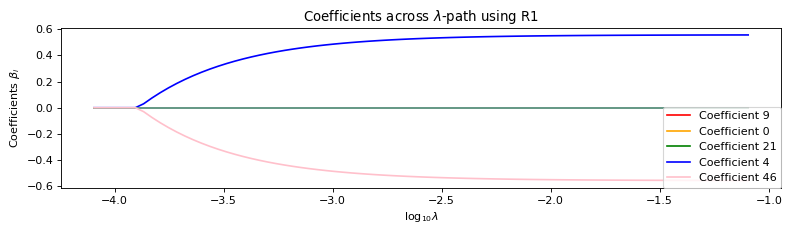

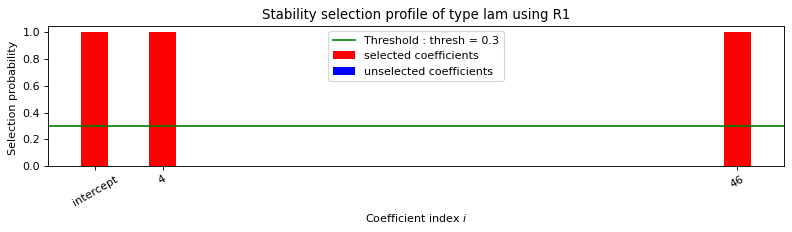

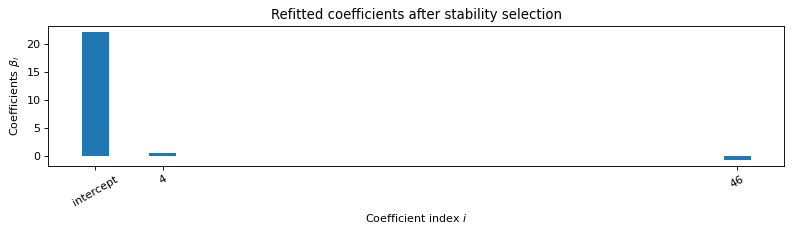


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.082s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 3.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


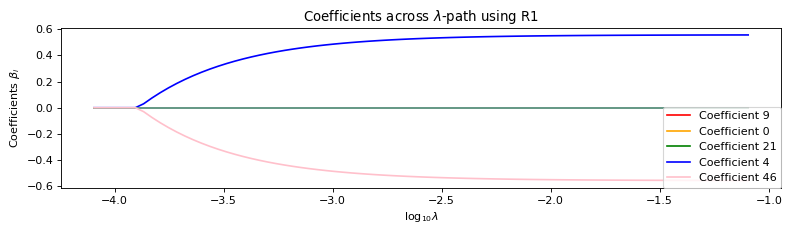

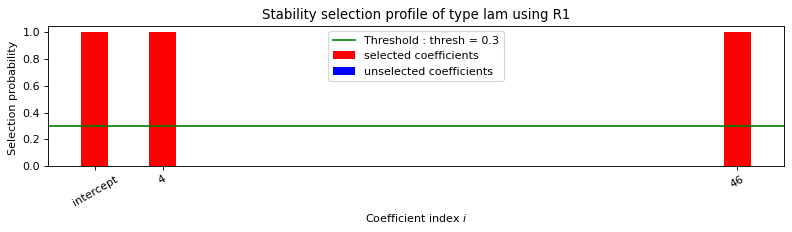

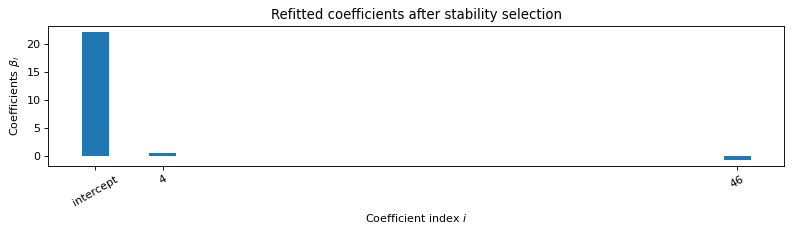


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.56]
Error: 3.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 15.07

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -16262.854
Model:                         IV2SLS   Adj. R-squared:             -17047.888
Method:                     Two Stage   F-statistic:                -1.460e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        08:57:11                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.9690        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.33 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.19 0.07 0.01 0.00 0.00 0.00 0.00
 -0.01 -0.20 0.01 0.10 0.01 0.01 0.17 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 -0.87 0.02 0.46]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.36 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.19 -0.08
 -0.01 -0.01 -0.01 -0.01 -0.01 0.01 0.19 -0.01 -0.10 -0.01 -0.01 -0.17
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.87 -0.01 -0.46]

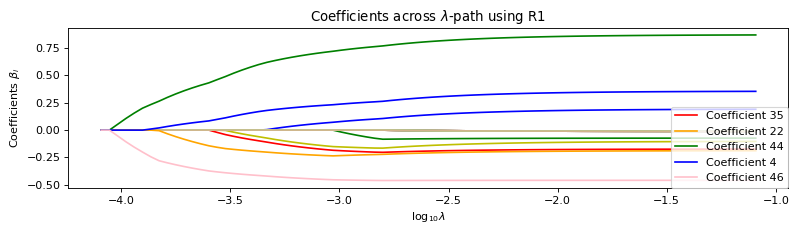

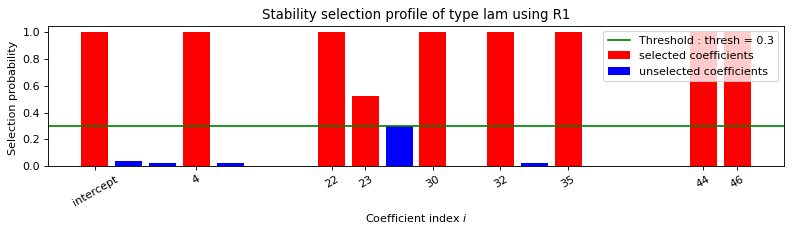

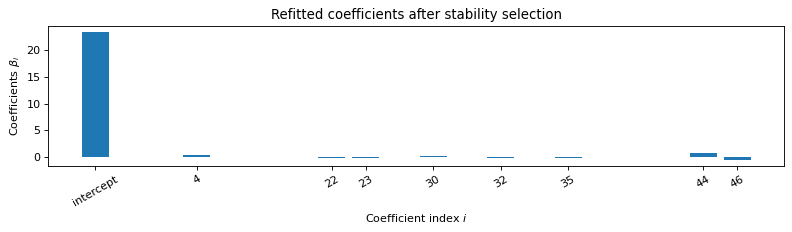


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.094s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.20 -0.21 0.00 0.00 0.00 0.00
 0.00 0.00 0.16 0.00 -0.19 0.00 0.00 -0.23 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.84 0.00 -0.47]
Error: 0.85

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

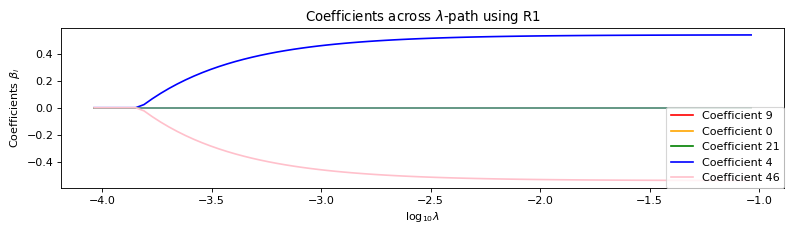

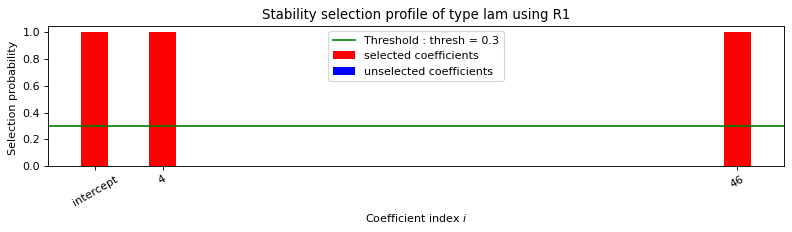

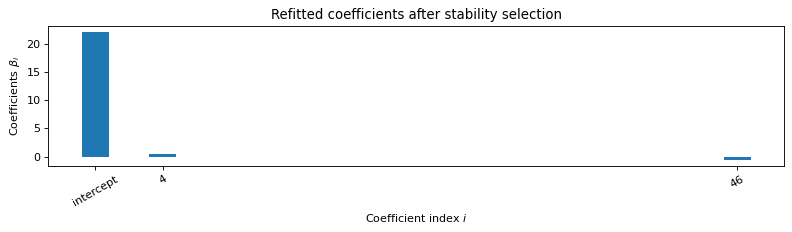


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.056s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.54 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.54]
Error: 3.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


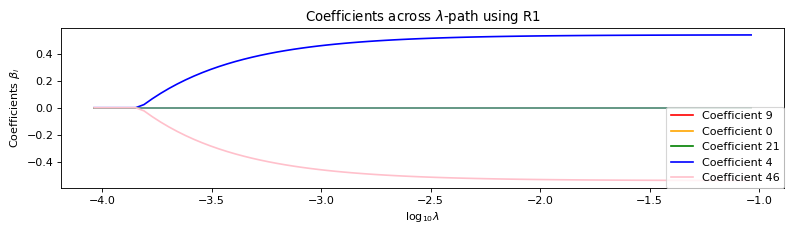

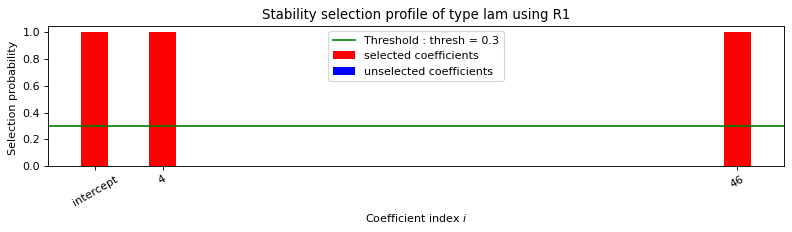

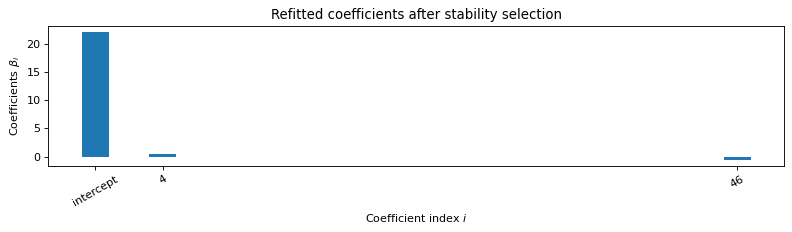


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.48 0.10 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.54]
Error: 3.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.2

---------------------------------------------------------------------------------------------


/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -163273.357
Model:                         IV2SLS   Adj. R-squared:            -171154.386
Method:                     Two Stage   F-statistic:                 1.788e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        08:59:42                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         40.3480        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.41 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.12 0.12 0.01 0.01 0.01 0.01 0.01
 -0.02 -0.19 0.02 0.15 0.01 0.01 0.04 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.77 0.02 0.57]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.44 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.11 -0.12
 -0.01 -0.01 -0.01 -0.01 -0.01 0.02 0.19 -0.01 -0.15 -0.01 -0.01 -0.04
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.77 -0.01 -0.57]

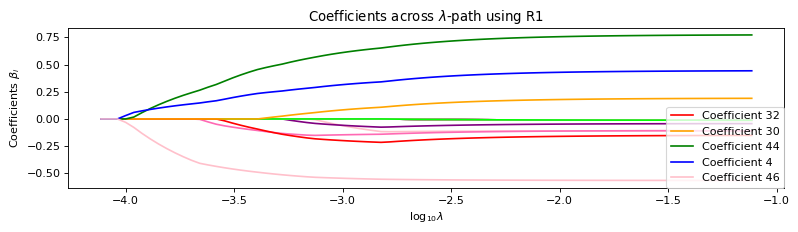

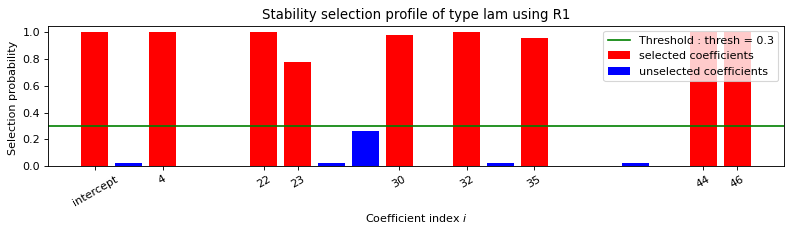

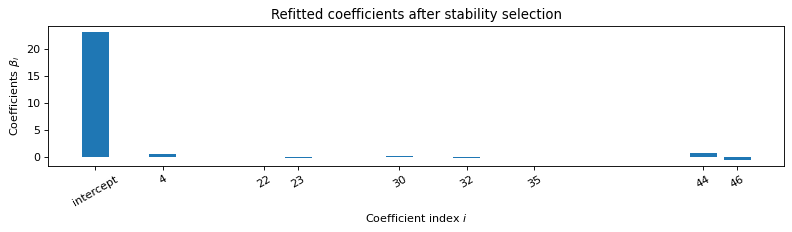


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.093s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.22 0.00 0.00 0.00 0.00
 0.00 0.00 0.16 0.00 -0.25 0.00 0.00 -0.11 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.74 0.00 -0.57]
Error: 0.5

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------

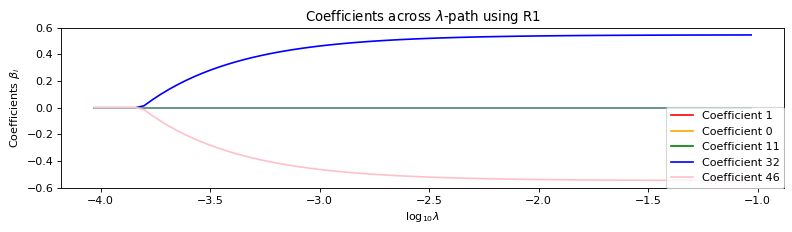

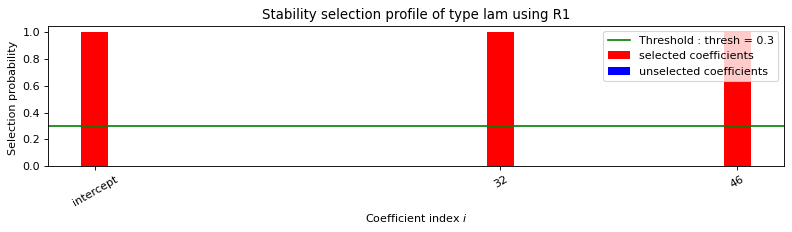

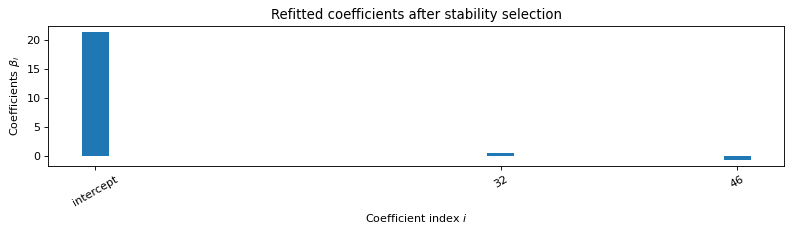


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.074s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.55 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.55]
Error: 8.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


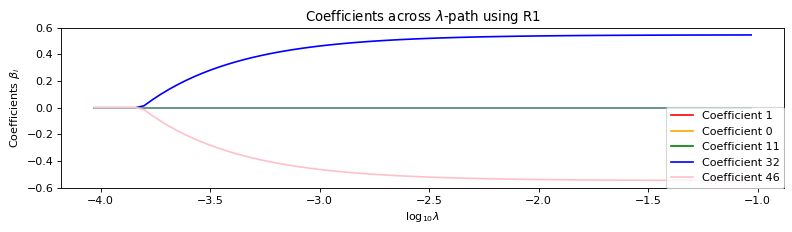

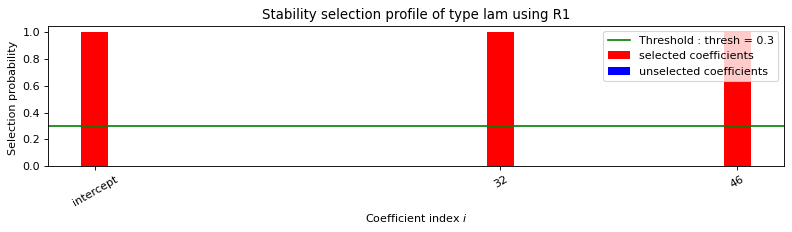

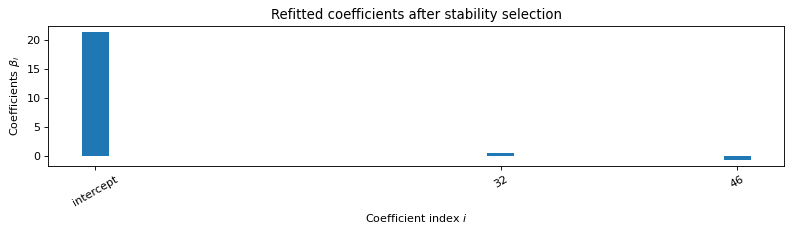


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.54 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.55]
Error: 8.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.67

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -37.254
Model:                         IV2SLS   Adj. R-squared:                -39.101
Method:                     Two Stage   F-statistic:                 7.583e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:02:06                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         21.0551        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.47 0.10 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.06 -0.07 0.02 0.02 0.02 0.02 0.02
 -0.01 -0.27 0.03 -0.10 0.03 0.03 0.06 0.03 0.03 0.03 0.03 0.02 0.02 0.02
 0.02 -0.81 0.04 0.52]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.50 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.06 0.07
 -0.03 -0.03 -0.03 -0.03 -0.03 0.00 0.26 -0.03 0.10 -0.03 -0.03 -0.06
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.82 -0.03 -0.51]

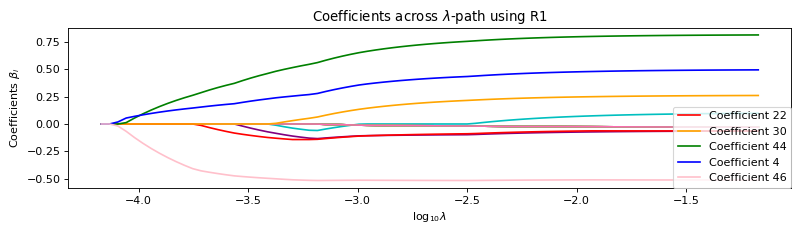

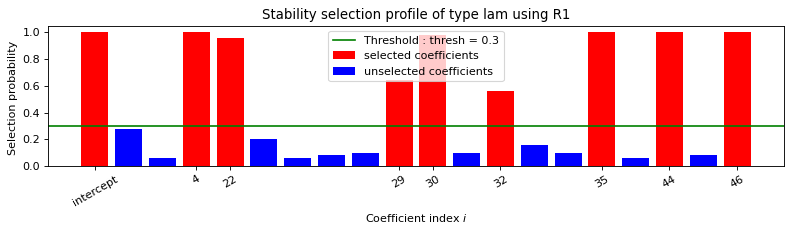

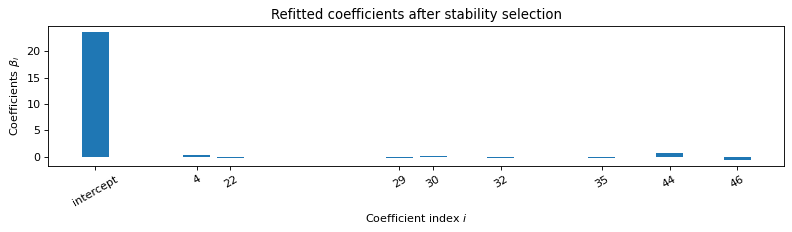


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.235s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00
 0.00 -0.14 0.16 0.00 -0.16 0.00 0.00 -0.23 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.70 0.00 -0.54]
Error: 0.55

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

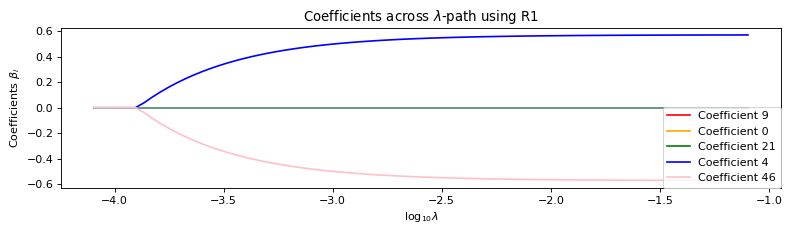

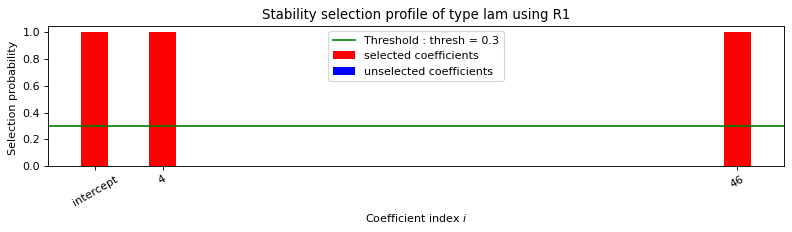

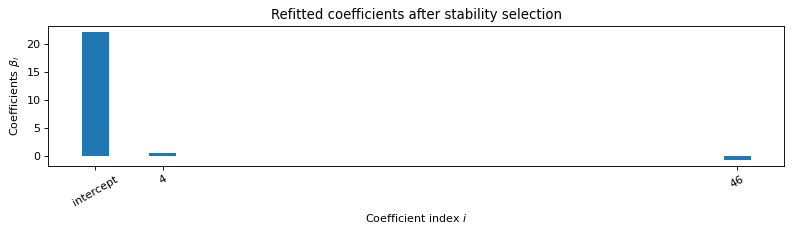


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.067s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 3.31

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


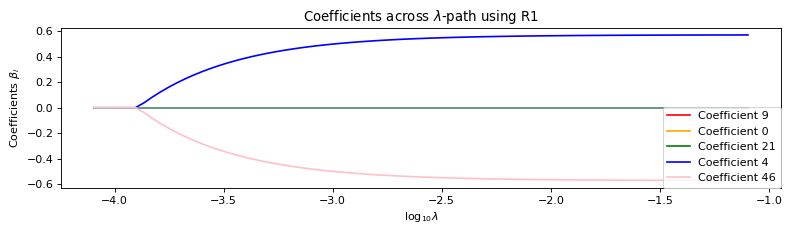

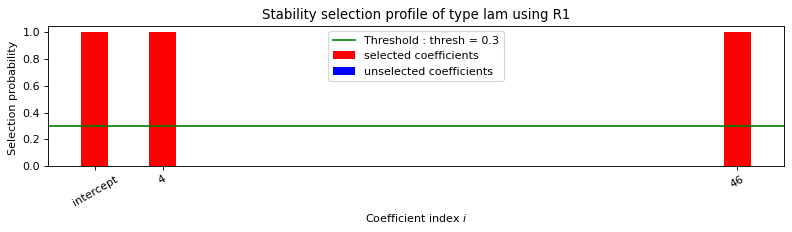

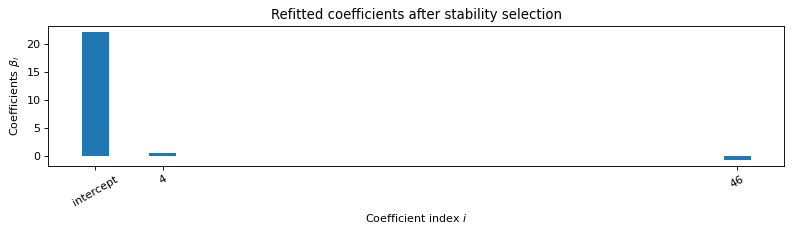


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.067s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.31

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.05

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -2434765.000
Model:                         IV2SLS   Adj. R-squared:           -2552287.808
Method:                     Two Stage   F-statistic:                -4.110e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:05:01                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1148.8636   3.35e+10   3.43e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.43 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.10 0.04 0.02 0.01 0.01 0.01 0.01
 0.04 -0.30 0.02 0.03 0.02 0.02 0.06 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 -0.85 0.03 0.52]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.46 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.11 -0.04
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.05 0.29 -0.02 -0.04 -0.02 -0.02 -0.06
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.85 -0.02 -0.51]

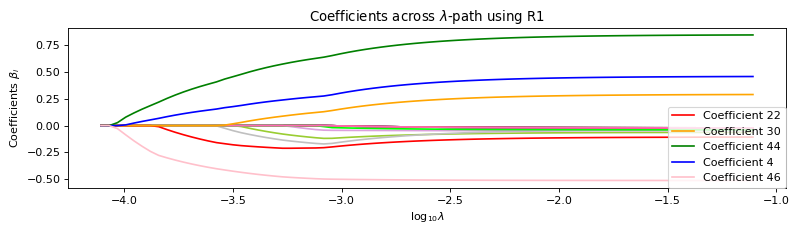

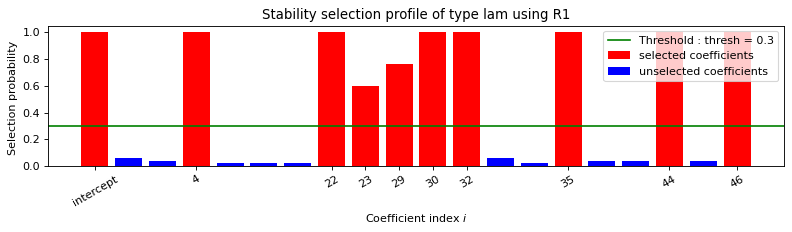

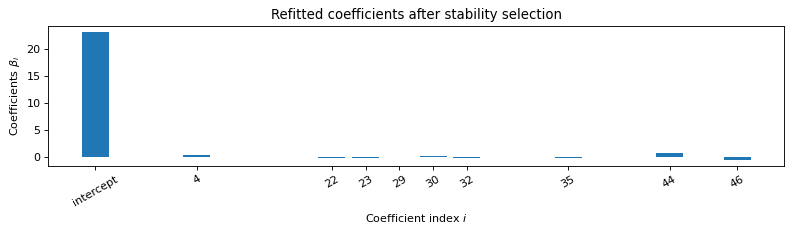


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.118s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.36 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.23 0.00 0.00 0.00 0.00
 0.00 -0.08 0.22 0.00 -0.21 0.00 0.00 -0.18 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.52]
Error: 0.75

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

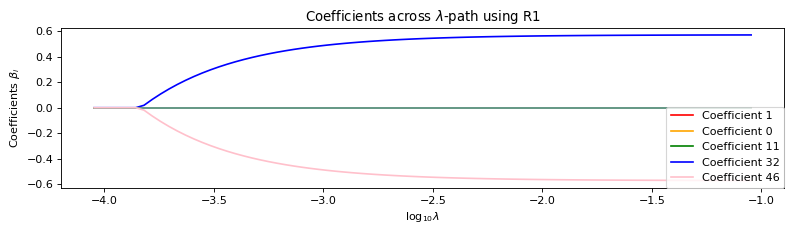

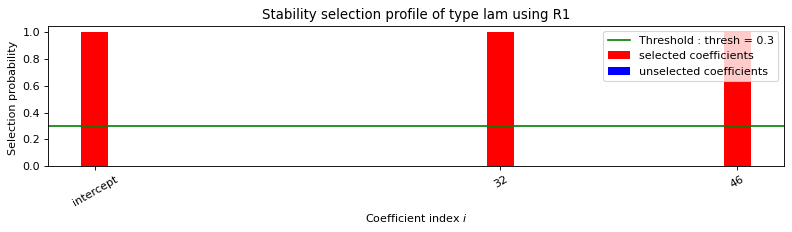

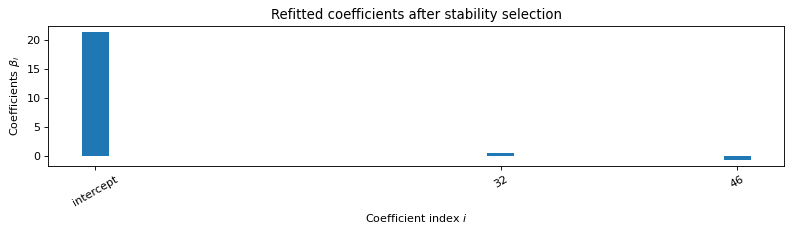


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.059s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 7.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


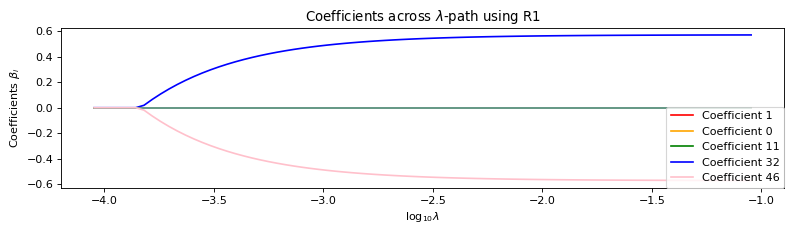

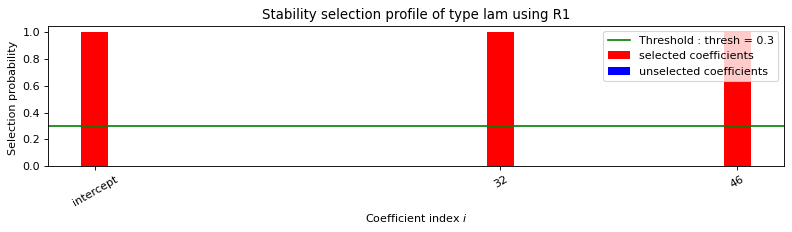

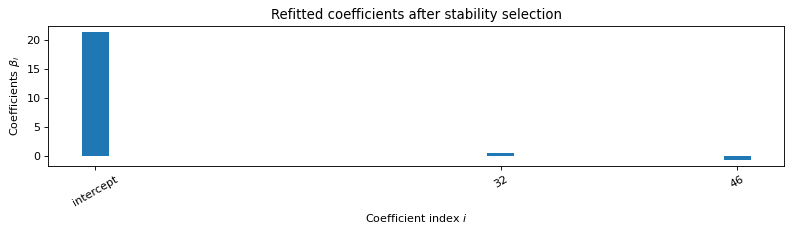


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.057s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.56 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 7.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.53

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -149608.888
Model:                         IV2SLS   Adj. R-squared:            -156830.352
Method:                     Two Stage   F-statistic:                 3.140e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:07:42                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.7719   3.28e+09    3.9e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.38 0.08 0.07 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.19 -0.16 0.02 0.02 0.02 0.02 0.01
 -0.04 -0.23 0.02 0.02 0.02 0.02 0.01 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.87 0.04 0.51]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.40 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.20 0.15
 -0.02 -0.02 -0.02 -0.02 -0.02 0.03 0.23 -0.02 -0.03 -0.02 -0.02 -0.01
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.88 -0.02 -0.51]

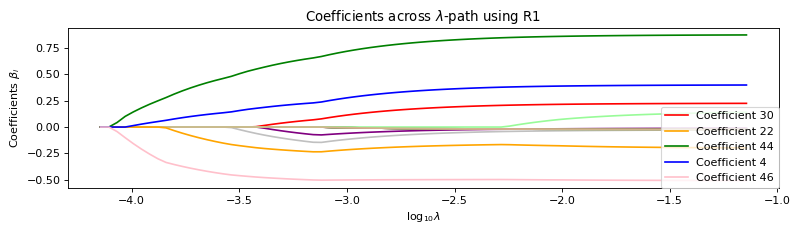

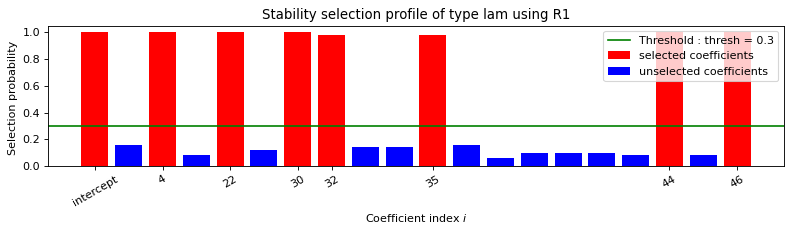

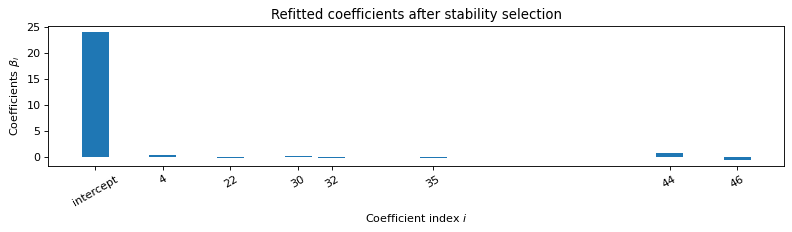


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.107s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.29 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.28 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.15 0.00 -0.24 0.00 0.00 -0.16 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.54]
Error: 0.7

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

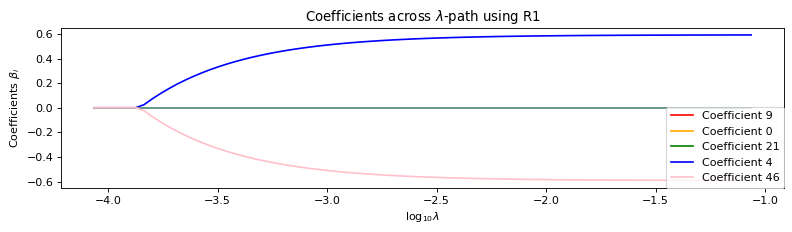

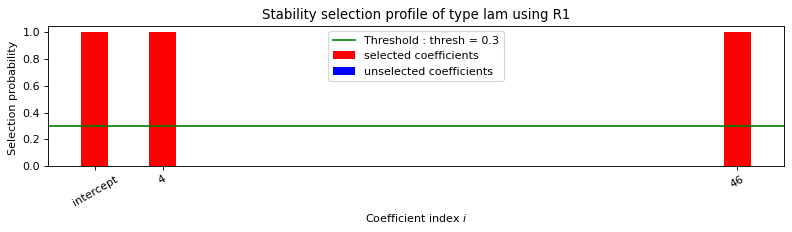

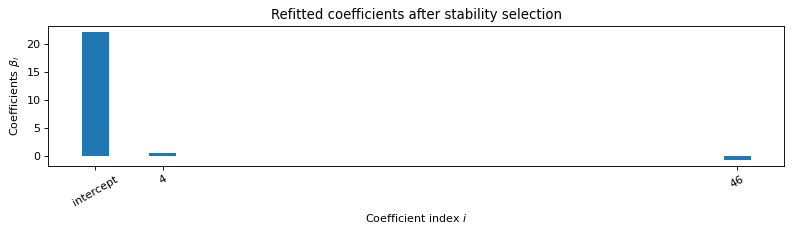


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 3.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


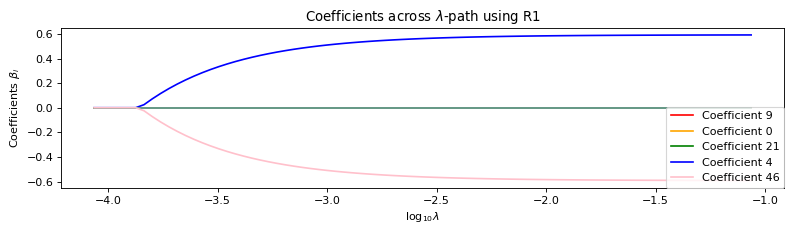

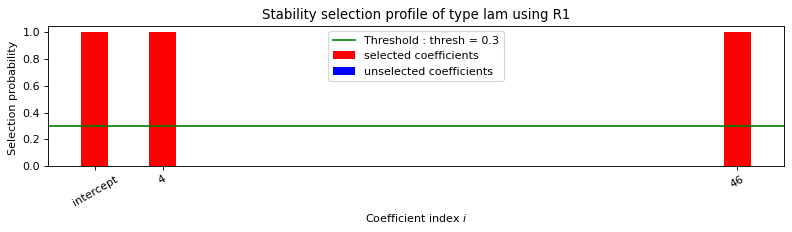

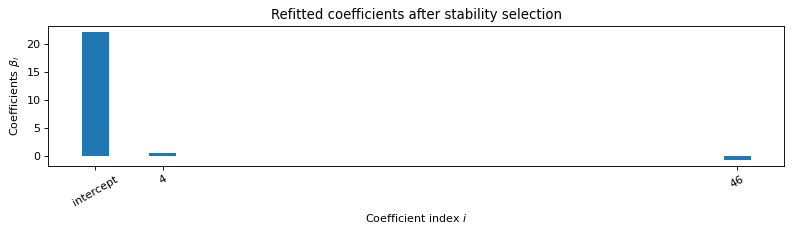


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 3.17

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.63

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -959.343
Model:                         IV2SLS   Adj. R-squared:              -1005.697
Method:                     Two Stage   F-statistic:                 2.611e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:10:22                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.9309   2.16e+08   -3.2e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.40 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.13 -0.05 0.02 0.02 0.01 0.01 0.01
 -0.05 -0.25 0.02 0.07 0.02 0.02 0.05 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.01 -0.86 0.03 0.53]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.43 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.14 0.04
 -0.02 -0.02 -0.02 -0.02 -0.02 0.04 0.25 -0.02 -0.07 -0.02 -0.02 -0.06
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.87 -0.02 -0.53]

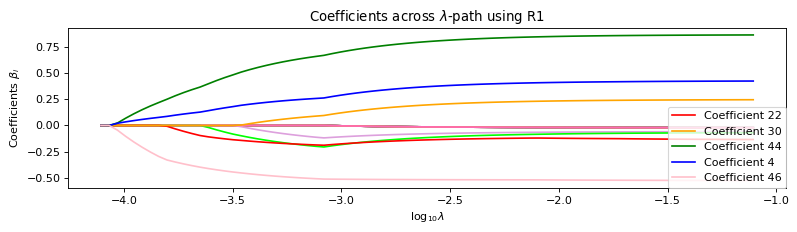

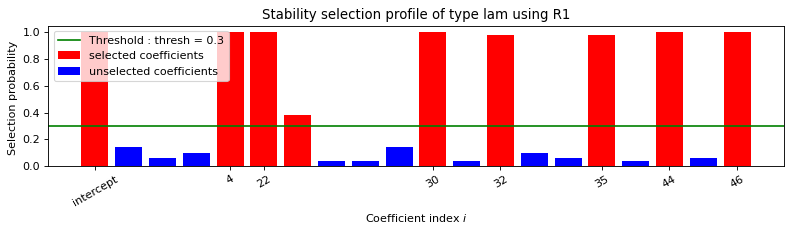

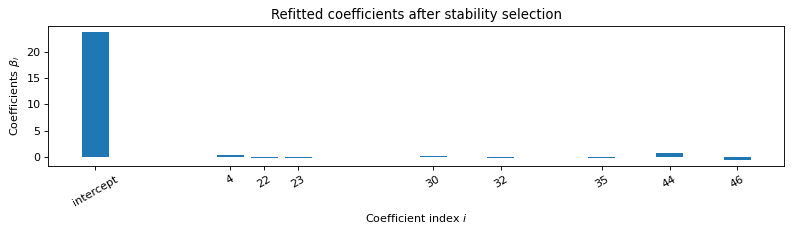


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.108s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.33 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.16 -0.18 0.00 0.00 0.00 0.00
 0.00 0.00 0.18 0.00 -0.25 0.00 0.00 -0.17 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.80 0.00 -0.54]
Error: 0.64

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

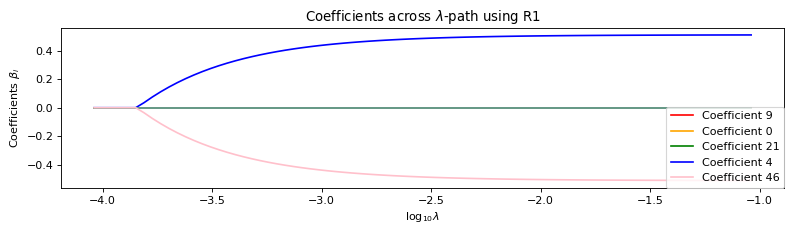

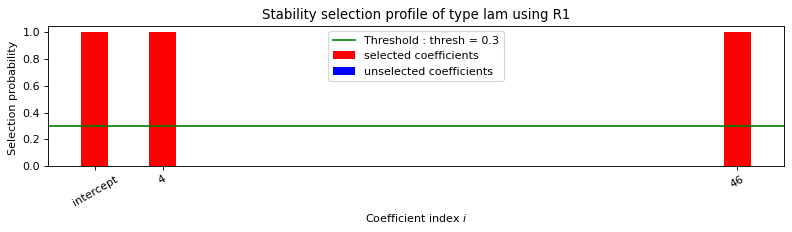

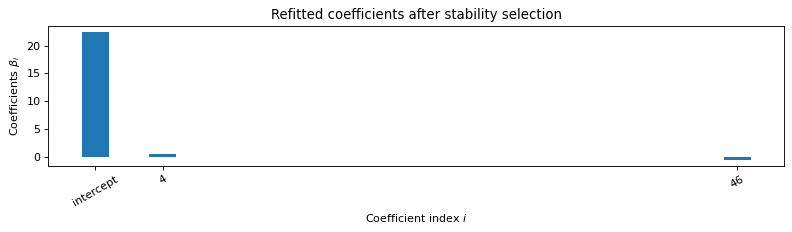


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.51 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.51]
Error: 3.45

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


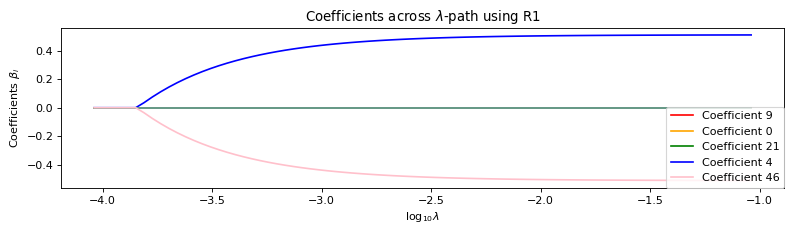

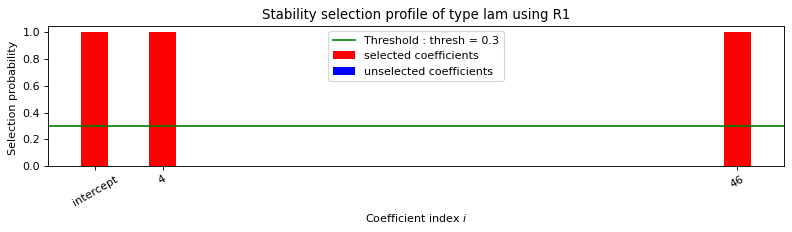

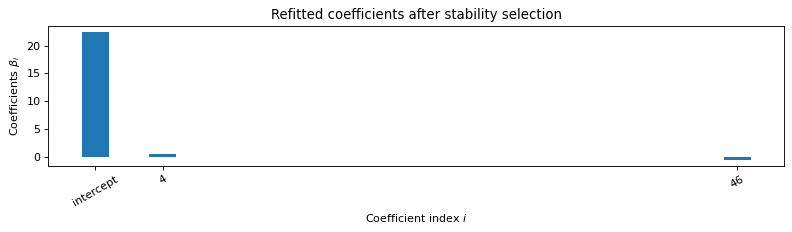


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.46 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.52]
Error: 3.45

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.76

---------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -706.840
Model:                         IV2SLS   Adj. R-squared:               -741.007
Method:                     Two Stage   F-statistic:                -4.540e-19
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:12:51                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.3570   4.22e+08  -2.92e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.46 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.14 -0.04 0.02 0.02 0.02 0.02 0.02
 0.03 -0.28 0.02 -0.04 0.02 0.02 -0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.90 0.04 0.53]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.49 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.15 0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.04 0.27 -0.03 0.03 -0.03 -0.03 0.02
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.90 -0.03 -0.53]

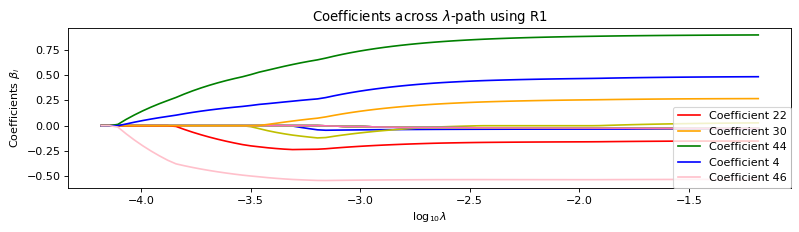

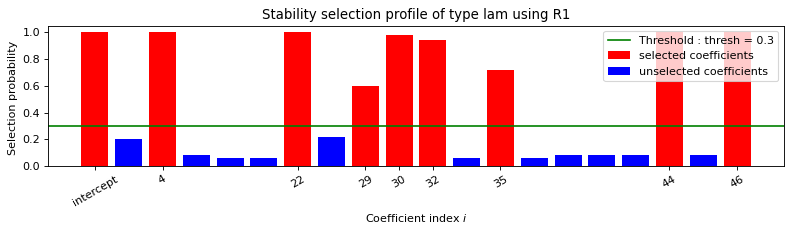

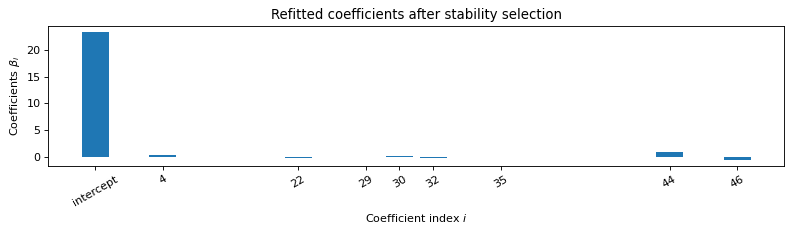


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.114s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00
 0.00 -0.16 0.17 0.00 -0.21 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.80 0.00 -0.57]
Error: 0.76

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

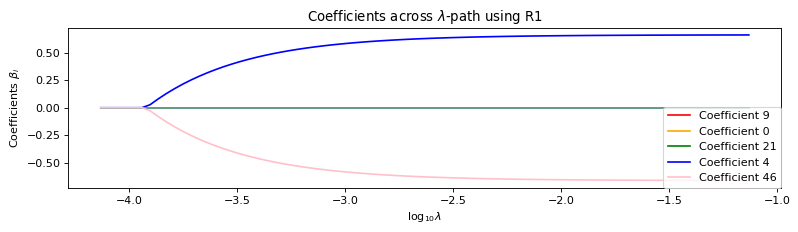

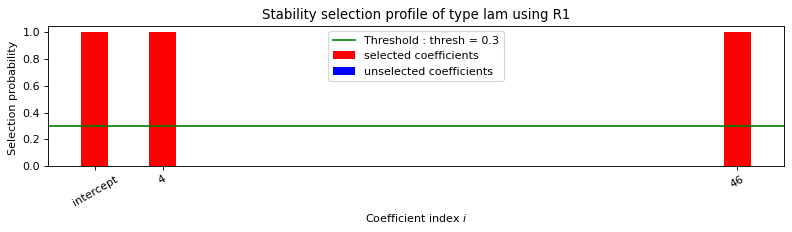

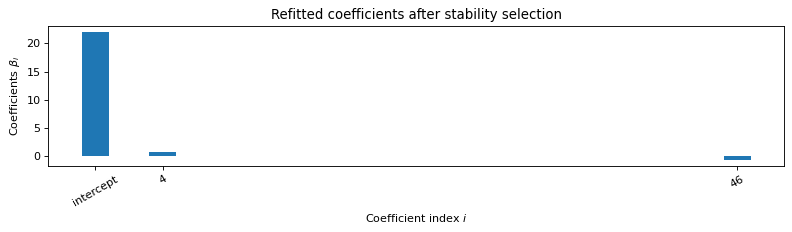


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.056s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.66 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.66]
Error: 3.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


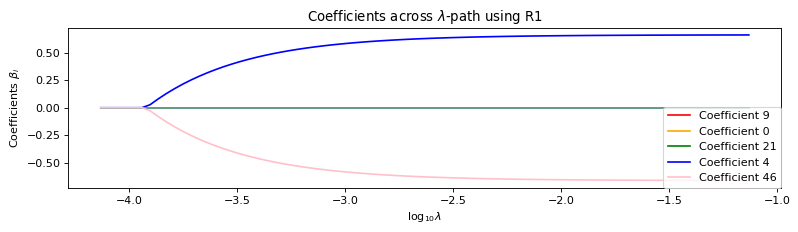

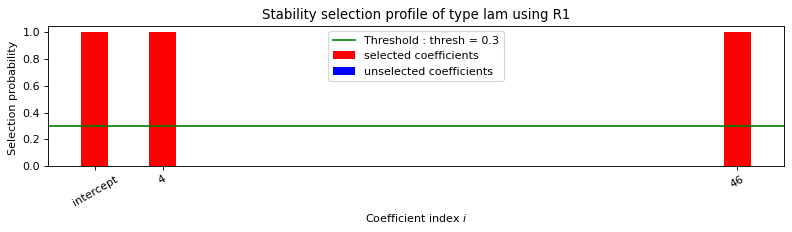

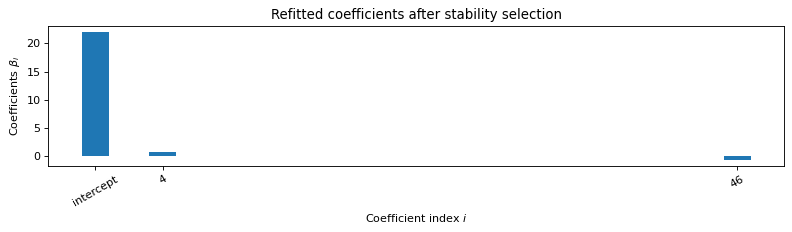


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.59 0.12 0.10 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.05
 0.04 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.01 0.01 0.67]
Error: 3.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.83

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -26031.317
Model:                         IV2SLS   Adj. R-squared:             -27287.862
Method:                     Two Stage   F-statistic:                 1.507e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:15:27                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0768        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.40 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.11 0.02 0.01 0.01 0.01 0.01 0.01
 -0.14 -0.21 0.02 0.00 0.02 0.02 0.04 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.92 0.04 0.53]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.42 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.12 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 0.13 0.21 -0.03 0.00 -0.03 -0.03 -0.04
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.92 -0.03 -0.52]


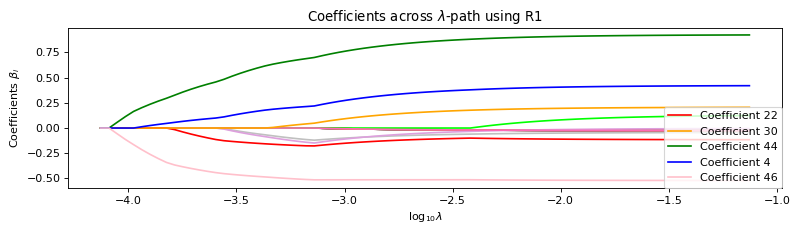

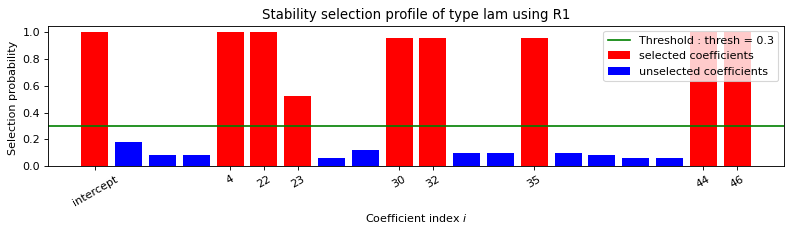

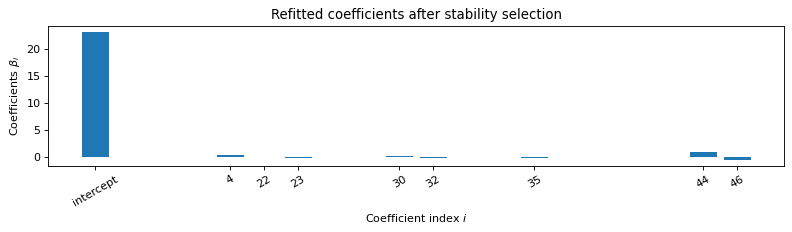


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.108s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.30 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.27 0.00 0.00 0.00 0.00
 0.00 0.00 0.14 0.00 -0.19 0.00 0.00 -0.16 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.84 0.00 -0.53]
Error: 0.65

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

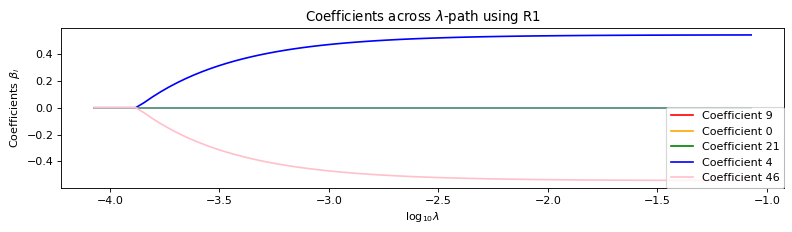

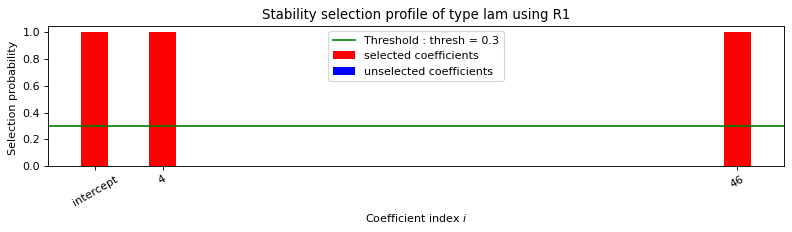

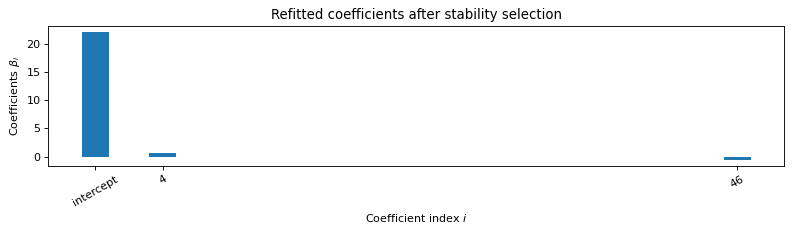


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.54 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.54]
Error: 3.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


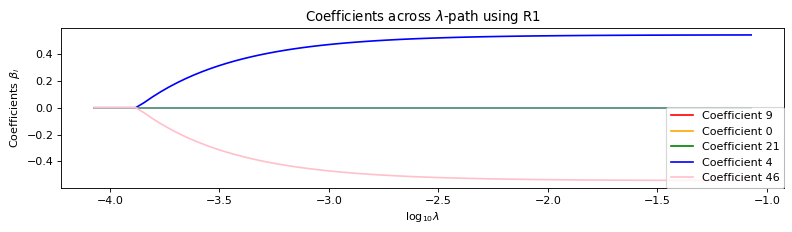

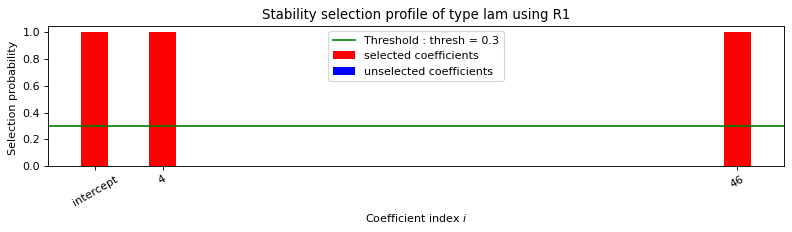

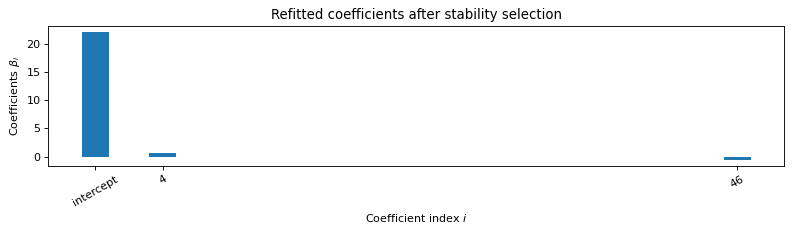


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.49 0.10 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.55]
Error: 3.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.96

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -3058.898
Model:                         IV2SLS   Adj. R-squared:              -3206.595
Method:                     Two Stage   F-statistic:                -4.222e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:17:57                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         15.7371        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.35 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.09 0.02 0.01 0.01 0.01 0.01 0.01
 0.05 -0.20 0.02 0.11 0.01 0.01 0.07 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.81 0.03 0.54]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.38 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.08 -0.02
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.06 0.20 -0.01 -0.11 -0.01 -0.01 -0.07
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.81 -0.01 -0.54]

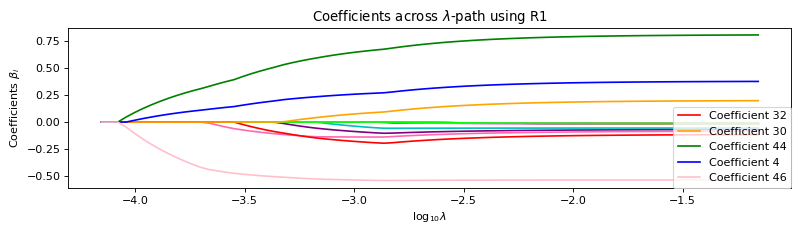

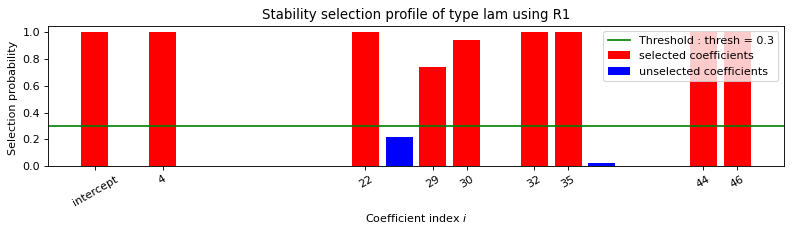

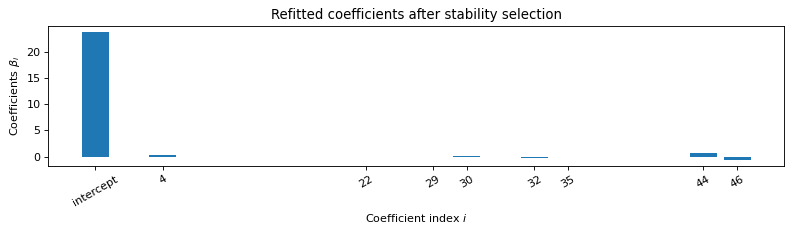


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.117s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00
 0.00 -0.11 0.14 0.00 -0.24 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.76 0.00 -0.56]
Error: 0.6

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------

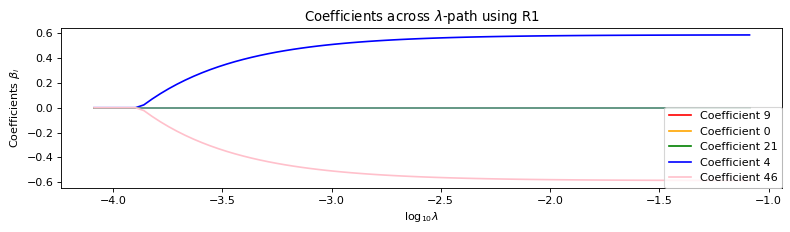

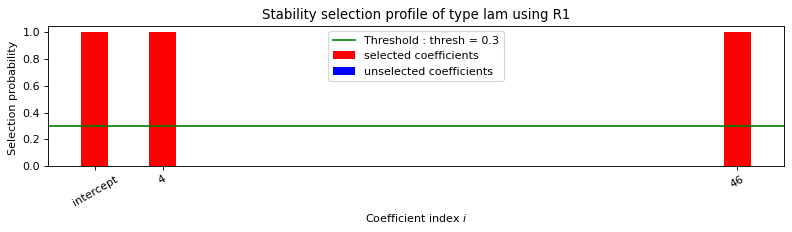

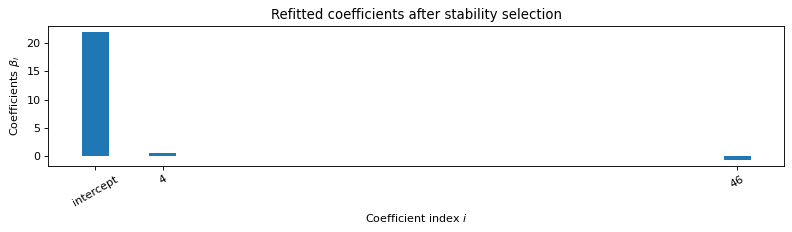


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 3.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


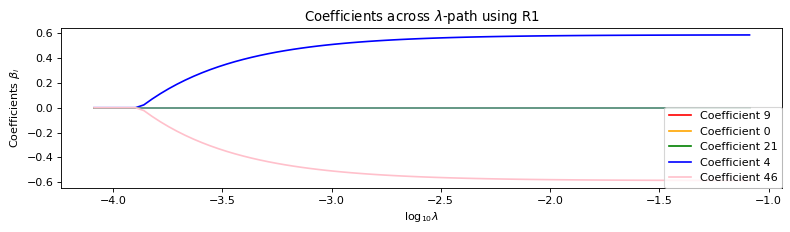

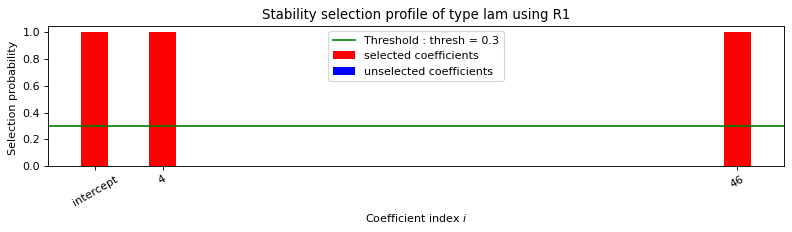

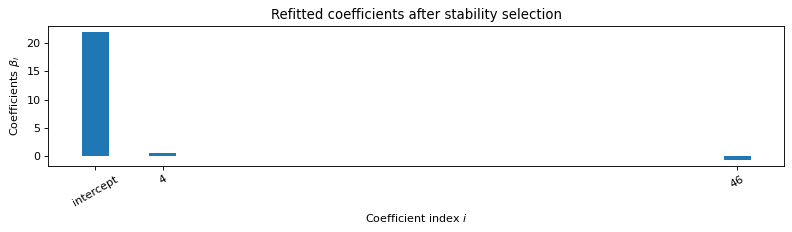


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.052s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 3.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.38

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:             -8842656305.136
Model:                         IV2SLS   Adj. R-squared:        -9269479169.861
Method:                     Two Stage   F-statistic:                -5.520e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:20:25                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       4102.5899   4.35e+11   9.44e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.13 -0.09 0.02 0.02 0.02 0.02 0.02
 -0.03 -0.26 0.03 -0.01 0.02 0.02 0.00 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.79 0.04 0.56]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.44 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.14 0.08
 -0.02 -0.02 -0.02 -0.02 -0.02 0.02 0.26 -0.02 0.01 -0.02 -0.02 0.00 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.80 -0.02 -0.55]


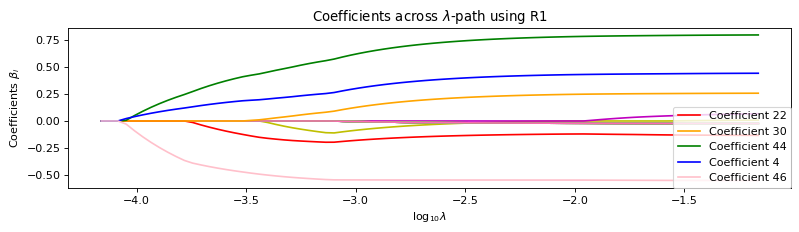

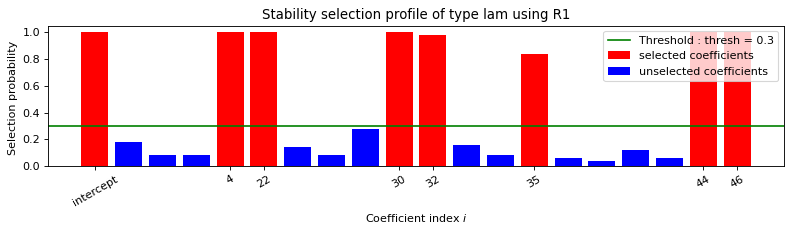

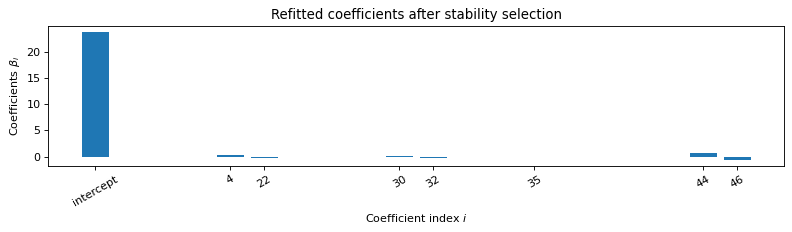


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.11s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.32 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.23 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.16 0.00 -0.22 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.70 0.00 -0.59]
Error: 0.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

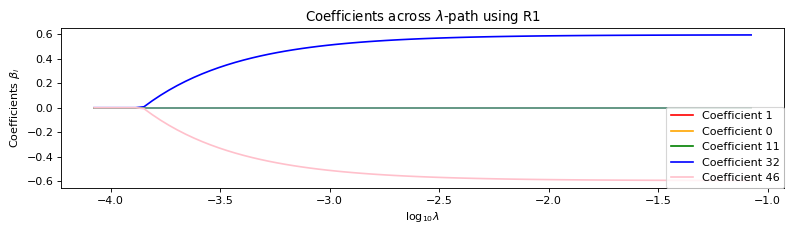

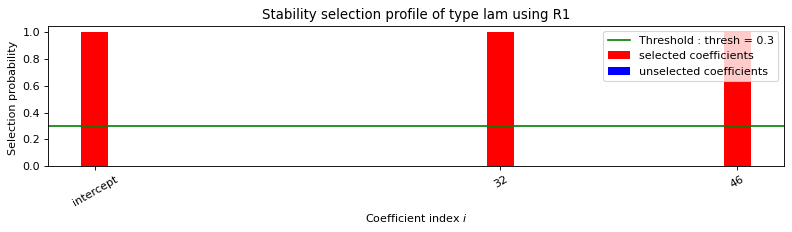

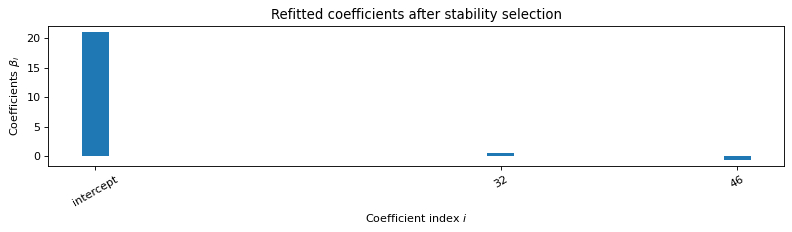


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.061s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 7.99

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


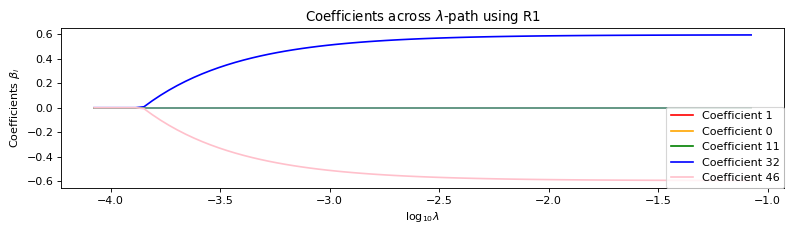

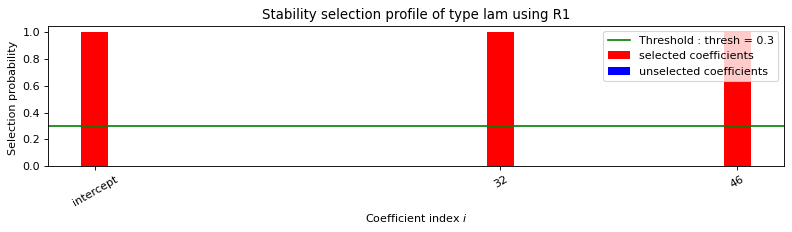

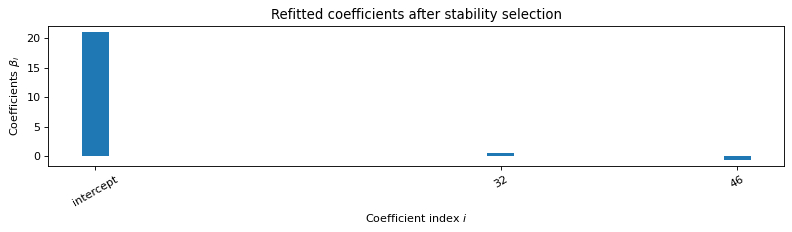


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.054s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.59 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 7.99

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.65

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -4450.435
Model:                         IV2SLS   Adj. R-squared:              -4665.300
Method:                     Two Stage   F-statistic:                -4.056e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:22:54                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -13.1283        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.14 -0.18 0.02 0.02 0.02 0.02 0.02
 -0.02 -0.19 0.03 0.01 0.02 0.02 0.07 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.82 0.04 0.53]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.45 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.15 0.18
 -0.02 -0.02 -0.02 -0.02 -0.02 0.01 0.19 -0.02 -0.01 -0.02 -0.02 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.83 -0.02 -0.53]

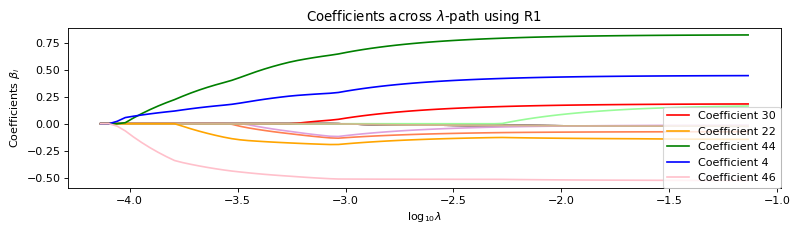

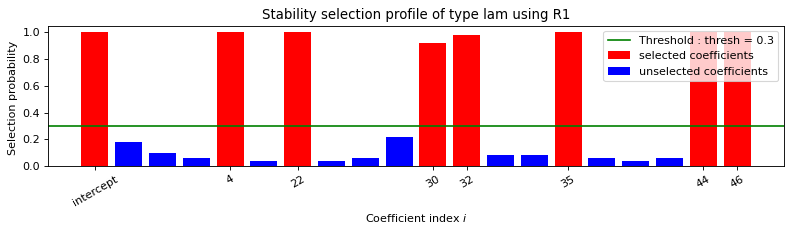

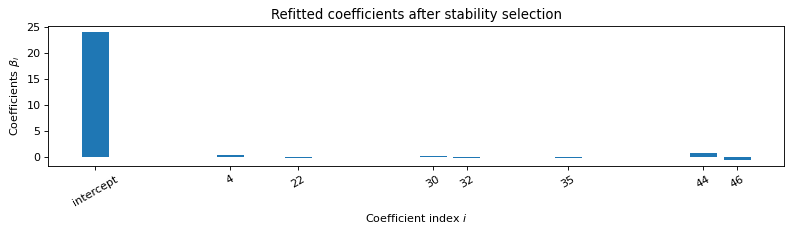


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.105s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.33 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.10 0.00 -0.20 0.00 0.00 -0.20 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.75 0.00 -0.56]
Error: 0.61

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

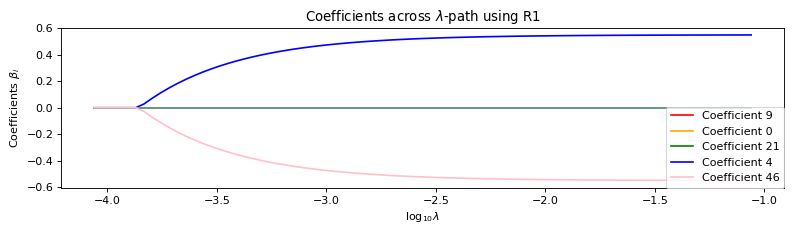

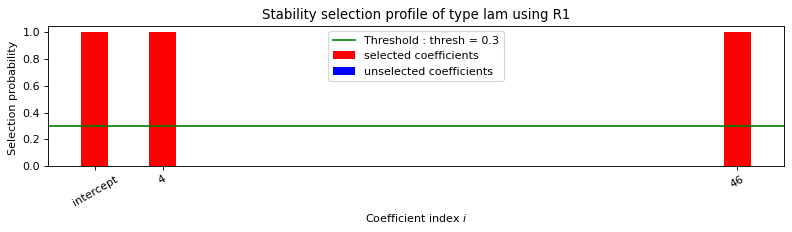

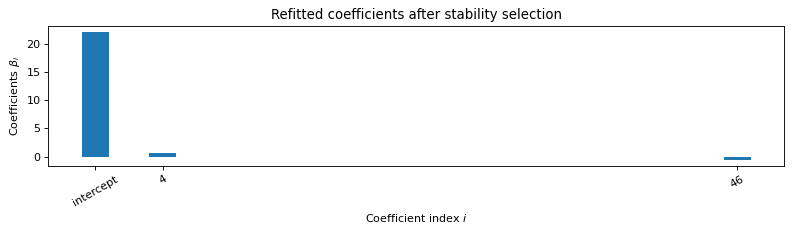


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.055s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.55 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.55]
Error: 3.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


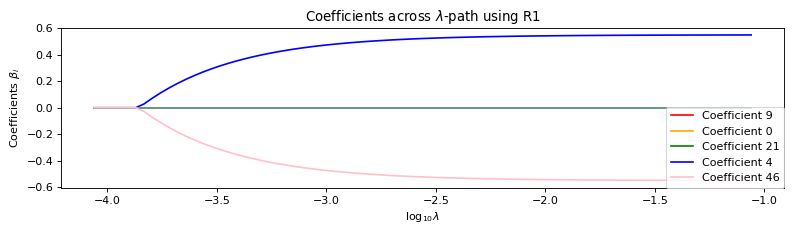

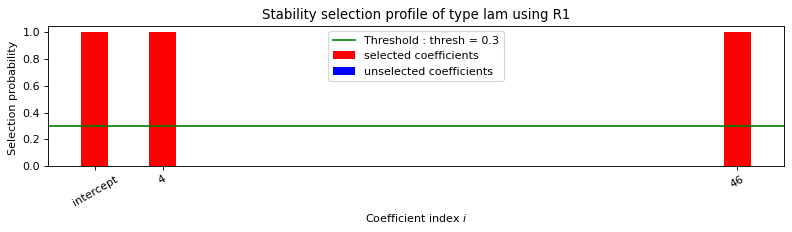

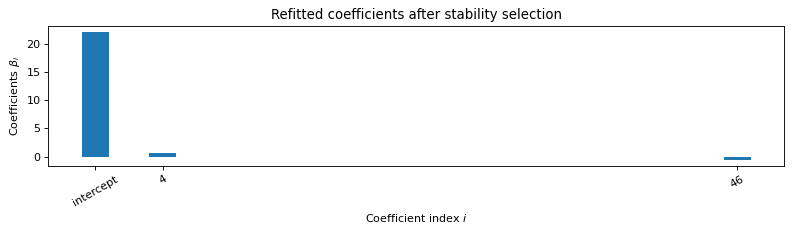


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.058s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.49 0.10 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.55]
Error: 3.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.92

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -869546.526
Model:                         IV2SLS   Adj. R-squared:            -911518.390
Method:                     Two Stage   F-statistic:                -1.203e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:25:32                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.1699        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.39 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.14 0.00 0.01 0.01 0.01 0.01 0.01
 0.01 -0.23 0.02 -0.04 0.02 0.02 0.07 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 -0.85 0.03 0.56]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.42 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.14 0.00
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.22 -0.02 0.04 -0.02 -0.02 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.85 -0.02 -0.55]


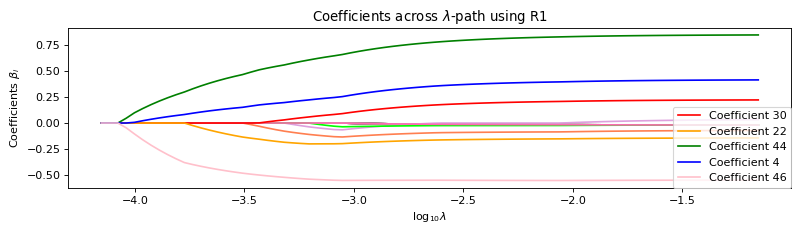

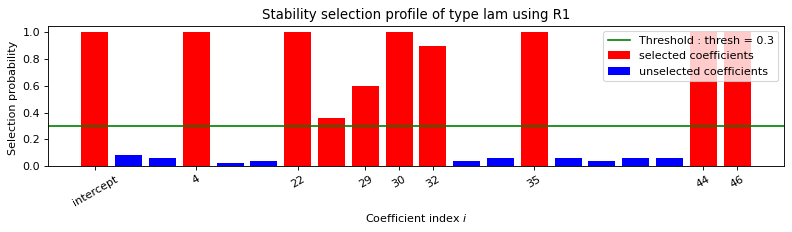

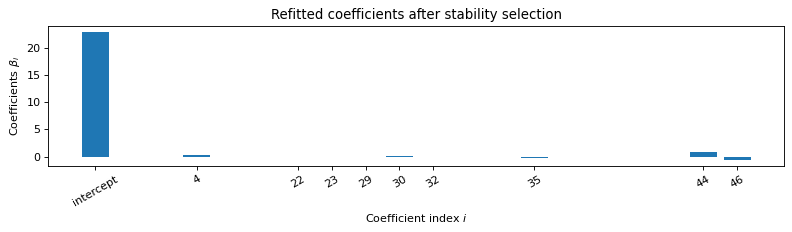


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.114s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.33 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.17 -0.16 0.00 0.00 0.00 0.00
 0.00 -0.08 0.17 0.00 -0.12 0.00 0.00 -0.19 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.79 0.00 -0.57]
Error: 0.66

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

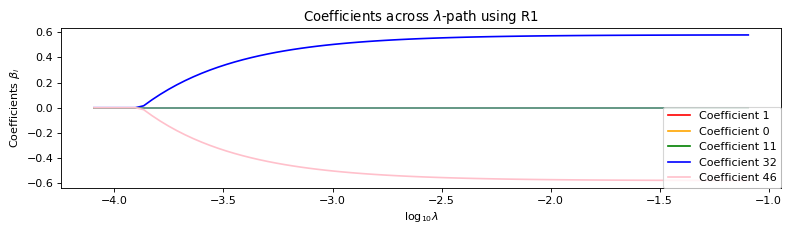

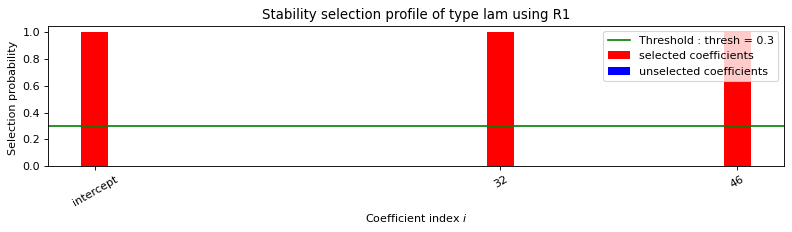

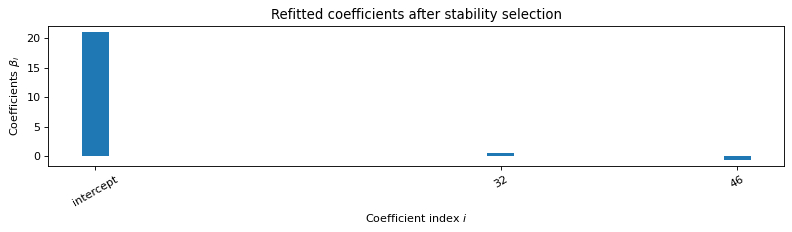


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 9.01

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


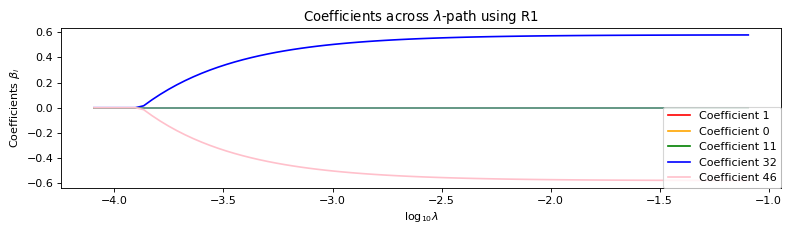

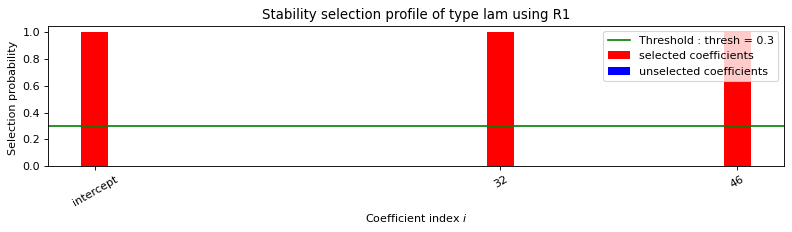

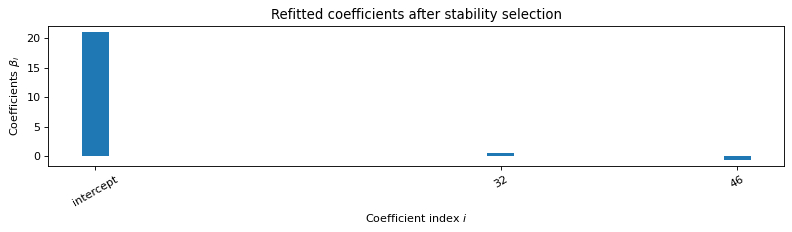


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.052s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.57 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 9.01

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.54

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -828.353
Model:                         IV2SLS   Adj. R-squared:               -868.384
Method:                     Two Stage   F-statistic:                -1.261e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:28:12                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         27.5843   1.57e+09   1.76e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.40 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.17 -0.01 0.01 0.01 0.01 0.01 0.01
 -0.02 -0.22 0.02 0.05 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.80 0.03 0.54]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.42 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.17 0.00
 -0.02 -0.02 -0.02 -0.02 -0.02 0.01 0.22 -0.02 -0.05 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.81 -0.02 -0.54]

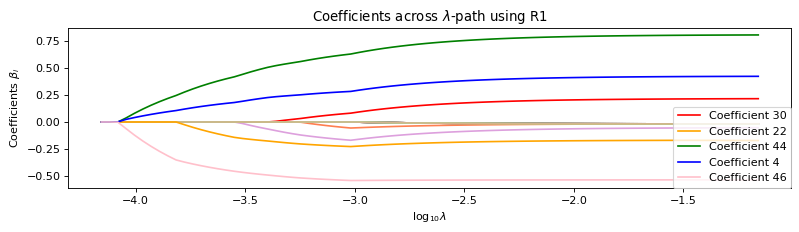

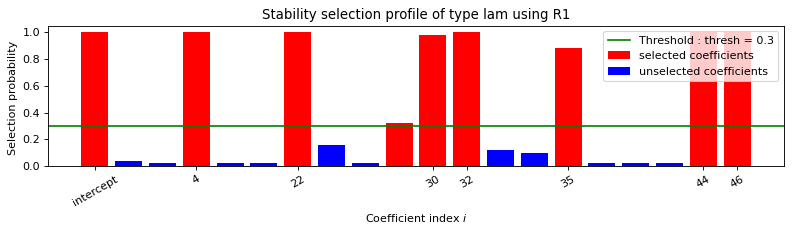

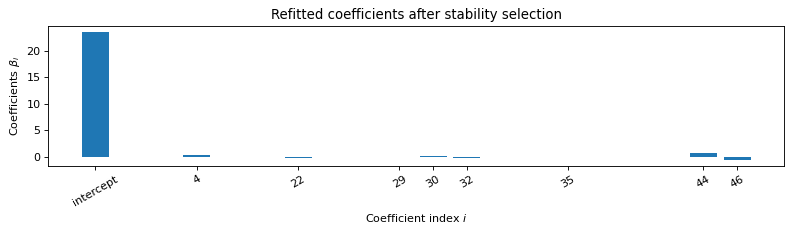


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.093s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.23 0.00 0.00 0.00 0.00 0.00
 0.00 -0.08 0.16 0.00 -0.23 0.00 0.00 -0.13 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.73 0.00 -0.57]
Error: 0.65

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

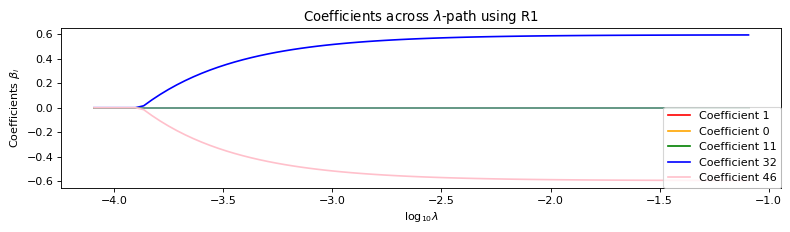

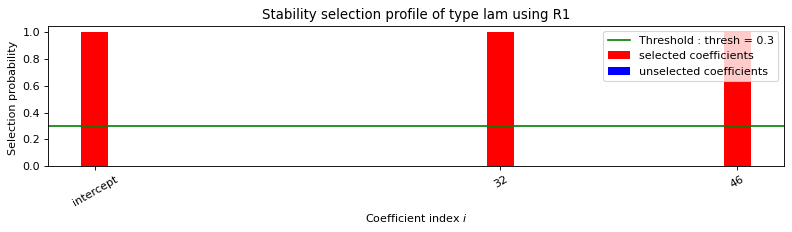

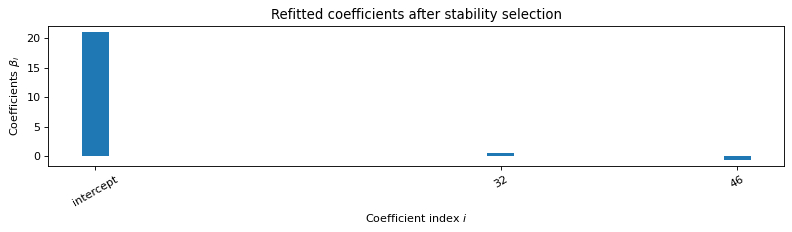


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 8.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


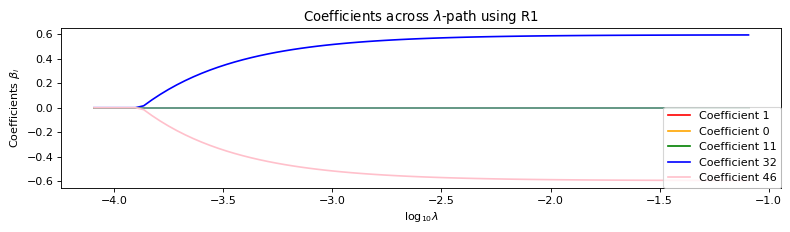

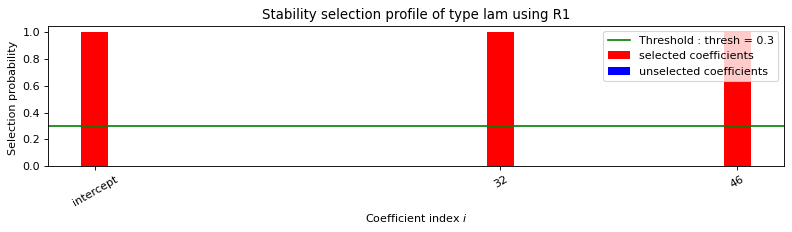

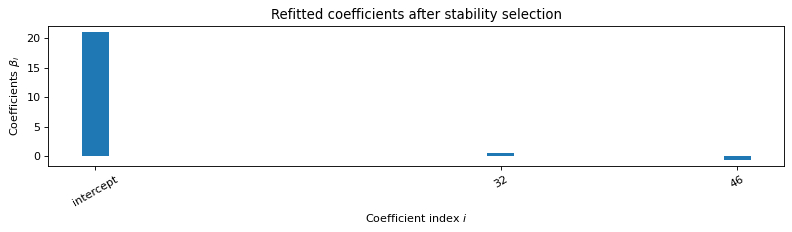


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.059s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.59 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 8.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.17

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -14658.510
Model:                         IV2SLS   Adj. R-squared:             -15366.104
Method:                     Two Stage   F-statistic:                 1.292e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:30:37                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.4121        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.37 0.08 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03 0.03
 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.10 -0.07 0.02 0.02 0.02 0.02 0.01
 0.03 -0.28 0.02 -0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.80 0.03 0.56]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.39 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.10 0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.03 0.28 -0.02 0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.80 -0.02 -0.55]

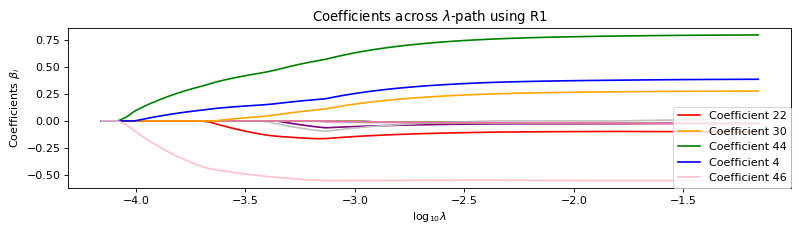

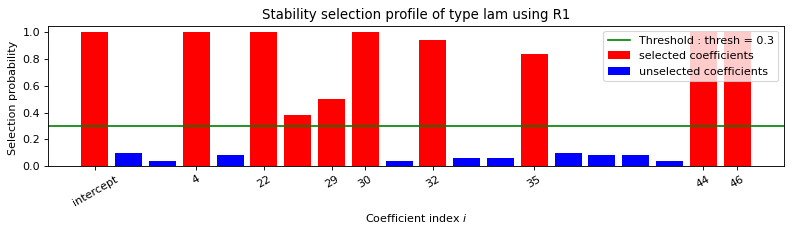

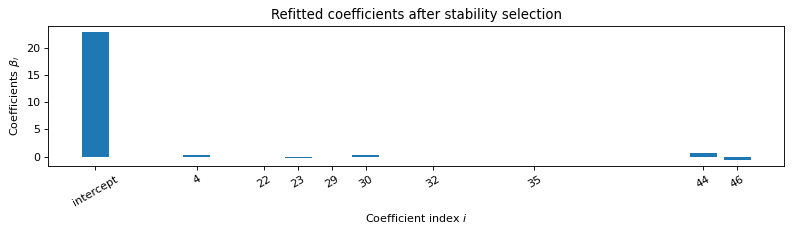


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.101s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.29 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.19 0.00 0.00 0.00 0.00
 0.00 -0.07 0.21 0.00 -0.16 0.00 0.00 -0.13 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.73 0.00 -0.57]
Error: 0.54

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

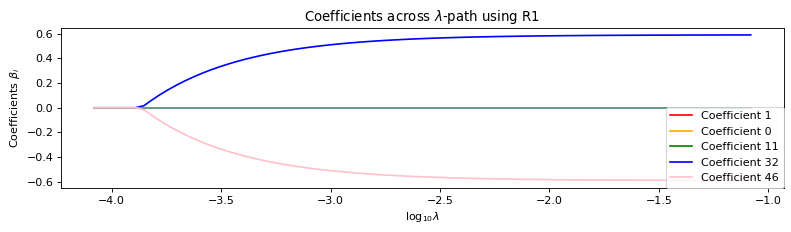

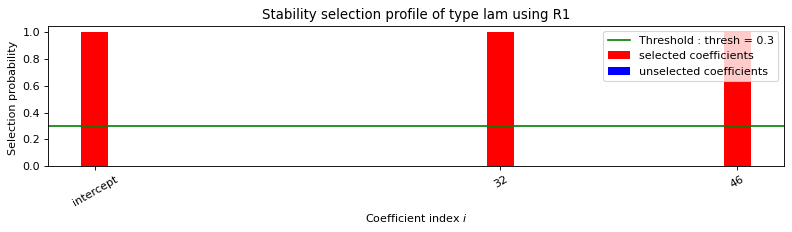

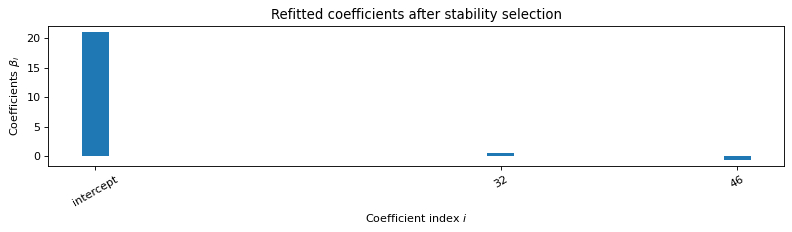


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 8.37

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


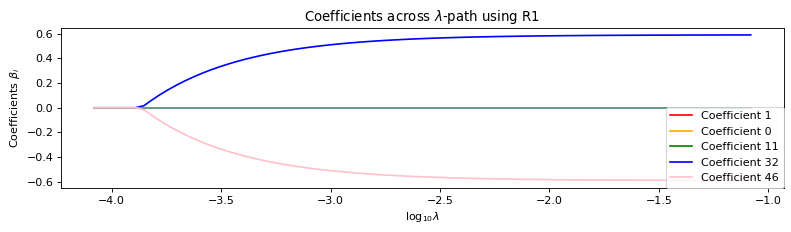

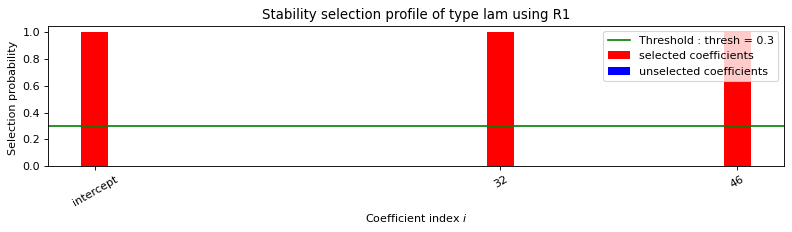

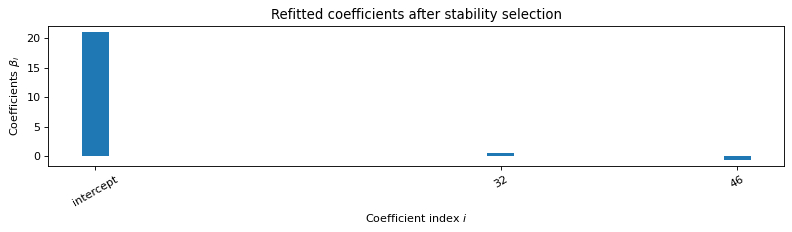


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.58 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 8.37

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.27

------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -6229.168
Model:                         IV2SLS   Adj. R-squared:              -6529.889
Method:                     Two Stage   F-statistic:                 4.361e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:32:56                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -10.6759   1.53e+09  -6.97e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.24 -0.02 0.01 0.01 0.01 0.01 0.01
 -0.08 -0.26 0.02 0.07 0.02 0.02 0.05 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.76 0.03 0.52]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.45 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.24 0.01
 -0.02 -0.02 -0.02 -0.02 -0.02 0.07 0.25 -0.02 -0.06 -0.02 -0.02 -0.05
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.76 -0.02 -0.52]

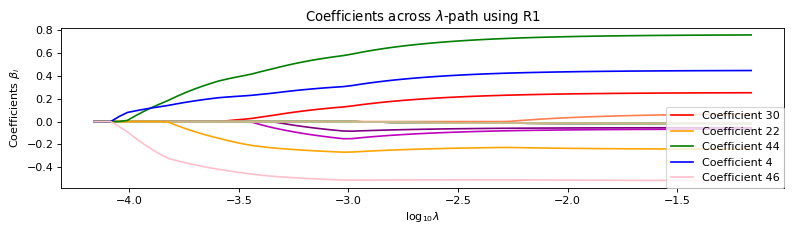

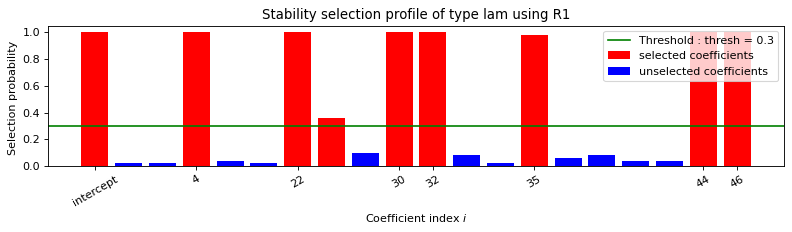

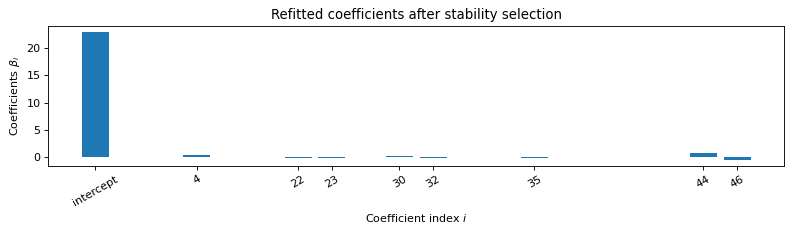


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.098s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.38 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.25 -0.18 0.00 0.00 0.00 0.00
 0.00 0.00 0.20 0.00 -0.20 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.70 0.00 -0.52]
Error: 0.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

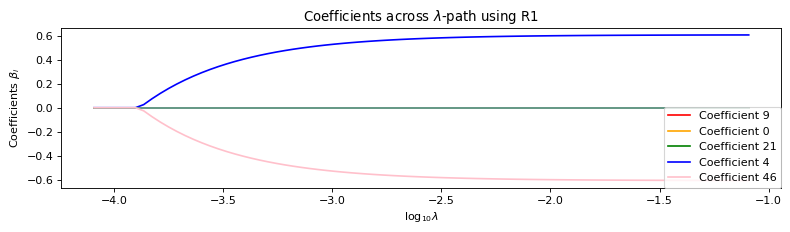

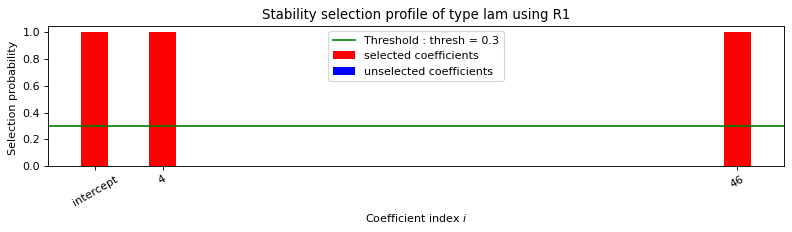

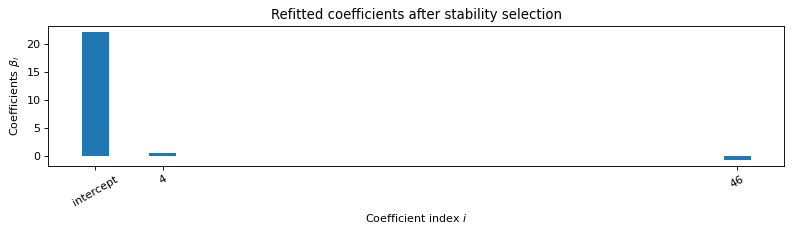


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.072s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.61 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.61]
Error: 3.66

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


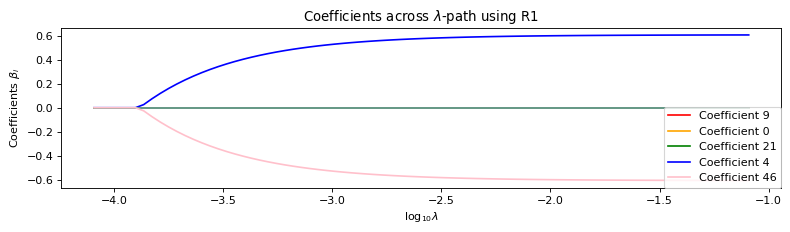

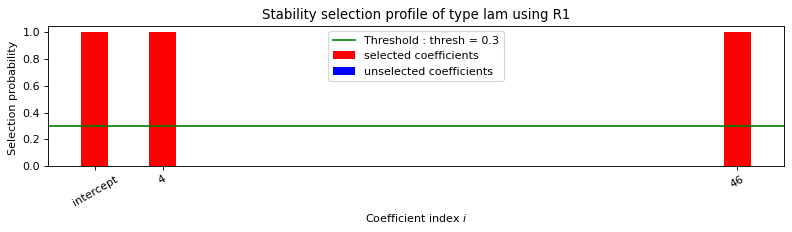

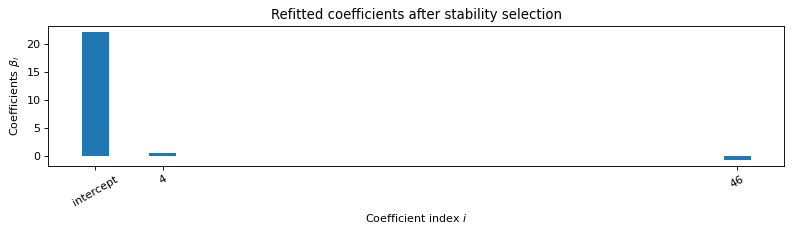


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.049s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.54 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.61]
Error: 3.66

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.16

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -6429.749
Model:                         IV2SLS   Adj. R-squared:              -6740.152
Method:                     Two Stage   F-statistic:                 9.042e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:35:16                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         19.0467   5.44e+08    3.5e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.38 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.14 0.04 0.01 0.01 0.01 0.01 0.01
 -0.12 -0.24 0.02 0.07 0.02 0.02 0.14 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.79 0.03 0.58]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.41 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.14 -0.05
 -0.02 -0.02 -0.02 -0.02 -0.02 0.12 0.24 -0.02 -0.06 -0.02 -0.02 -0.14
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.80 -0.02 -0.57]

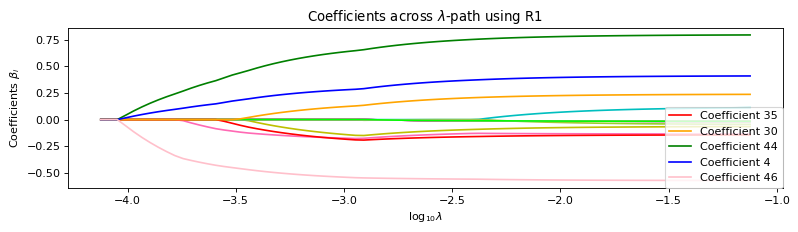

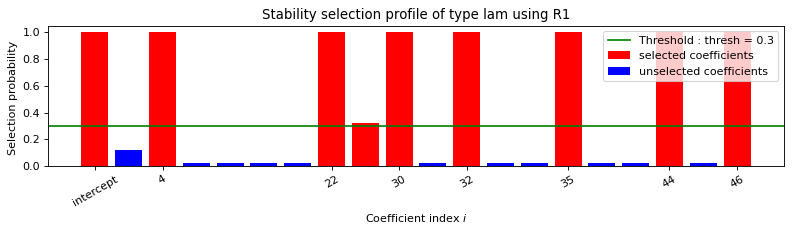

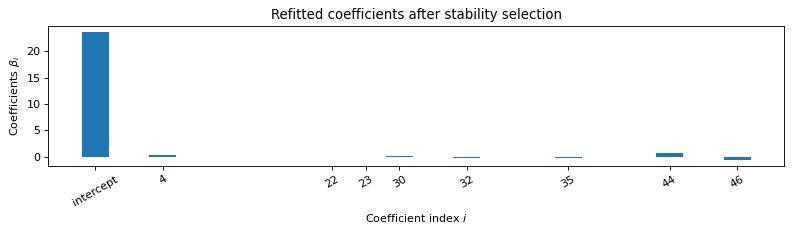


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.103s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.15 -0.15 0.00 0.00 0.00 0.00
 0.00 0.00 0.19 0.00 -0.19 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.75 0.00 -0.57]
Error: 0.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

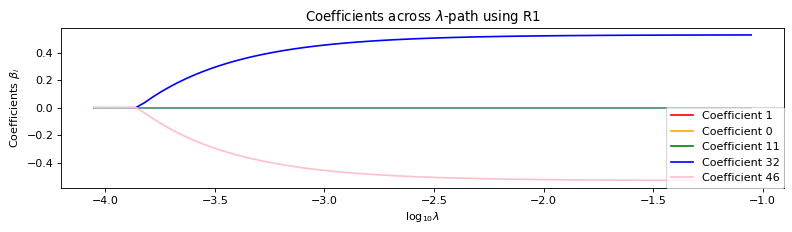

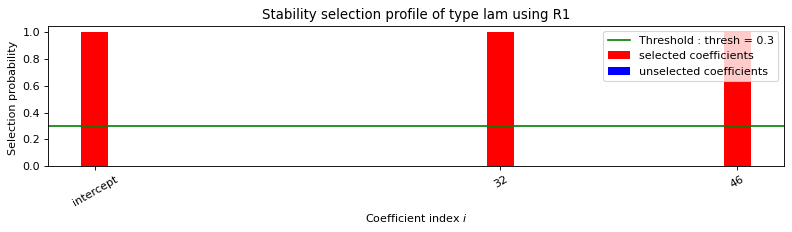

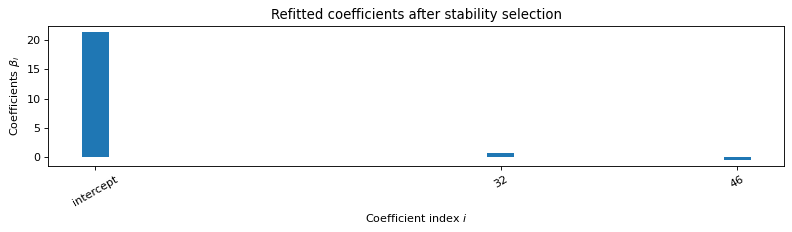


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.53 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.53]
Error: 6.96

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


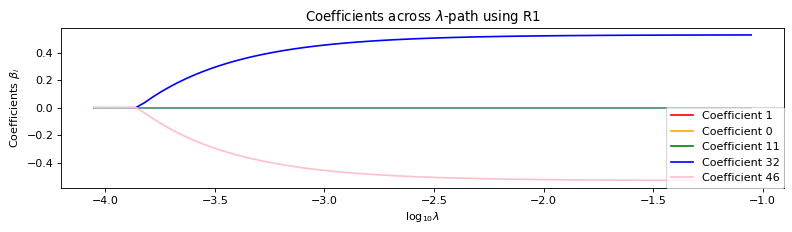

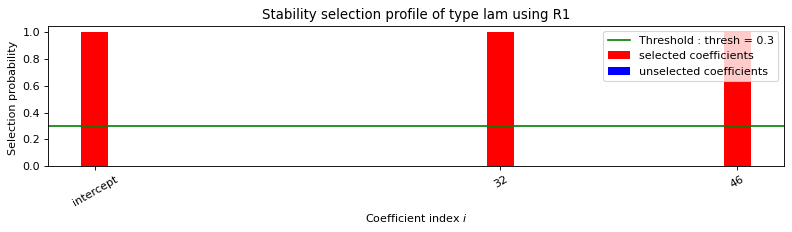

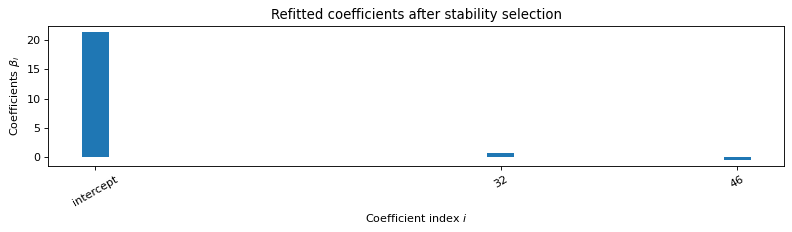


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.52 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.54]
Error: 6.96

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.53

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:               -14411903.392
Model:                         IV2SLS   Adj. R-squared:          -15107546.206
Method:                     Two Stage   F-statistic:                -8.166e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:37:50                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1177.8083        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.37 0.08 0.06 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.05 -0.01 0.02 0.02 0.02 0.01 0.01
 0.14 -0.15 0.01 0.05 0.01 0.01 0.10 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.72 0.02 0.55]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.40 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.04 0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.14 0.15 -0.01 -0.05 -0.01 -0.01 -0.10
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.73 -0.01 -0.54]

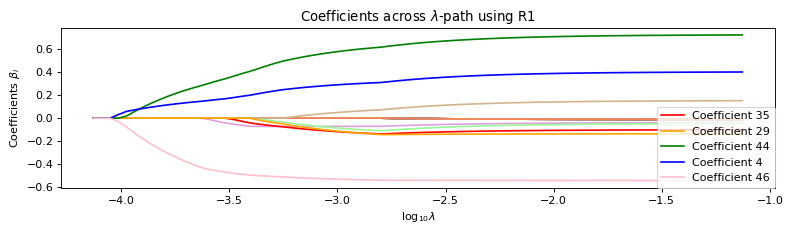

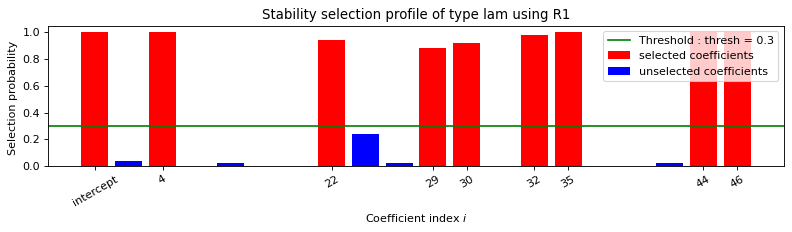

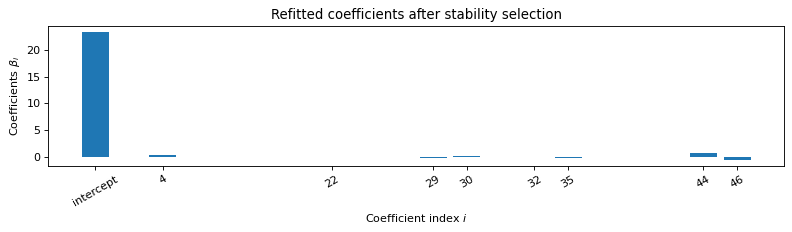


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.117s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.07 0.00 0.00 0.00 0.00 0.00
 0.00 -0.19 0.11 0.00 -0.15 0.00 0.00 -0.17 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.68 0.00 -0.56]
Error: 0.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

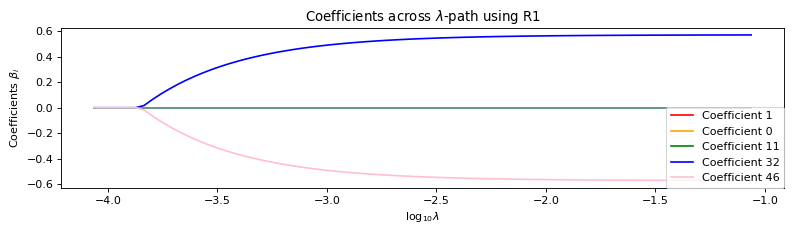

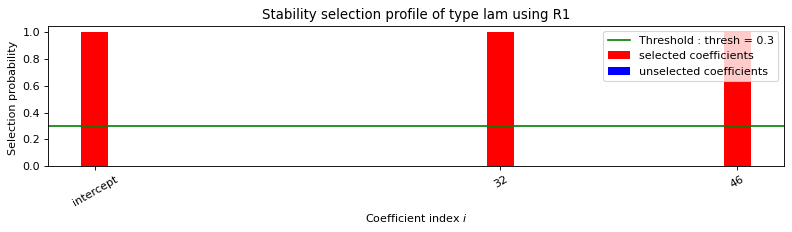

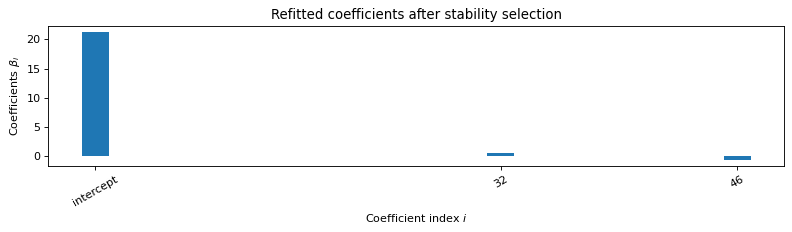


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.115s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 7.38

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


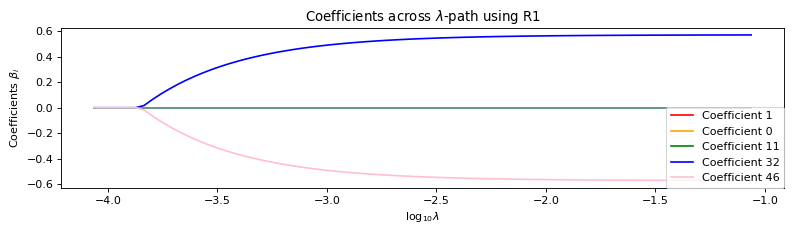

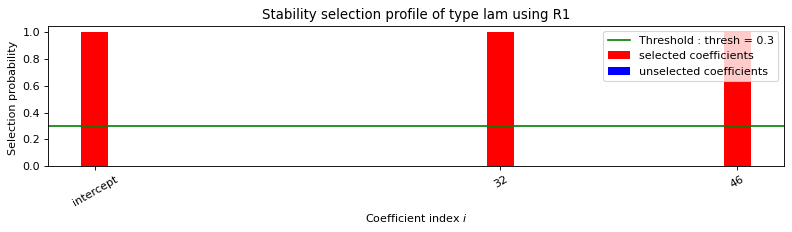

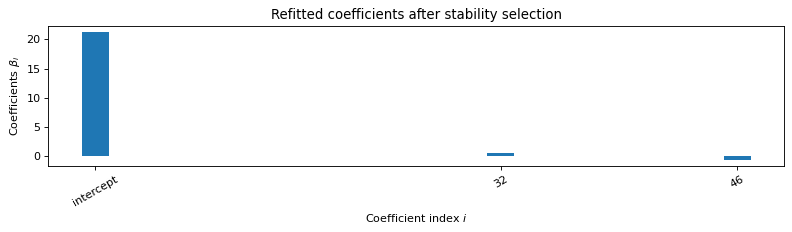


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.067s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.57 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 7.38

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.41

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -9811.035
Model:                         IV2SLS   Adj. R-squared:             -10284.648
Method:                     Two Stage   F-statistic:                -3.313e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:40:38                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.0479    3.3e+08  -3.65e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.44 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.09 -0.11 0.02 0.02 0.02 0.02 0.02
 0.04 -0.19 0.02 0.06 0.02 0.02 0.11 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 -0.85 0.03 0.57]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.47 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.09 0.11
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.04 0.19 -0.02 -0.06 -0.02 -0.02 -0.12
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.85 -0.02 -0.56]

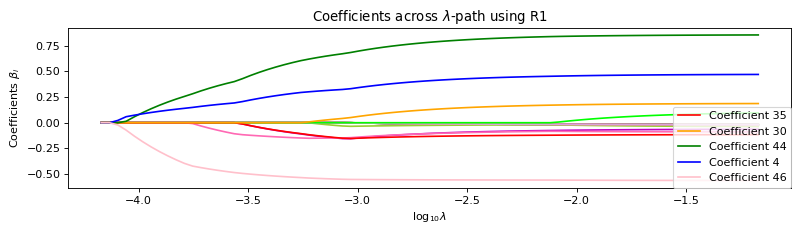

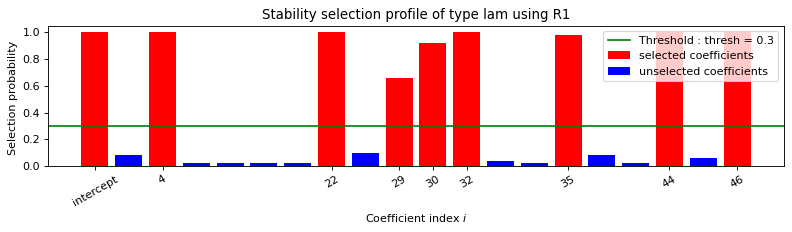

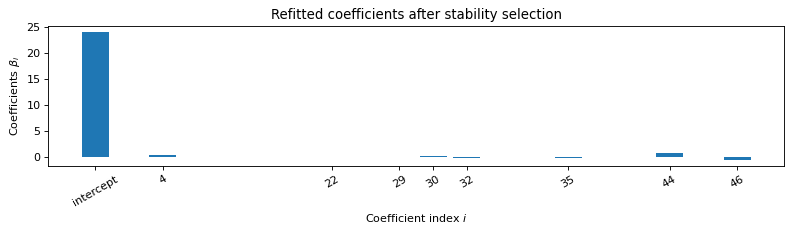


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.101s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.38 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00
 0.00 -0.10 0.12 0.00 -0.24 0.00 0.00 -0.23 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.79 0.00 -0.58]
Error: 0.84

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

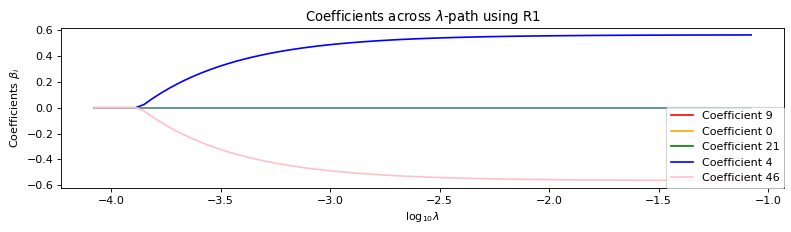

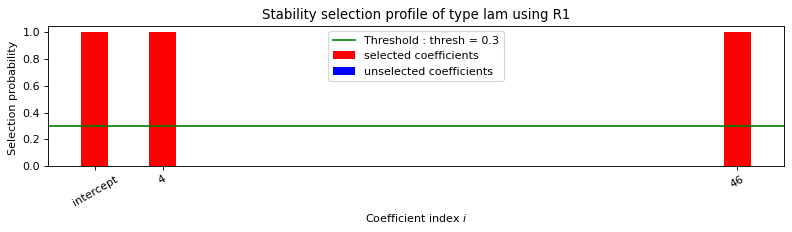

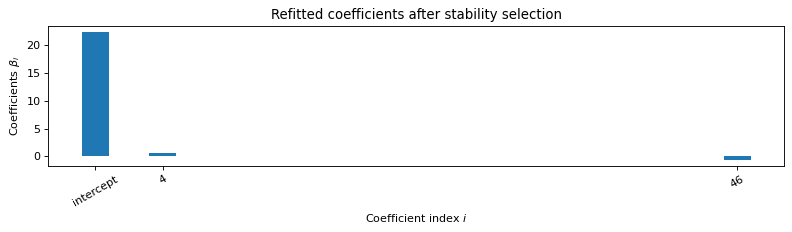


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 3.5

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


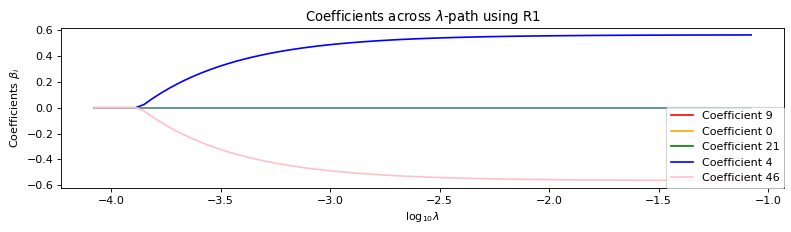

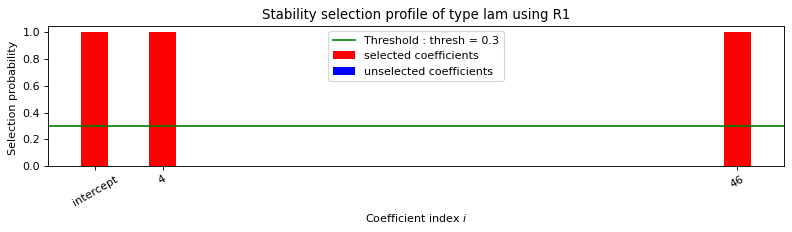

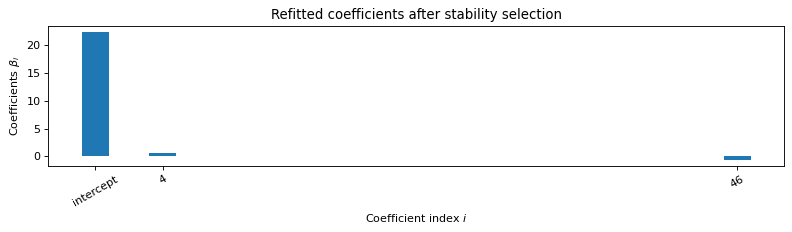


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.061s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.57]
Error: 3.5

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.35

---------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -315117.389
Model:                         IV2SLS   Adj. R-squared:            -330327.721
Method:                     Two Stage   F-statistic:                 5.833e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:43:24                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -405.0985   3.72e+09  -1.09e-07      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.46 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.10 -0.01 0.02 0.02 0.02 0.02 0.02
 0.07 -0.28 0.02 0.00 0.02 0.02 0.01 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.84 0.04 0.51]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.49 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.11 0.00
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.08 0.27 -0.02 0.00 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.85 -0.02 -0.50]


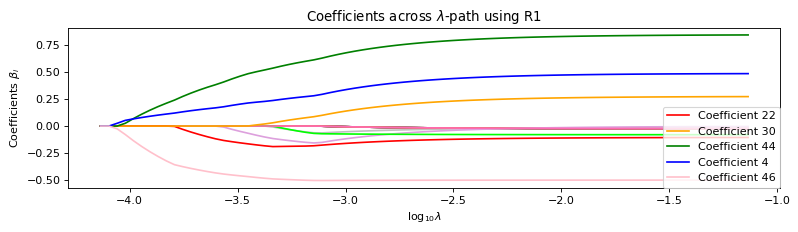

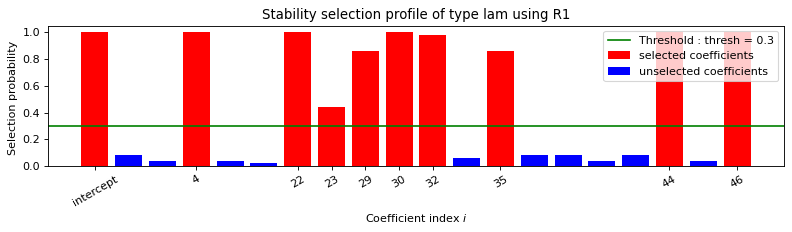

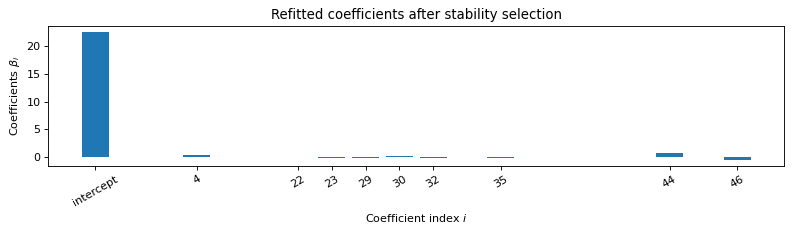


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.114s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.38 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.25 0.00 0.00 0.00 0.00
 0.00 -0.14 0.20 0.00 -0.19 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.77 0.00 -0.52]
Error: 0.71

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

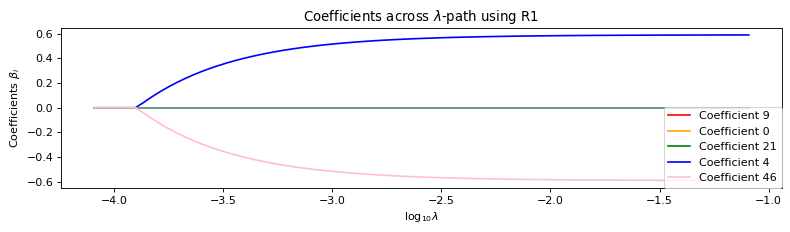

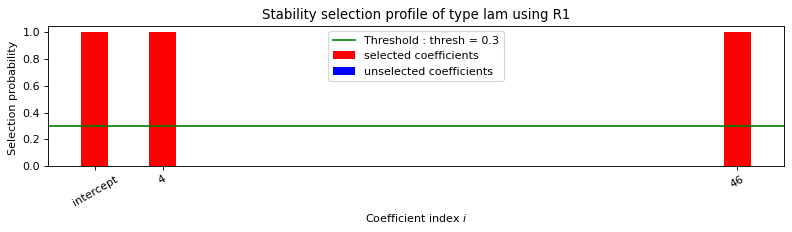

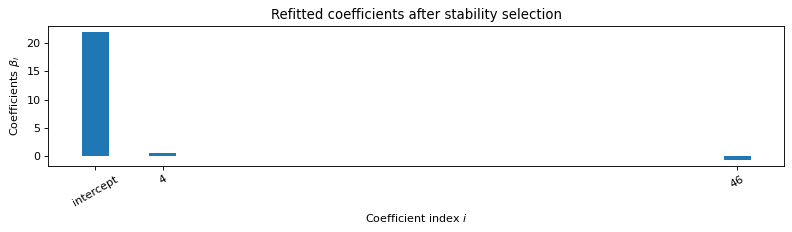


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 3.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


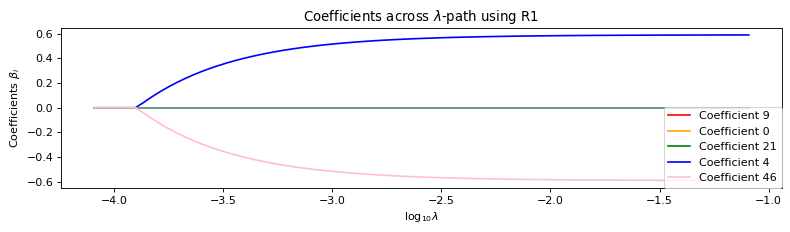

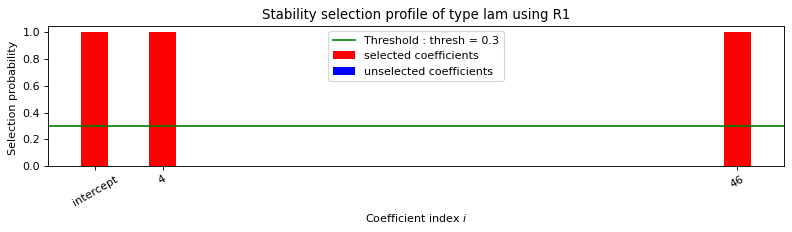

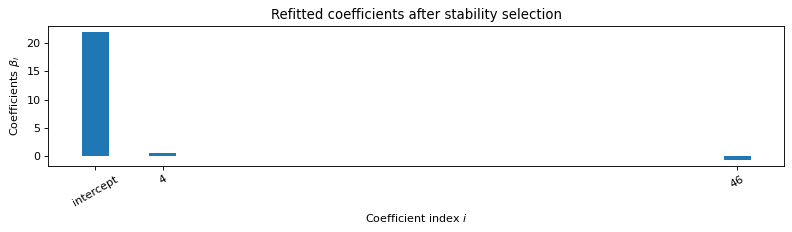


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.058s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 3.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.84

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -5418.599
Model:                         IV2SLS   Adj. R-squared:              -5680.195
Method:                     Two Stage   F-statistic:                -3.427e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:45:58                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -13.6640   6.38e+08  -2.14e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.38 0.08 0.06 0.06 0.05 0.04 0.04 0.04 0.03 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.15 0.11 0.01 0.01 0.01 0.01 0.01
 -0.10 -0.24 0.02 0.03 0.02 0.02 0.08 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.88 0.03 0.49]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.40 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.15 -0.11
 -0.02 -0.02 -0.02 -0.02 -0.02 0.09 0.24 -0.02 -0.04 -0.02 -0.02 -0.08
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.88 -0.02 -0.48]

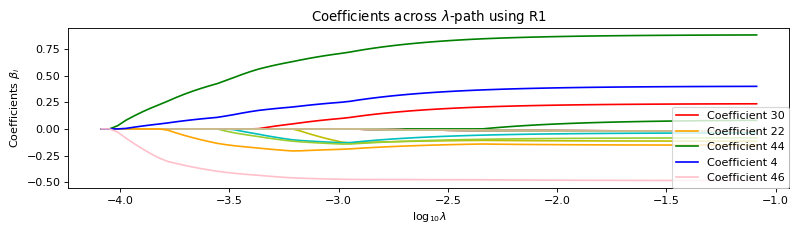

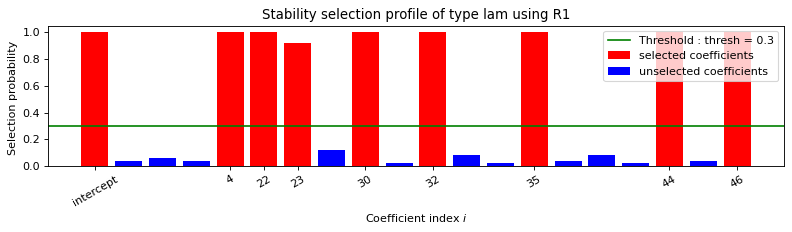

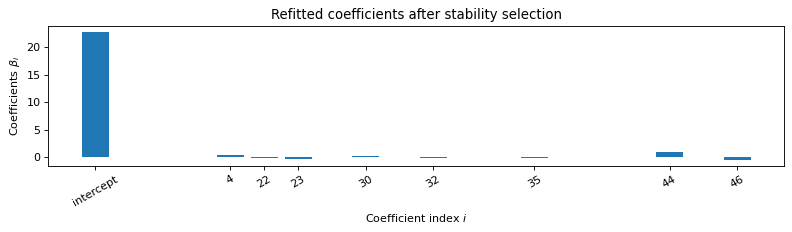


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.115s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.32 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.16 -0.31 0.00 0.00 0.00 0.00
 0.00 0.00 0.18 0.00 -0.17 0.00 0.00 -0.18 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.82 0.00 -0.49]
Error: 0.6

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------

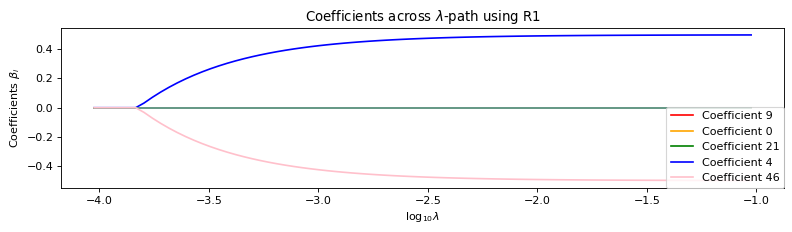

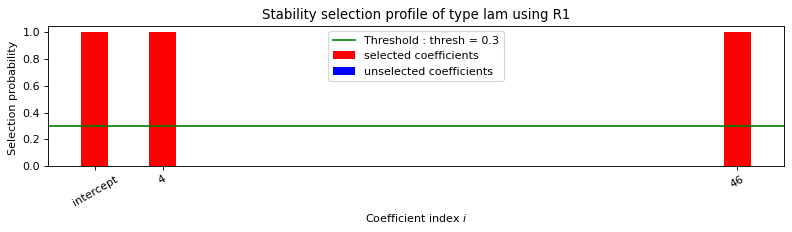

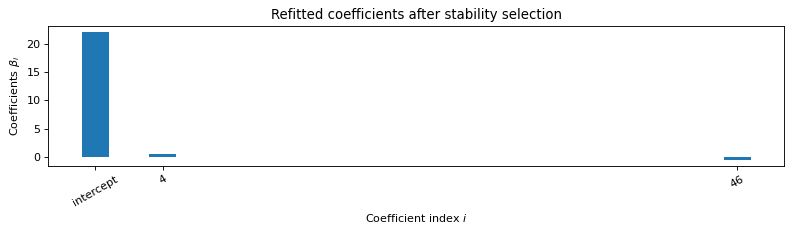


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.049s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.50 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.50]
Error: 3.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


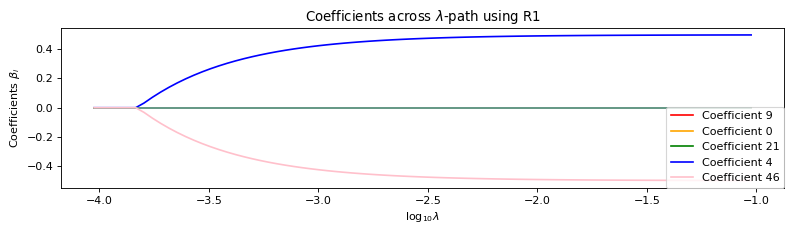

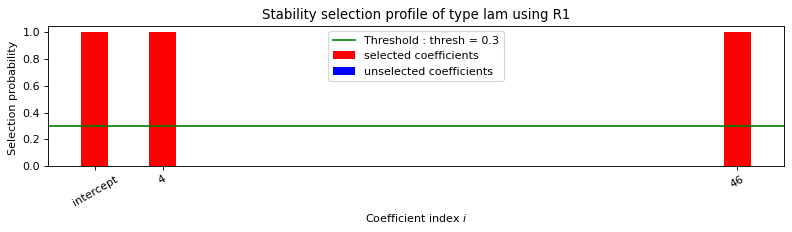

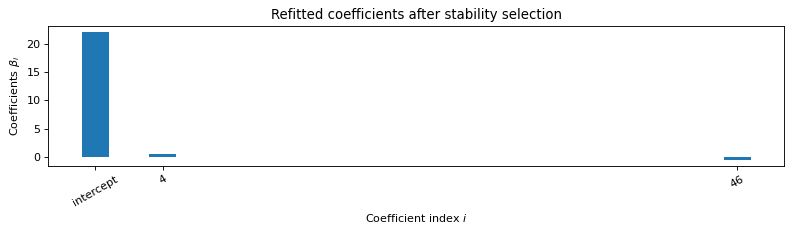


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.075s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.45 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.50]
Error: 3.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.33

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -2803.292
Model:                         IV2SLS   Adj. R-squared:              -2938.652
Method:                     Two Stage   F-statistic:                 1.760e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:48:34                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.7835   1.31e+09   1.36e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.34 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03 0.03
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.19 0.10 0.00 0.00 0.00 0.00 0.00
 -0.09 -0.25 0.01 0.06 0.01 0.01 0.03 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.82 0.03 0.53]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.37 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.20 -0.11
 -0.02 -0.02 -0.02 -0.02 -0.02 0.08 0.24 -0.02 -0.06 -0.02 -0.02 -0.03
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.82 -0.02 -0.53]

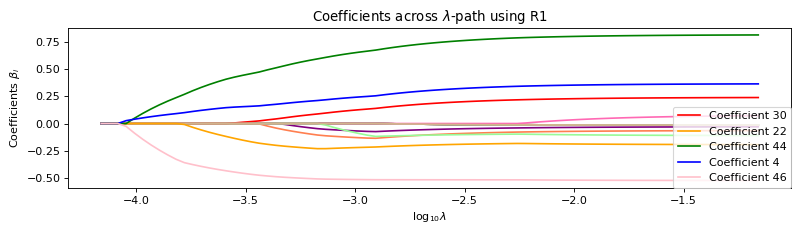

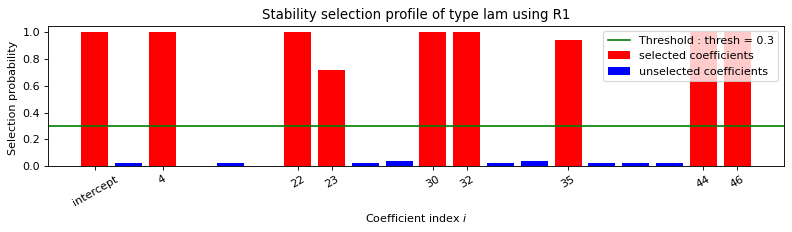

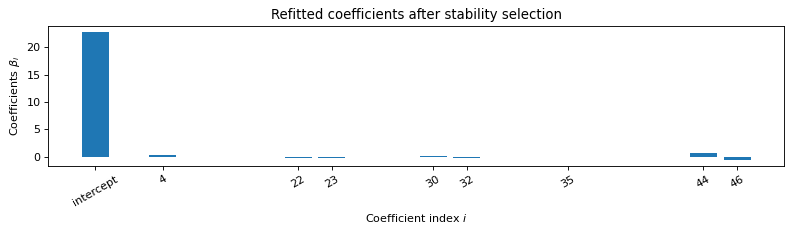


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.094s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.20 -0.28 0.00 0.00 0.00 0.00
 0.00 0.00 0.20 0.00 -0.17 0.00 0.00 -0.11 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.77 0.00 -0.53]
Error: 0.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

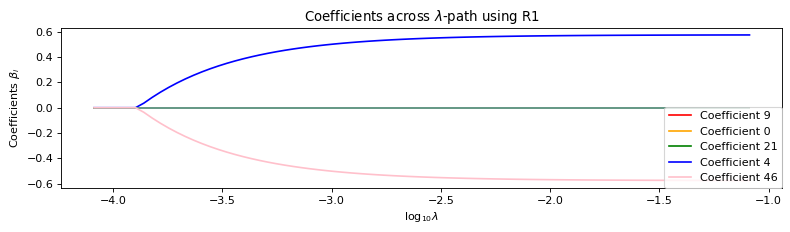

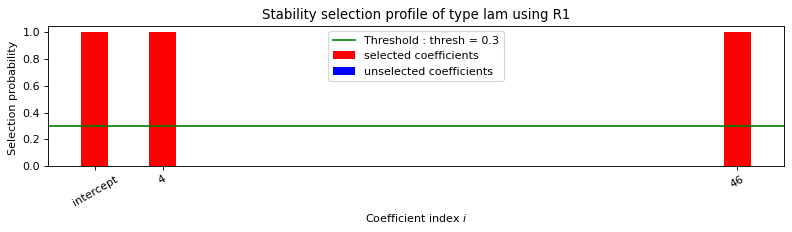

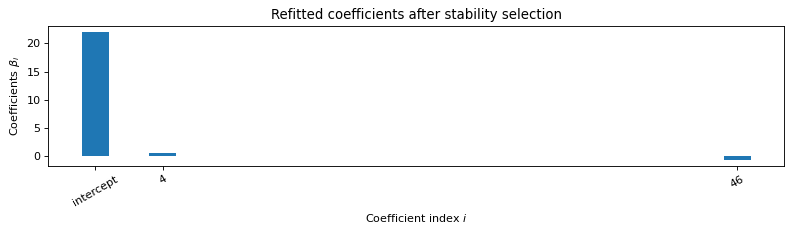


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.068s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 3.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


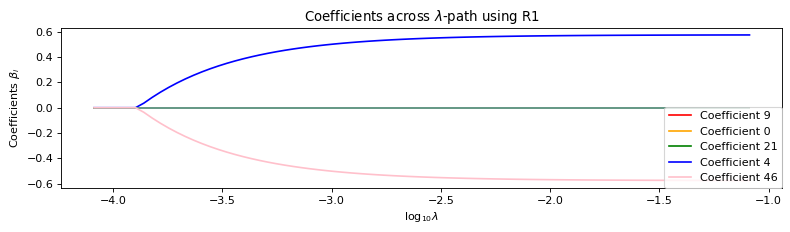

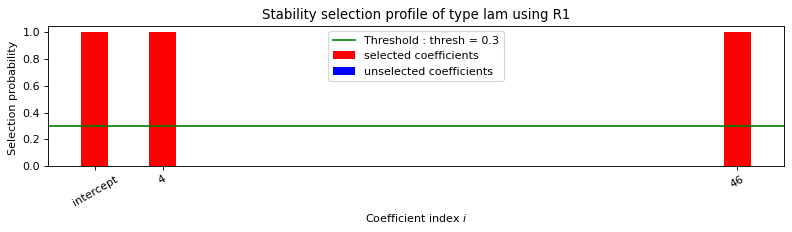

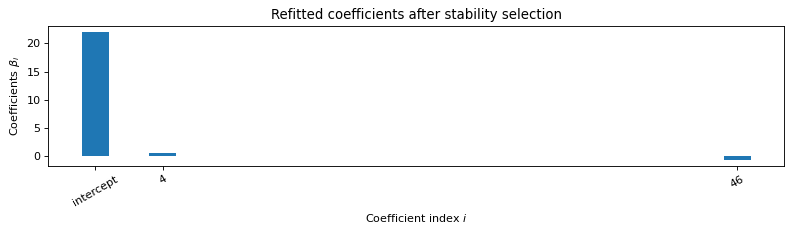


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.068s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.77

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.83

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -1476.343
Model:                         IV2SLS   Adj. R-squared:              -1547.653
Method:                     Two Stage   F-statistic:                 1.017e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:51:07                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -19.1355   2.65e+09  -7.23e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.48 0.10 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.09 -0.25 0.03 0.03 0.03 0.03 0.03
 -0.01 -0.26 0.03 -0.09 0.04 0.03 0.07 0.03 0.03 0.03 0.03 0.03 0.03 0.03
 0.03 -0.85 0.04 0.54]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.50 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.10 0.24
 -0.03 -0.03 -0.03 -0.03 -0.03 0.00 0.25 -0.03 0.10 -0.03 -0.03 -0.07
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.85 -0.03 -0.53]

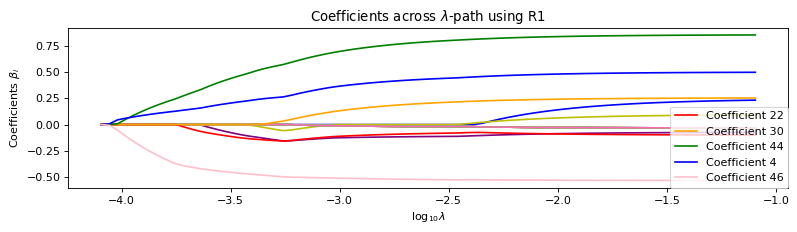

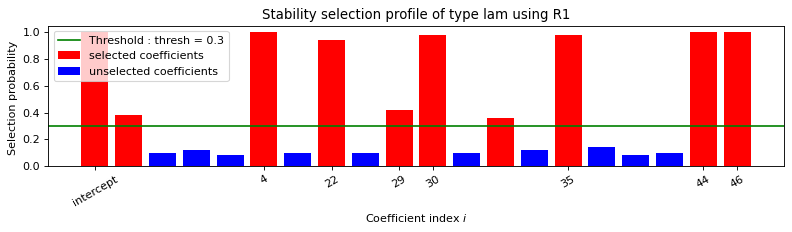

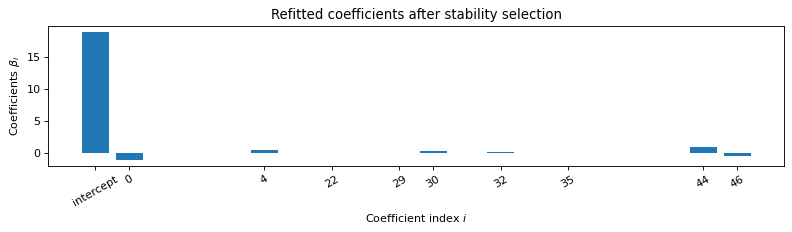


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    4    22    29    30    32    35    44    46    
   Running time :  0.12s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [-1.07 0.00 0.00 0.00 0.50 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.06 0.00 0.00 0.00 0.00 0.00
 0.00 0.03 0.26 0.00 0.09 0.00 0.00 -0.08 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.85 0.00 -0.52]
Error: 0.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
----

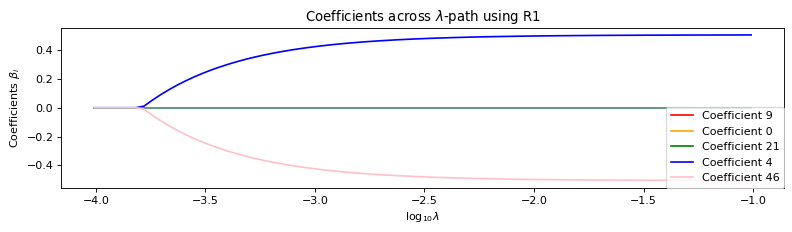

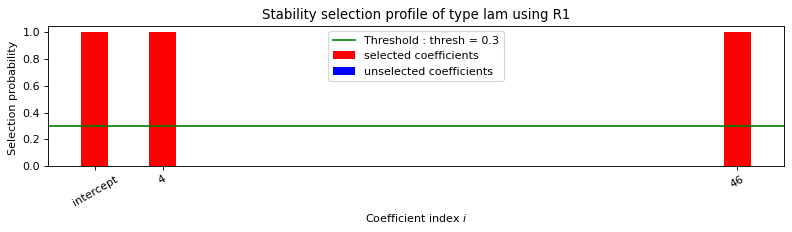

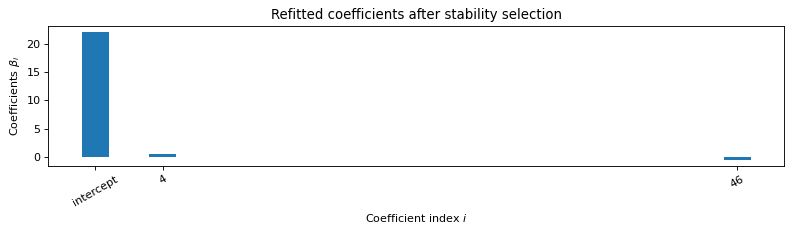


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.51 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.51]
Error: 3.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


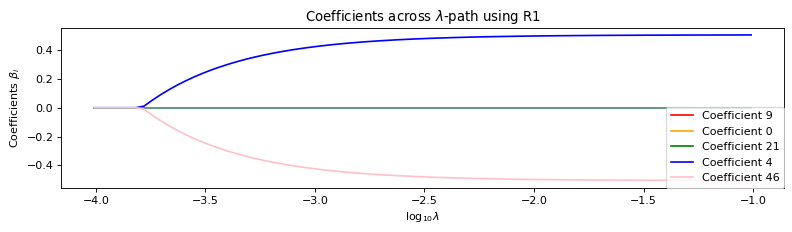

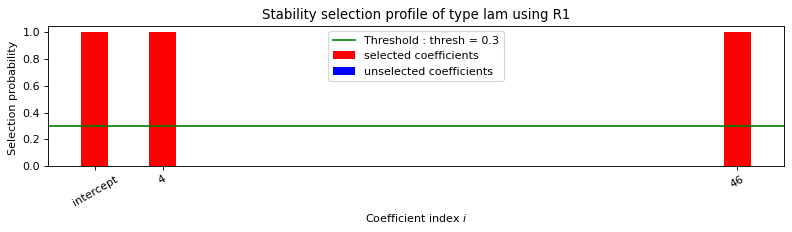

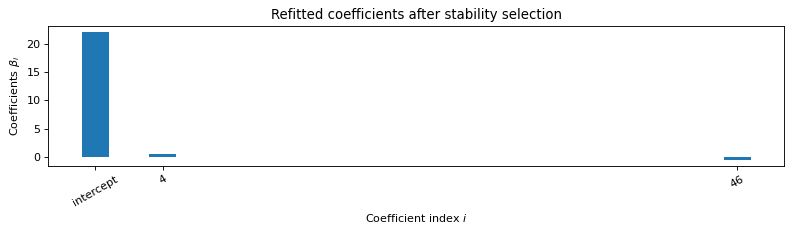


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.054s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.45 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.51]
Error: 3.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.13

---------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -179773.326
Model:                         IV2SLS   Adj. R-squared:            -188450.785
Method:                     Two Stage   F-statistic:                -1.162e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:53:42                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -32.5442   4.32e+09  -7.54e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.08 -0.11 0.02 0.02 0.02 0.02 0.02
 0.03 -0.29 0.03 -0.02 0.03 0.03 0.05 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.89 0.04 0.57]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.45 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.09 0.10
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.04 0.28 -0.03 0.02 -0.03 -0.03 -0.05
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.89 -0.03 -0.56]

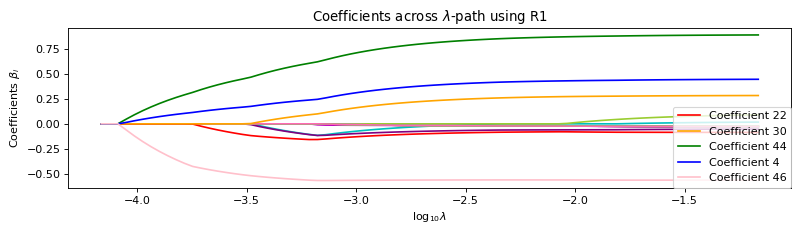

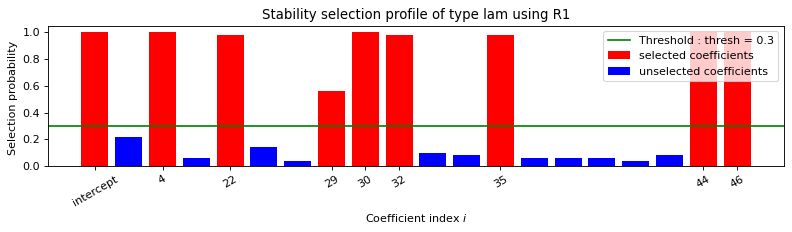

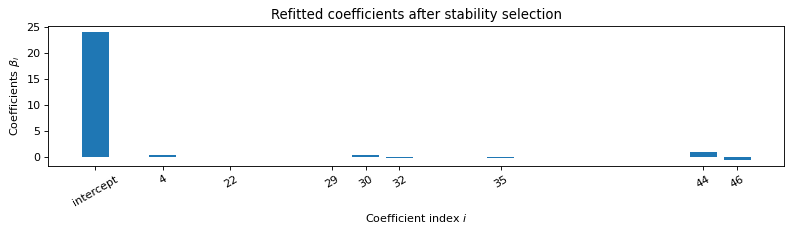


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.107s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.32 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00
 0.00 -0.13 0.20 0.00 -0.22 0.00 0.00 -0.21 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.60]
Error: 0.74

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

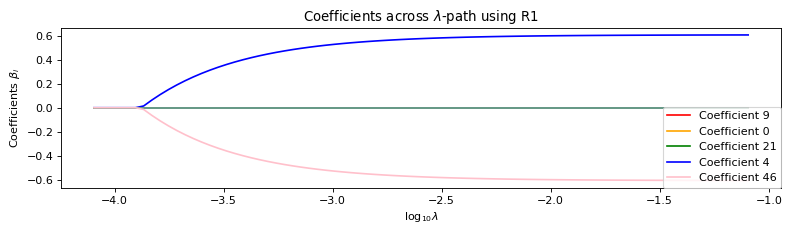

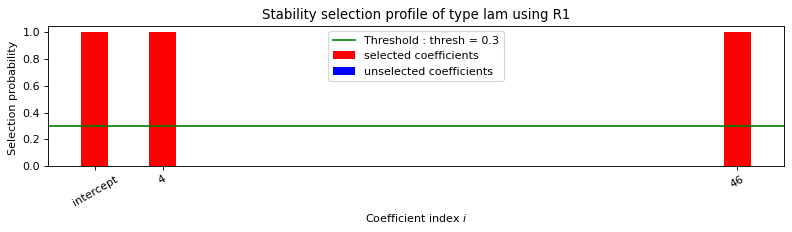

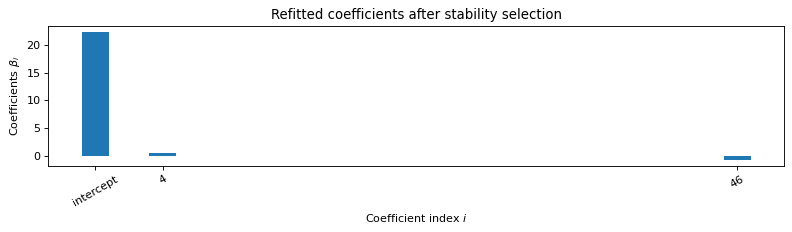


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.61 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.61]
Error: 3.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


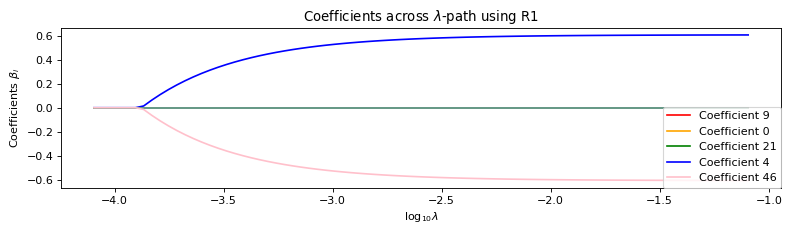

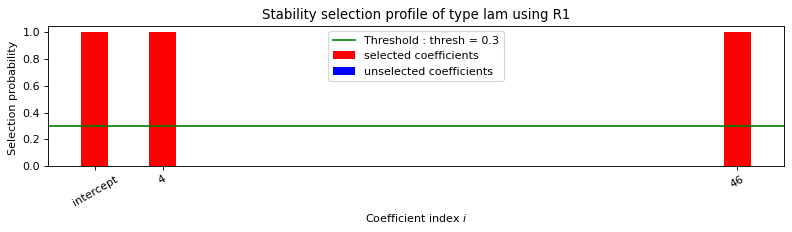

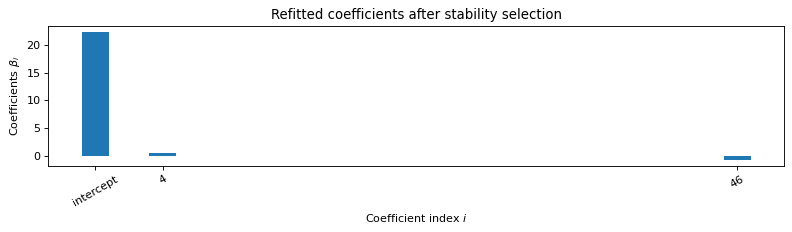


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.54 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.05 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 0.01 0.01 0.61]
Error: 3.33

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.05

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -20023.503
Model:                         IV2SLS   Adj. R-squared:             -20990.058
Method:                     Two Stage   F-statistic:                 1.494e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:56:09                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.5240   9.39e+09   5.58e-11      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.41 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.12 0.00 0.02 0.02 0.01 0.01 0.01
 -0.14 -0.21 0.02 0.00 0.02 0.02 0.06 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.83 0.04 0.60]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.44 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.12 0.00
 -0.02 -0.02 -0.02 -0.02 -0.02 0.14 0.21 -0.02 0.00 -0.02 -0.02 -0.06
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.84 -0.02 -0.60]
E

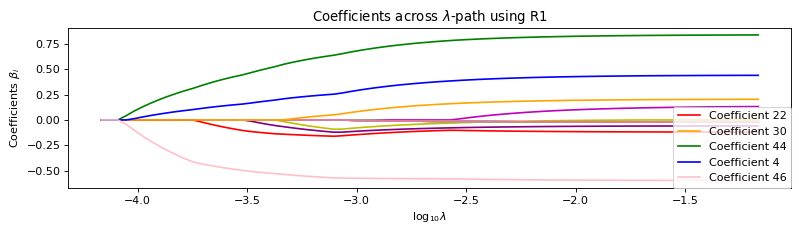

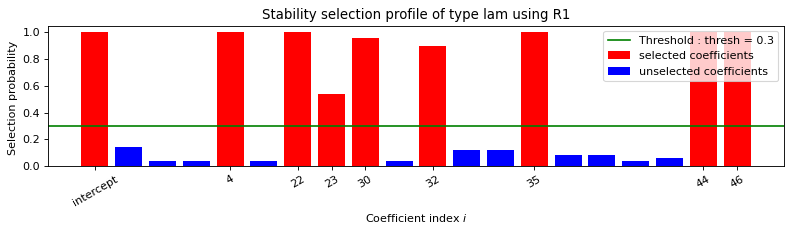

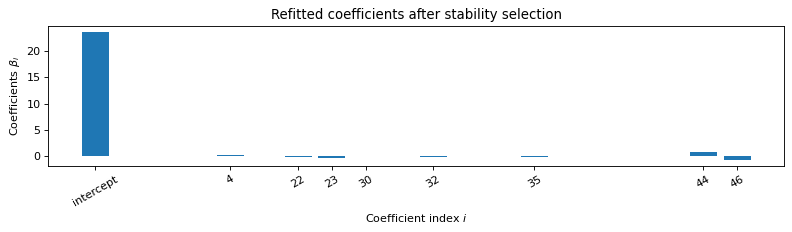


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.098s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.20 0.00 0.00 0.00 0.00
 0.00 0.00 0.14 0.00 -0.17 0.00 0.00 -0.17 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.60]
Error: 0.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

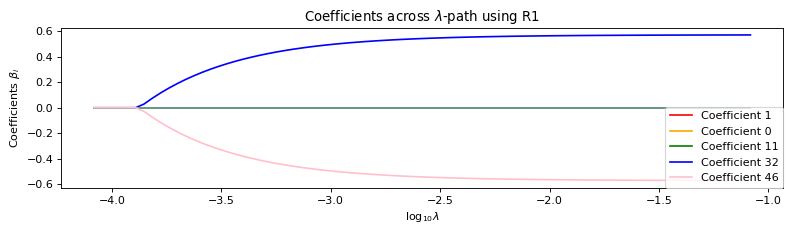

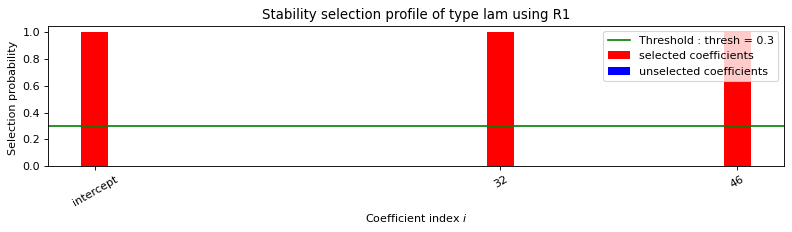

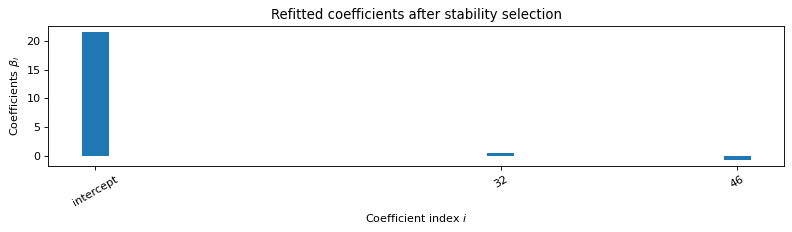


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.051s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 8.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


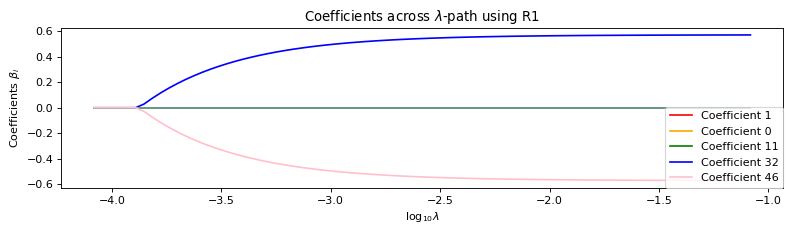

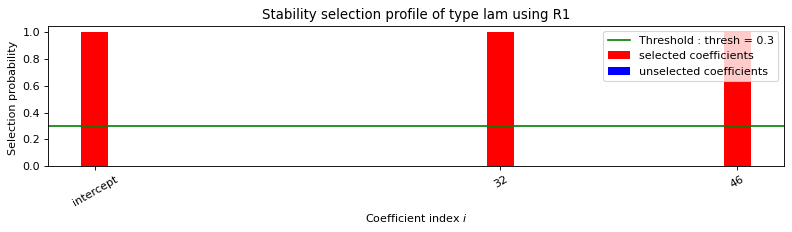

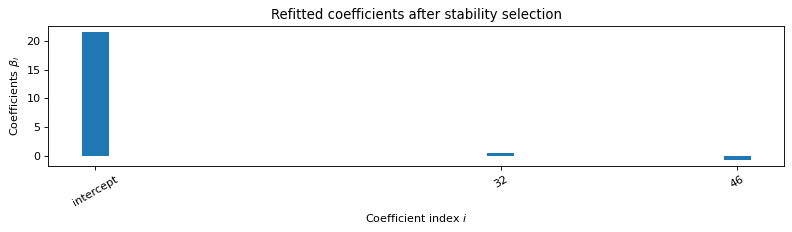


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.05s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.56 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 8.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 8.89

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -64072.443
Model:                         IV2SLS   Adj. R-squared:             -67165.180
Method:                     Two Stage   F-statistic:                 1.278e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        09:58:32                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -387.9250   1.11e+09   -3.5e-07      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.45 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.03 -0.05 0.02 0.02 0.02 0.02 0.02
 0.10 -0.23 0.02 0.09 0.02 0.02 0.04 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.80 0.03 0.55]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.48 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.03 0.05
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.10 0.23 -0.02 -0.08 -0.02 -0.02 -0.04
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.80 -0.02 -0.55]

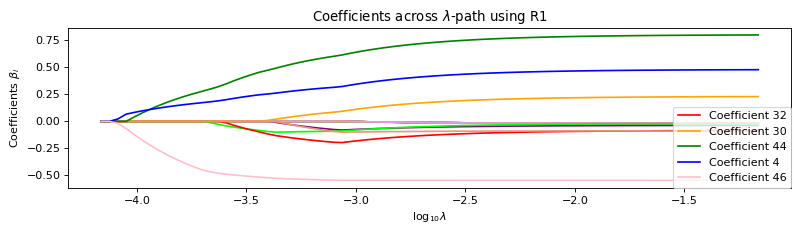

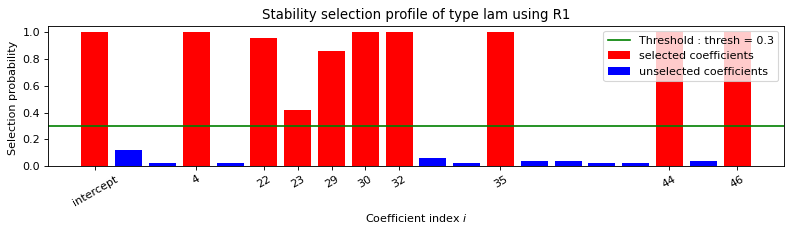

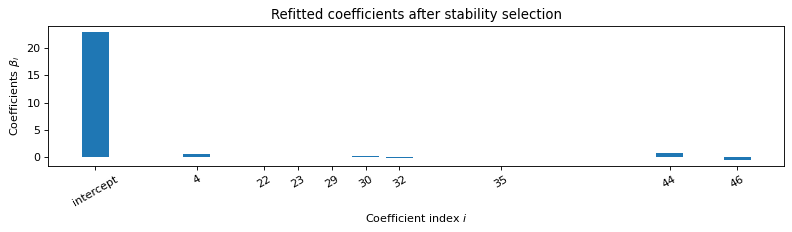


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.113s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.05 -0.16 0.00 0.00 0.00 0.00
 0.00 -0.16 0.17 0.00 -0.24 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.74 0.00 -0.56]
Error: 0.68

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

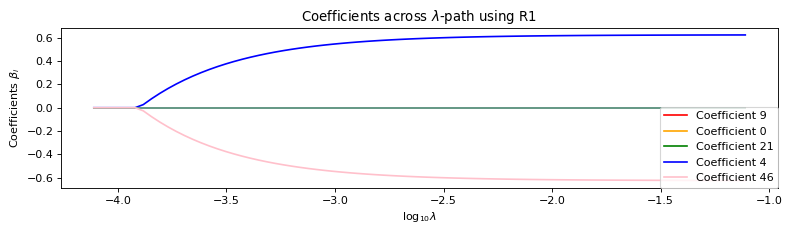

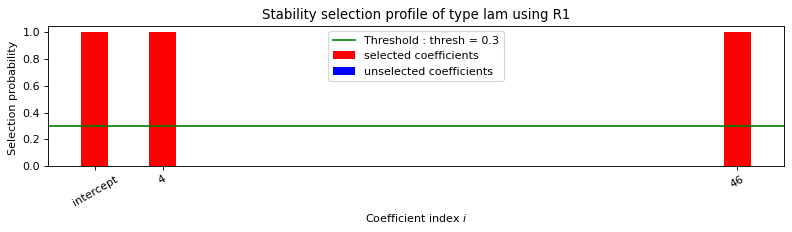

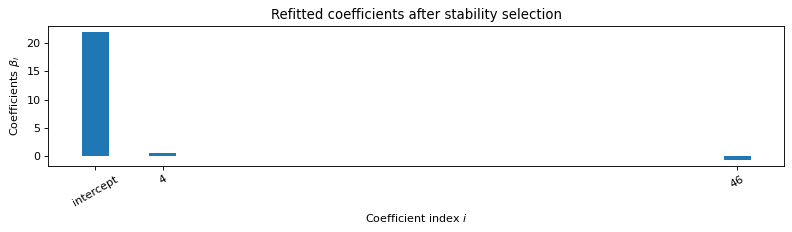


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.63 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.63]
Error: 3.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


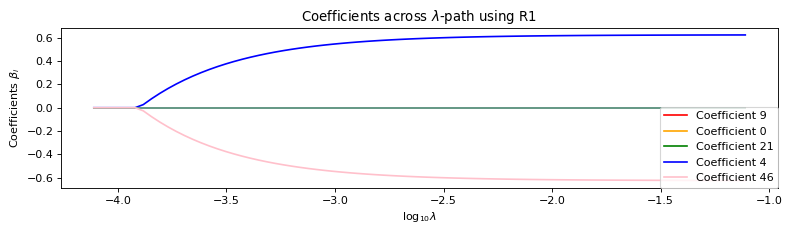

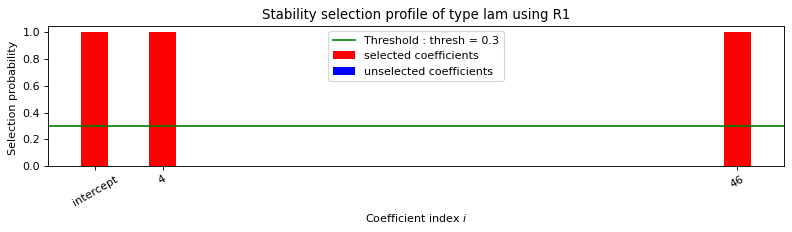

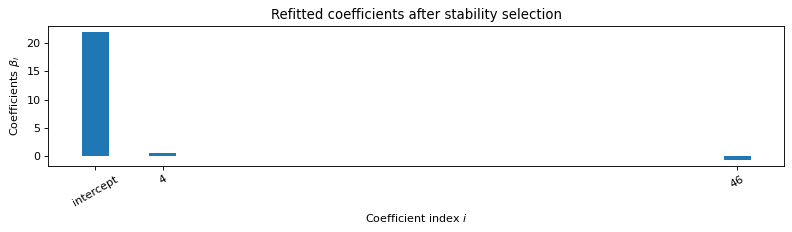


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.085s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.56 0.11 0.10 0.08 0.07 0.07 0.06 0.05 0.05 0.05 0.04
 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01
 0.01 0.01 0.01 0.63]
Error: 3.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.06

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -7910.878
Model:                         IV2SLS   Adj. R-squared:              -8292.774
Method:                     Two Stage   F-statistic:                 4.678e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:01:11                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -56.4176        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.41 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.17 -0.06 0.02 0.02 0.01 0.01 0.01
 -0.07 -0.25 0.02 -0.04 0.02 0.02 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.83 0.04 0.48]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.44 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.18 0.05
 -0.03 -0.03 -0.03 -0.03 -0.03 0.06 0.25 -0.03 0.04 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.83 -0.03 -0.48]

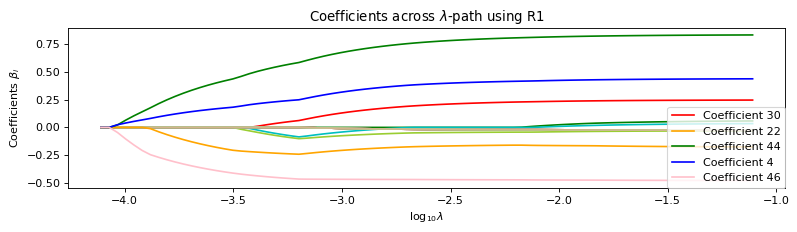

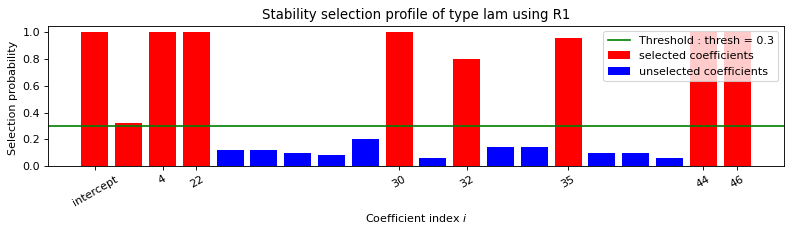

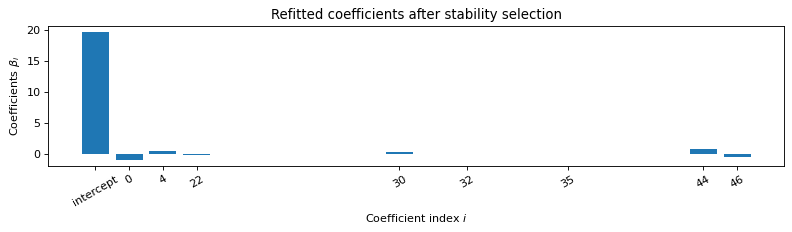


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    4    22    30    32    35    44    46    
   Running time :  0.143s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [-0.92 0.00 0.00 0.00 0.44 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.25 0.00 0.04 0.00 0.00 -0.03 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.83 0.00 -0.47]
Error: 0.5

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------

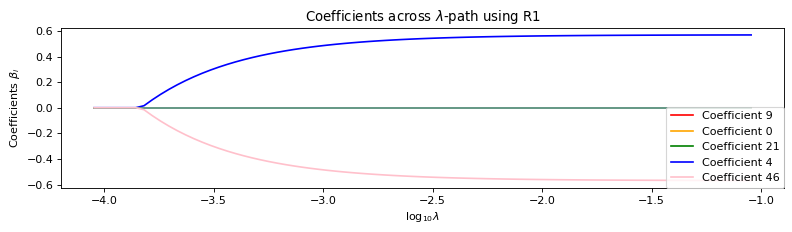

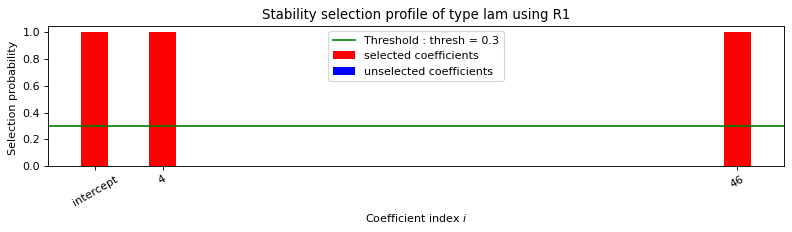

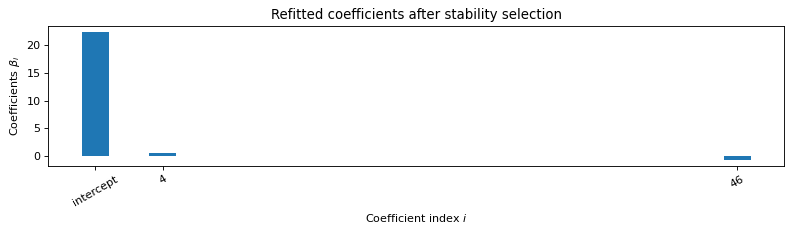


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.069s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 3.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


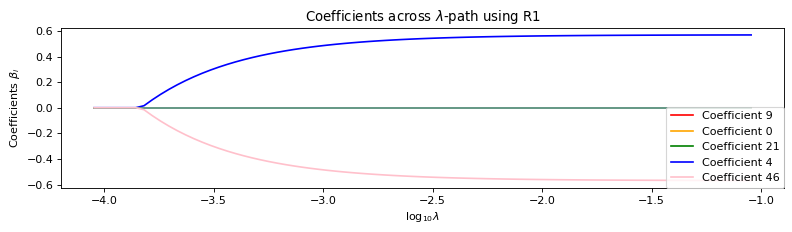

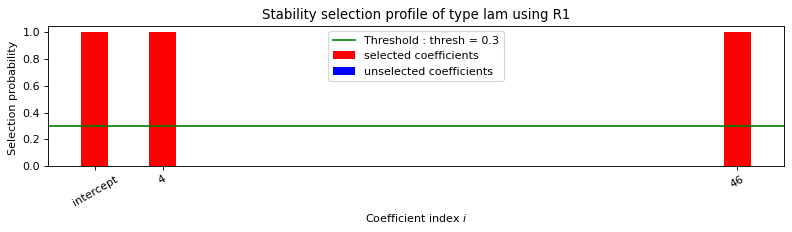

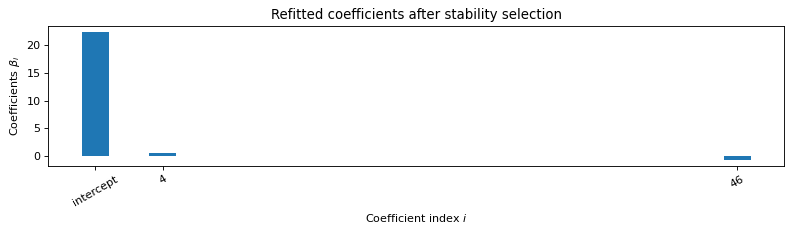


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 10.6

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -3765.973
Model:                         IV2SLS   Adj. R-squared:              -3947.799
Method:                     Two Stage   F-statistic:                -1.591e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:04:14                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -5.5305        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.46 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.05 -0.07 0.02 0.02 0.02 0.02 0.02
 -0.03 -0.23 0.03 0.08 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.80 0.04 0.57]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.49 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.05 0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 0.02 0.23 -0.02 -0.08 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.81 -0.02 -0.56]

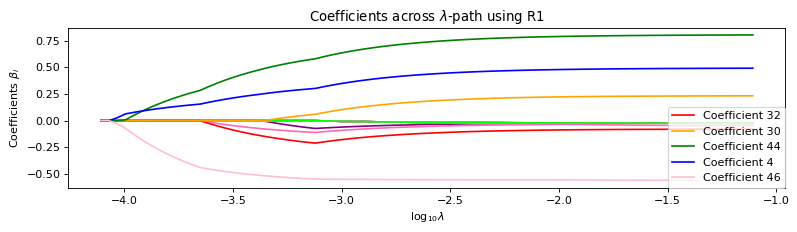

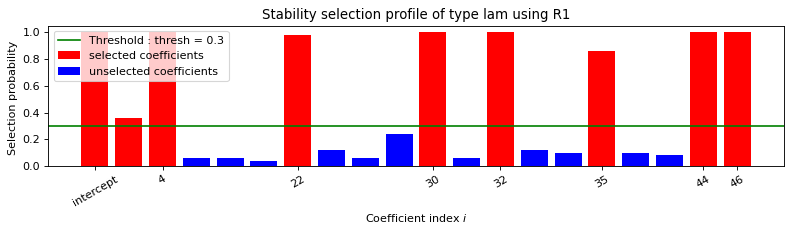

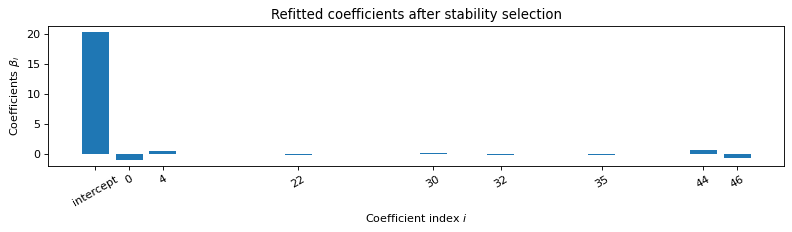


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    4    22    30    32    35    44    46    
   Running time :  0.144s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [-0.86 0.00 0.00 0.00 0.49 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.03 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.24 0.00 -0.08 0.00 0.00 -0.02 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.81 0.00 -0.56]
Error: 0.61

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------

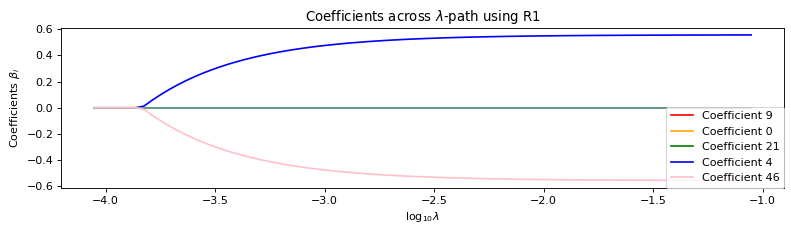

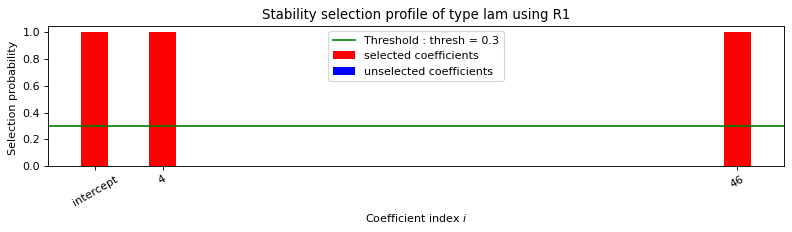

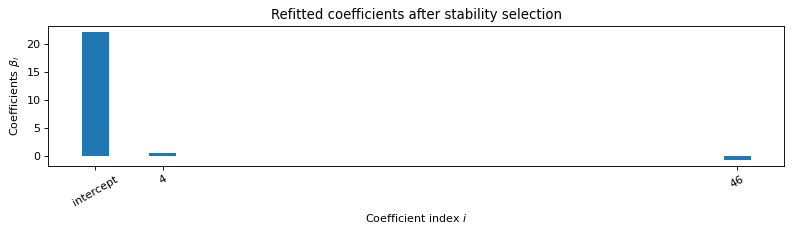


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 4.06

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


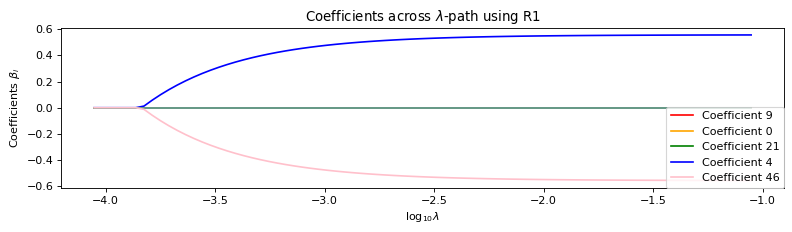

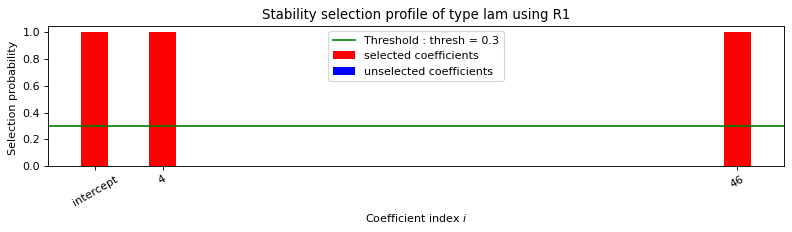

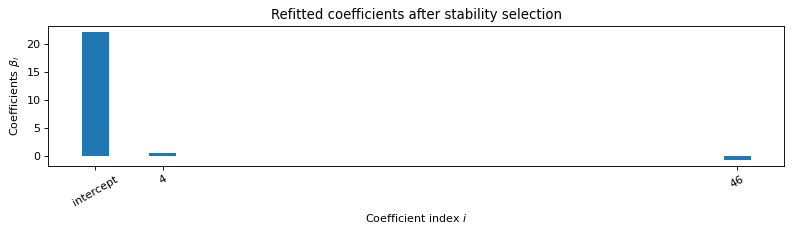


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.56]
Error: 4.06

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.09

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -21856.093
Model:                         IV2SLS   Adj. R-squared:             -22911.105
Method:                     Two Stage   F-statistic:                 1.853e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:07:10                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.9783   9.18e+08    7.6e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.40 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.16 -0.18 0.02 0.02 0.02 0.02 0.02
 -0.02 -0.20 0.02 0.08 0.02 0.02 0.07 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.87 0.03 0.59]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.42 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.16 0.17
 -0.02 -0.02 -0.02 -0.02 -0.02 0.02 0.20 -0.02 -0.07 -0.02 -0.02 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.87 -0.02 -0.59]

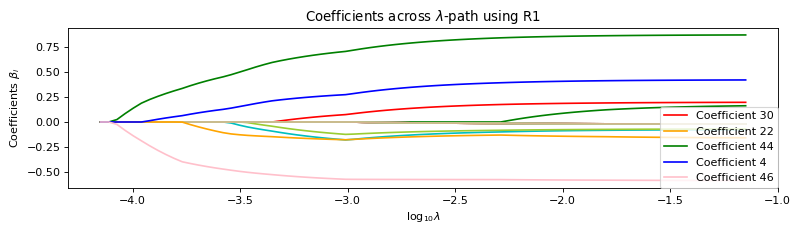

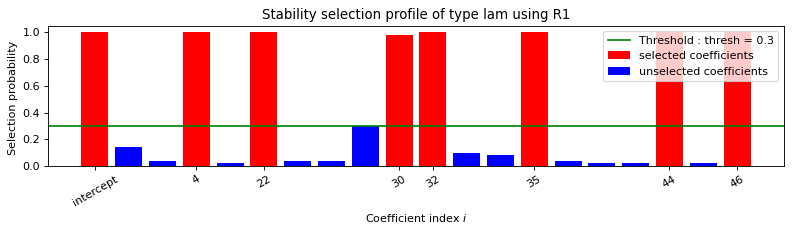

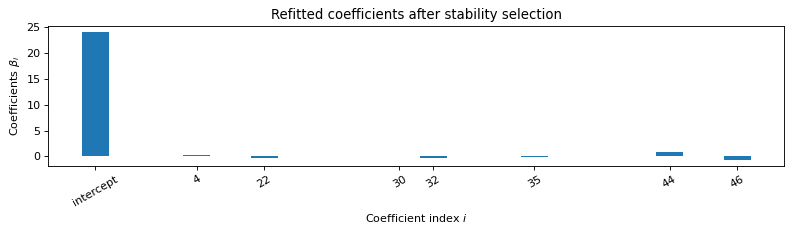


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.108s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.32 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.20 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.14 0.00 -0.25 0.00 0.00 -0.19 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.80 0.00 -0.61]
Error: 0.73

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

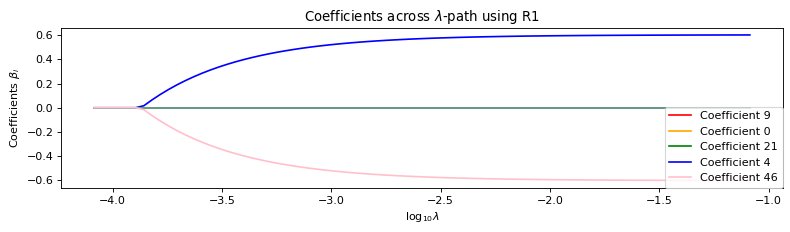

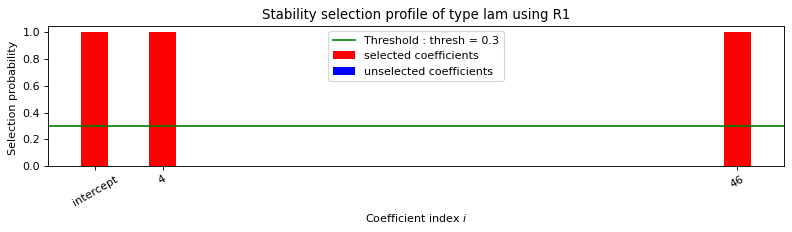

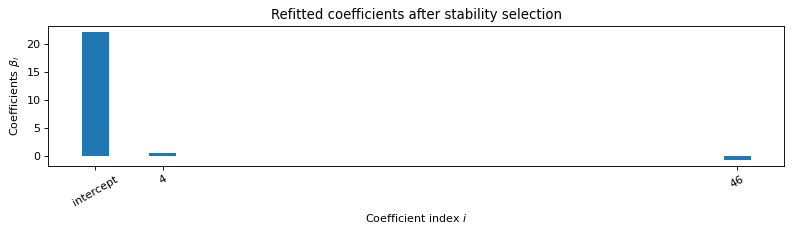


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 3.38

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


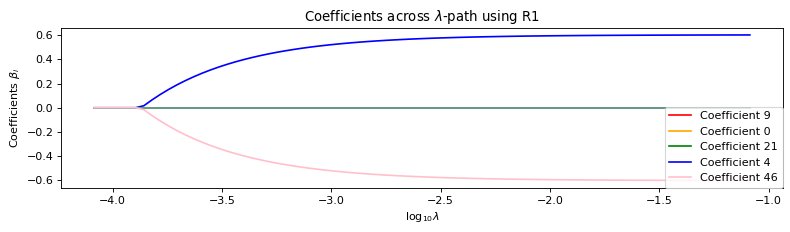

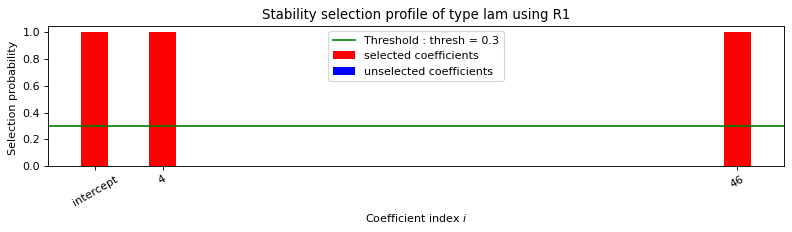

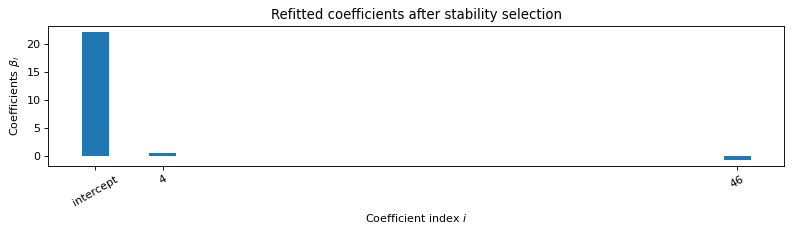


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.073s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.54 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.61]
Error: 3.38

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.18

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -256358.151
Model:                         IV2SLS   Adj. R-squared:            -268732.255
Method:                     Two Stage   F-statistic:                 2.343e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:09:54                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -17.4842   8.16e+09  -2.14e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.14 0.08 0.01 0.01 0.01 0.01 0.01
 -0.15 -0.15 0.02 0.07 0.02 0.02 0.11 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.84 0.03 0.53]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.45 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.13 -0.08
 -0.02 -0.02 -0.02 -0.02 -0.02 0.14 0.15 -0.02 -0.07 -0.02 -0.02 -0.11
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.84 -0.02 -0.52]

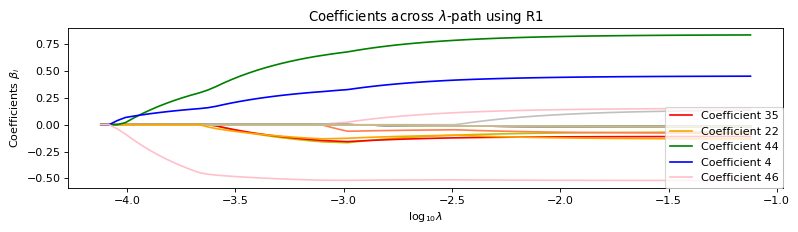

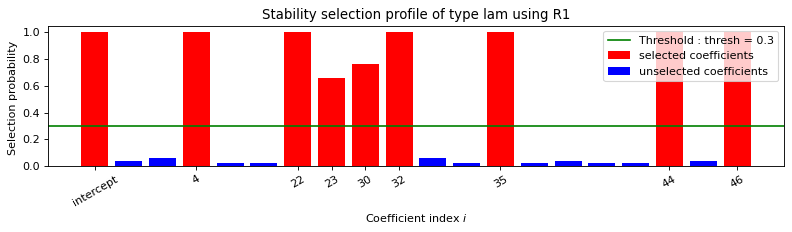

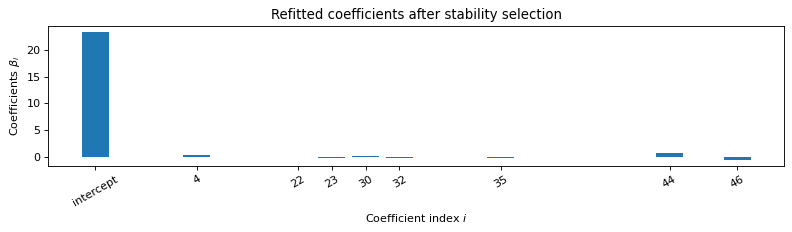


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.11s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.11 -0.25 0.00 0.00 0.00 0.00
 0.00 0.00 0.09 0.00 -0.19 0.00 0.00 -0.19 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.52]
Error: 0.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------

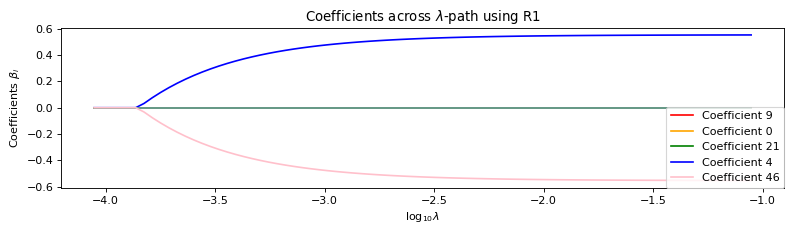

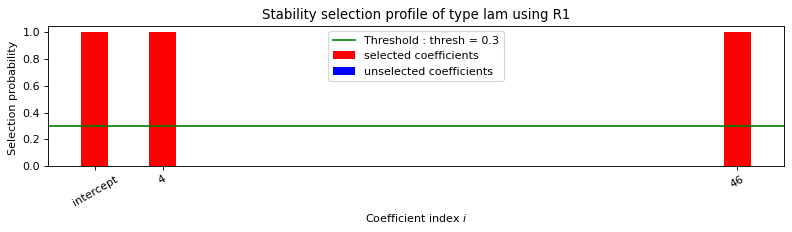

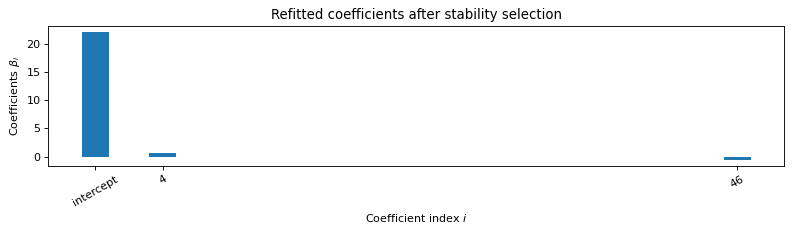


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.55 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.55]
Error: 3.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


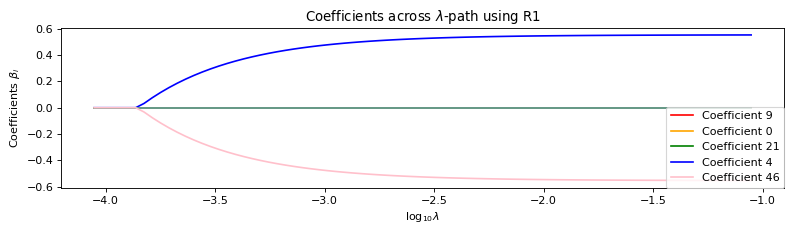

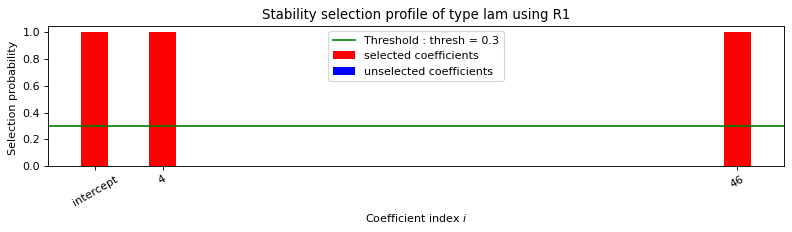

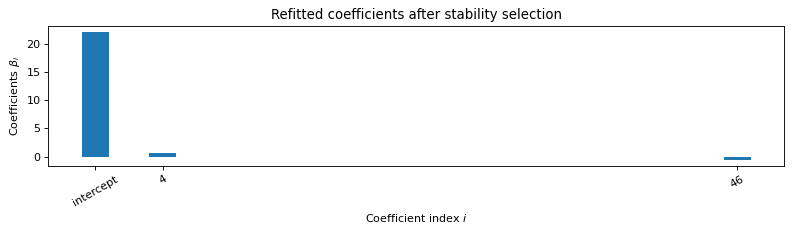


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.49 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.56]
Error: 3.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.89

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -85513.621
Model:                         IV2SLS   Adj. R-squared:             -89641.294
Method:                     Two Stage   F-statistic:                -5.566e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:12:34                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -6.5526        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.40 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.09 0.07 0.01 0.01 0.01 0.01 0.01
 -0.01 -0.22 0.02 0.05 0.02 0.02 0.06 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.85 0.03 0.51]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.43 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.09 -0.08
 -0.02 -0.02 -0.02 -0.02 -0.02 0.00 0.22 -0.02 -0.05 -0.02 -0.02 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.86 -0.02 -0.50]

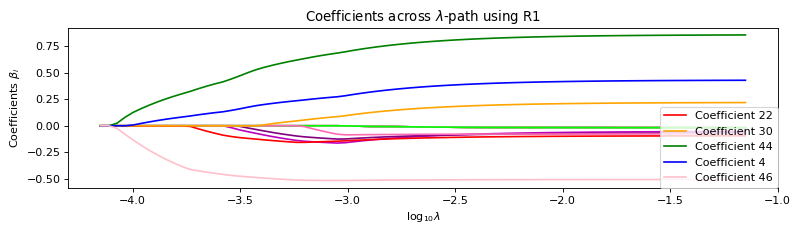

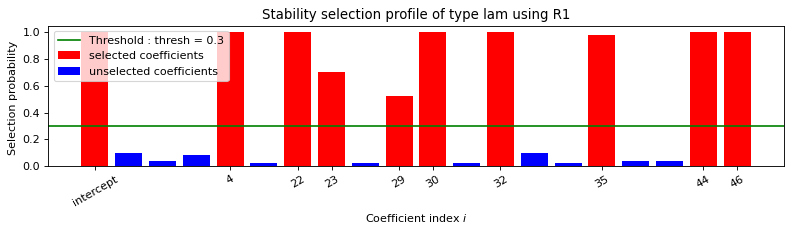

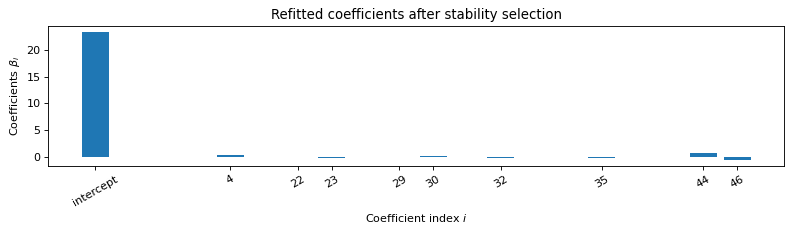


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.127s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.25 0.00 0.00 0.00 0.00
 0.00 -0.05 0.16 0.00 -0.20 0.00 0.00 -0.17 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.81 0.00 -0.52]
Error: 0.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

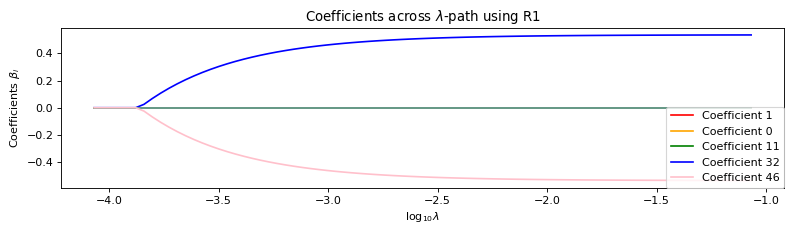

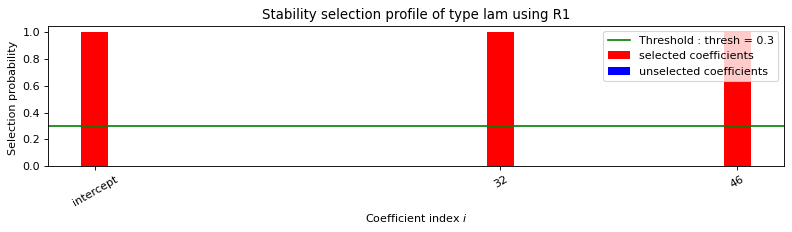

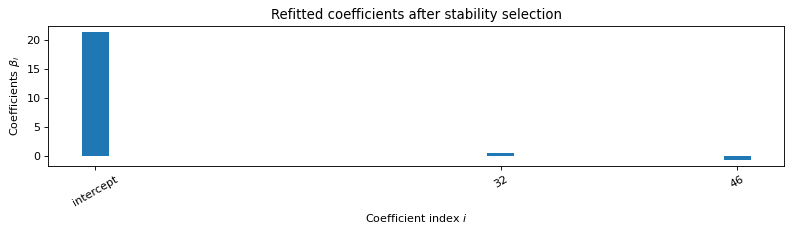


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.54 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.54]
Error: 6.94

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


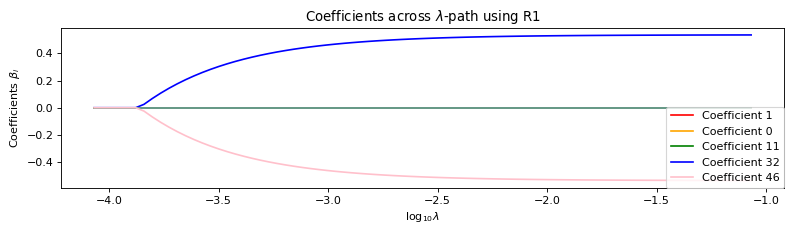

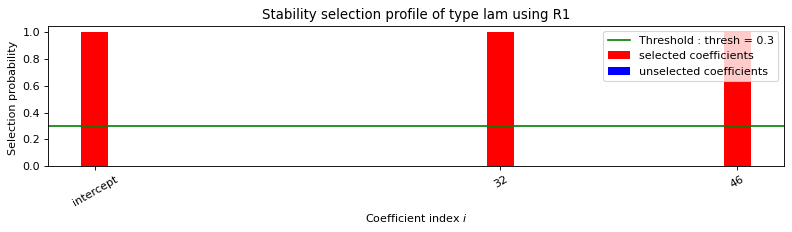

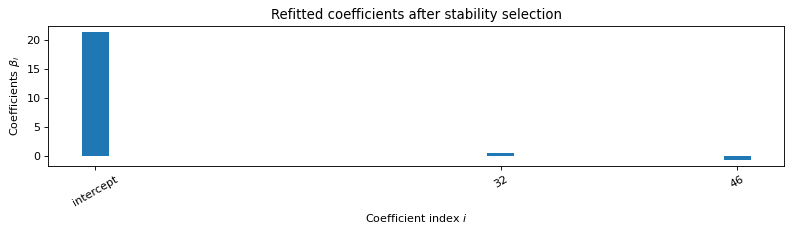


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.53 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.54]
Error: 6.94

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.8

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -760032.605
Model:                         IV2SLS   Adj. R-squared:            -796718.382
Method:                     Two Stage   F-statistic:                -4.911e-18
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:15:30                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.9771   1.58e+10  -5.04e-10      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.40 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.17 -0.09 0.02 0.02 0.01 0.01 0.01
 -0.05 -0.22 0.02 0.02 0.02 0.02 0.07 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.01 -0.86 0.03 0.51]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.42 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.18 0.08
 -0.02 -0.02 -0.02 -0.02 -0.02 0.04 0.22 -0.02 -0.02 -0.02 -0.02 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.86 -0.02 -0.50]

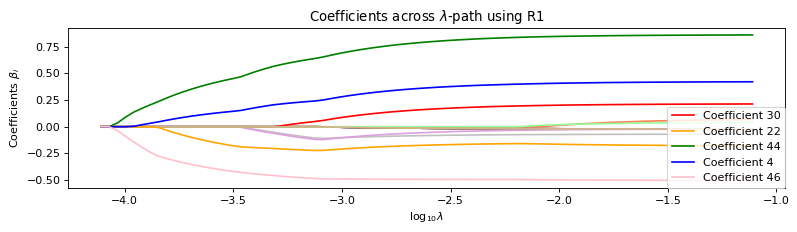

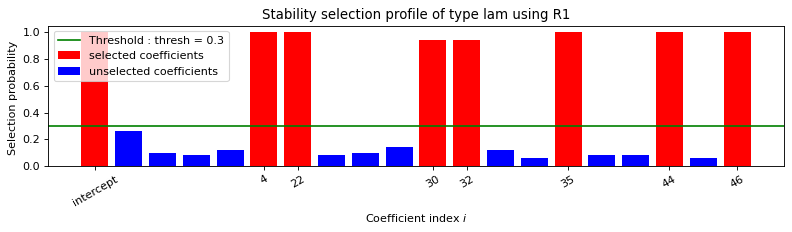

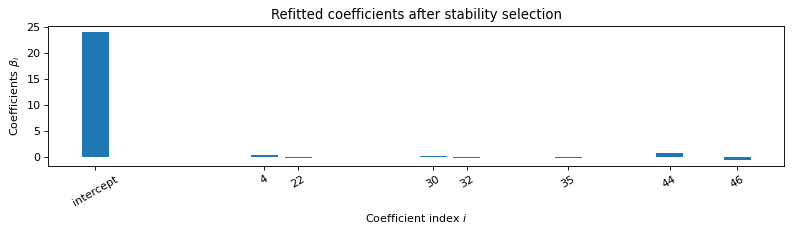


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.125s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.26 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.14 0.00 -0.22 0.00 0.00 -0.20 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.77 0.00 -0.54]
Error: 0.6

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------------

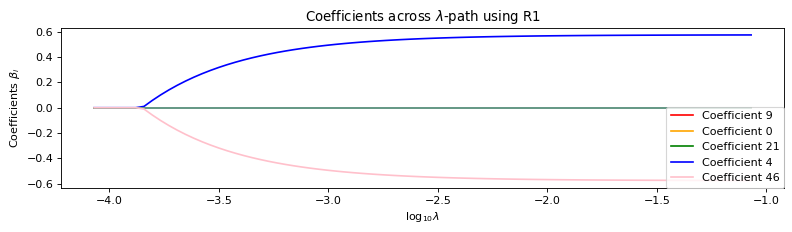

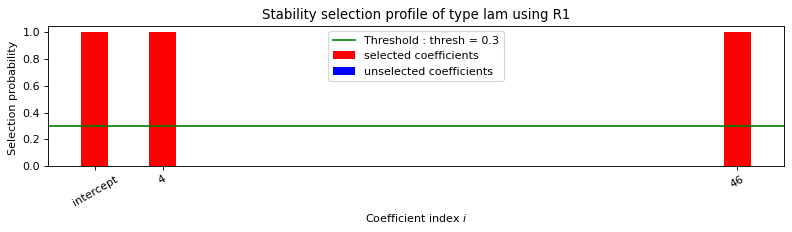

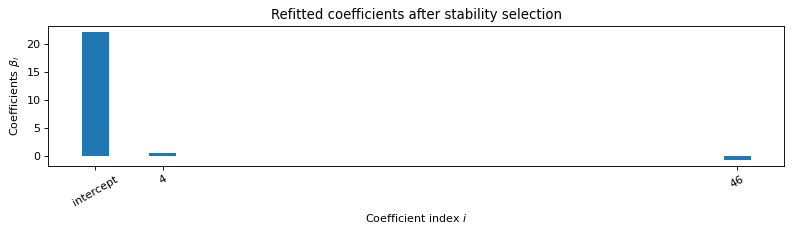


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.068s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 3.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


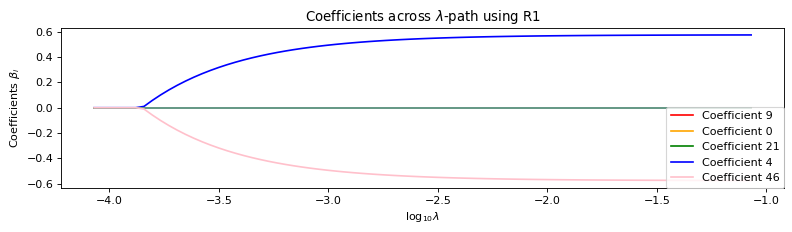

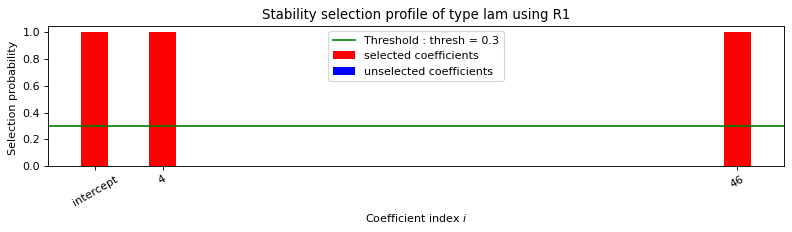

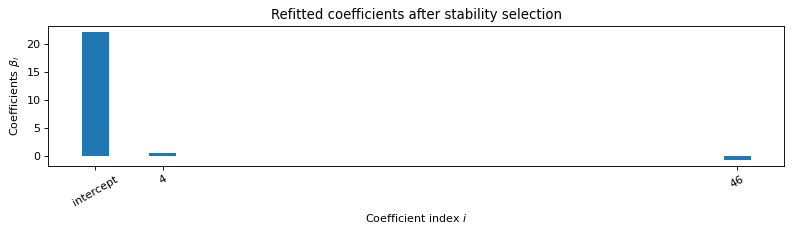


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.06s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.41

---------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -192738.502
Model:                         IV2SLS   Adj. R-squared:            -202041.773
Method:                     Two Stage   F-statistic:                 2.971e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:18:19                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         54.0326        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.43 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.15 0.03 0.01 0.01 0.01 0.01 0.01
 -0.18 -0.17 0.02 0.08 0.02 0.02 0.11 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.84 0.03 0.53]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.46 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.16 -0.04
 -0.02 -0.02 -0.02 -0.02 -0.02 0.17 0.17 -0.02 -0.07 -0.02 -0.02 -0.11
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.84 -0.02 -0.52]

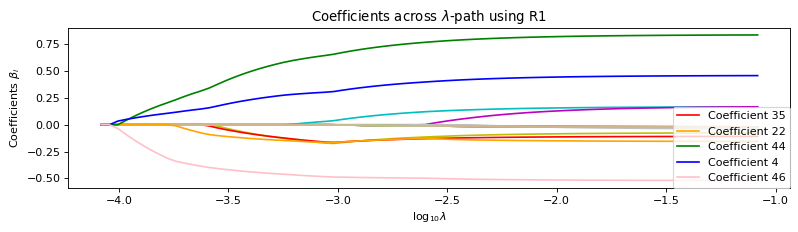

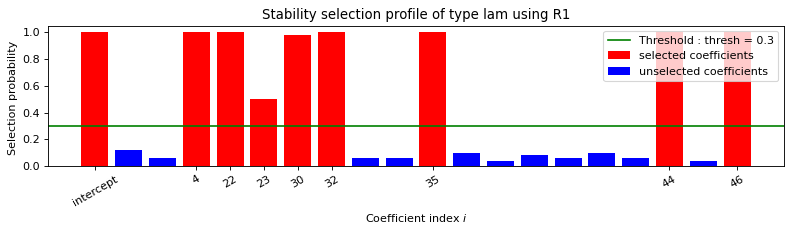

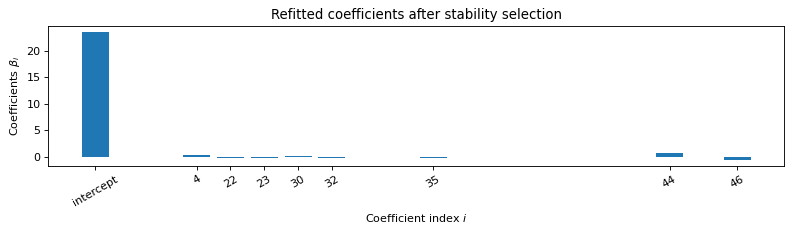


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.119s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.37 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.18 0.00 0.00 0.00 0.00
 0.00 0.00 0.11 0.00 -0.22 0.00 0.00 -0.21 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.51]
Error: 0.55

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

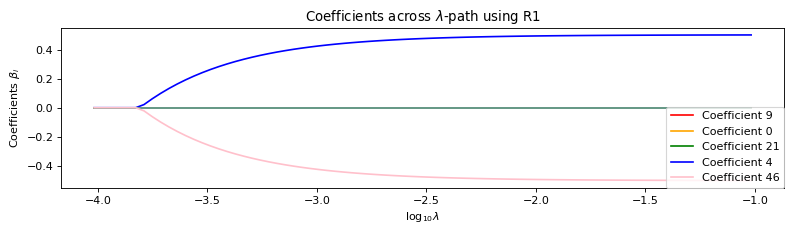

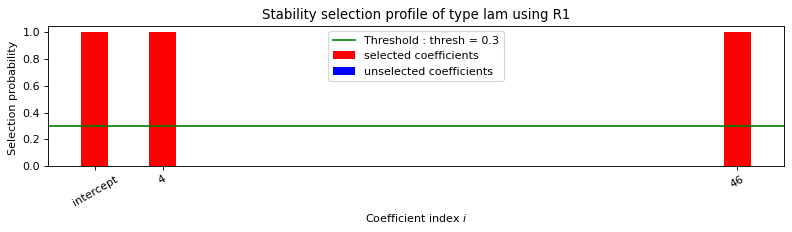

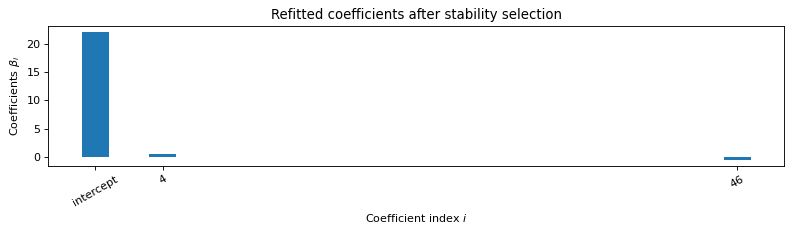


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.06s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.50 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.50]
Error: 3.25

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


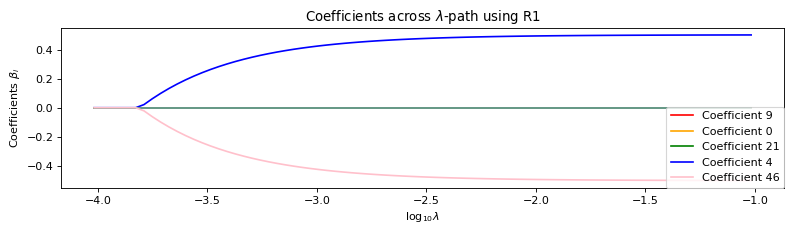

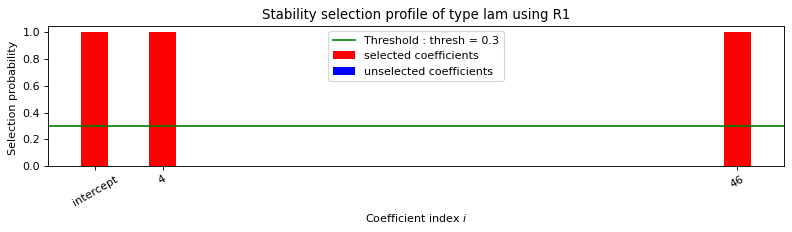

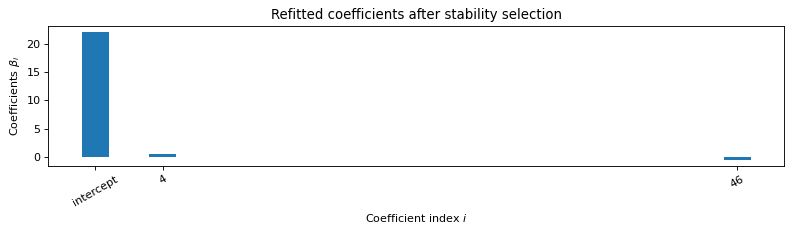


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.45 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.51]
Error: 3.25

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.56

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -1221649.721
Model:                         IV2SLS   Adj. R-squared:           -1280617.122
Method:                     Two Stage   F-statistic:                 5.453e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:21:03                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -42.0195   5.31e+09  -7.91e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.41 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.19 -0.17 0.02 0.02 0.02 0.02 0.02
 0.02 -0.21 0.02 -0.01 0.02 0.02 0.11 0.02 0.02 0.02 0.02 0.02 0.02 0.01
 0.01 -0.77 0.03 0.49]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.43 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.19 0.17
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.21 -0.02 0.01 -0.02 -0.02 -0.11
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.77 -0.02 -0.49]

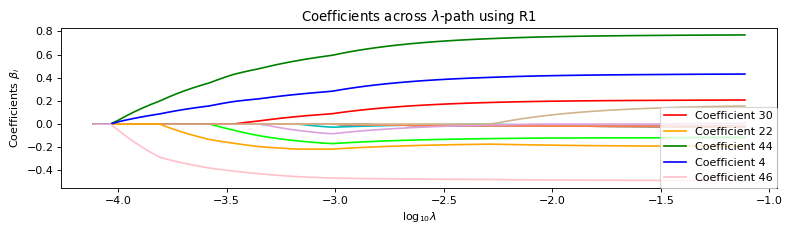

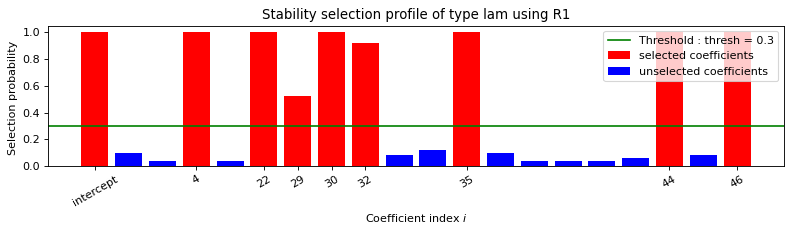

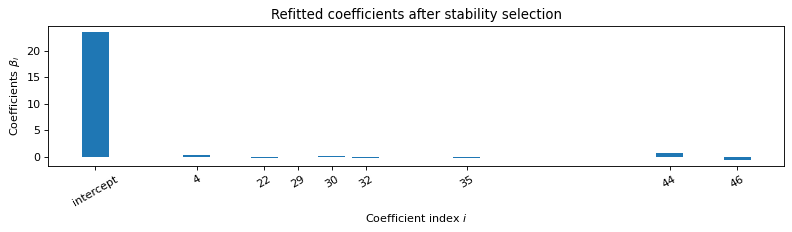


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.116s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00
 0.00 -0.09 0.14 0.00 -0.15 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.70 0.00 -0.49]
Error: 0.55

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

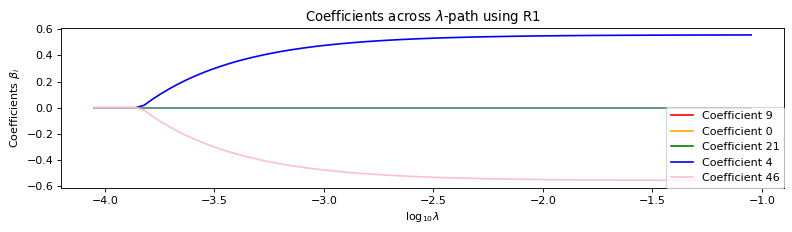

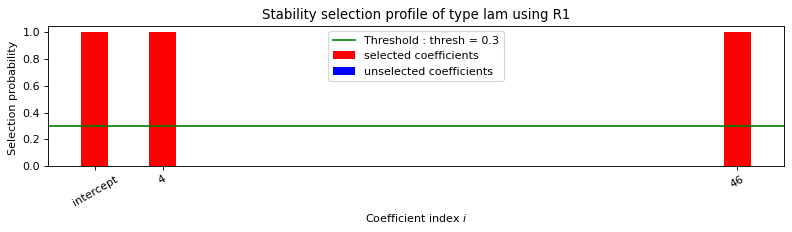

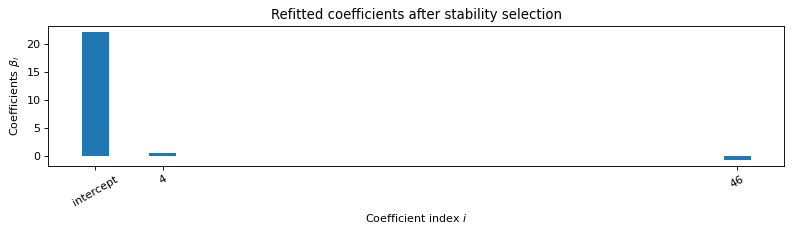


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.002s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.064s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 3.39

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


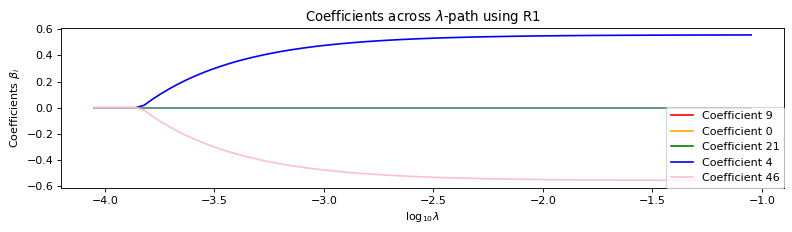

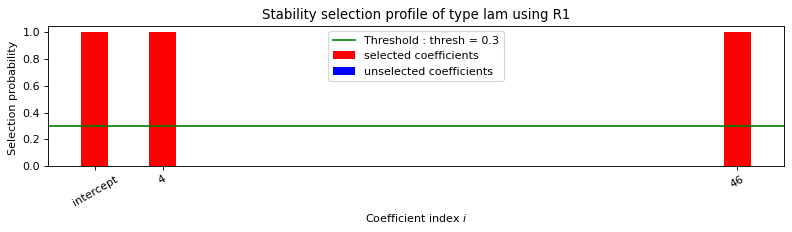

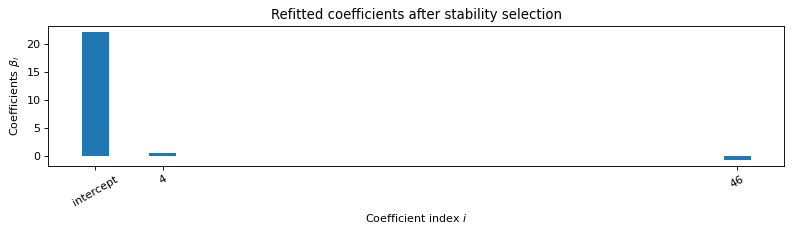


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.56]
Error: 3.39

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.91

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -164052.393
Model:                         IV2SLS   Adj. R-squared:            -171971.024
Method:                     Two Stage   F-statistic:                -2.662e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:23:48                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -88.5178        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.43 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.04 0.00 0.02 0.02 0.02 0.02 0.02
 0.04 -0.23 0.02 0.04 0.02 0.02 0.06 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.01 -0.86 0.03 0.55]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.45 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.05 0.00
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.04 0.23 -0.02 -0.04 -0.02 -0.02 -0.06
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.86 -0.02 -0.54]


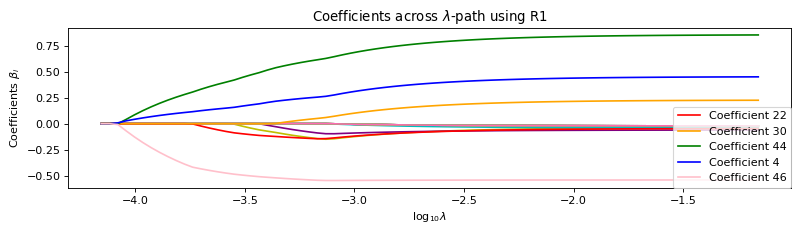

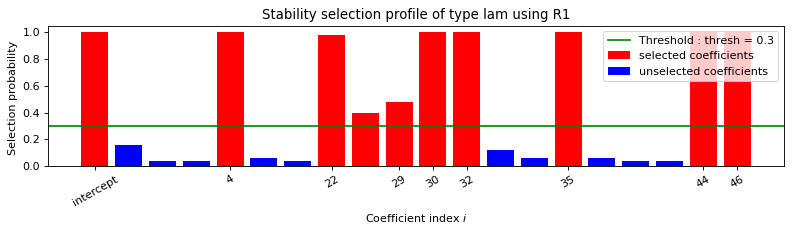

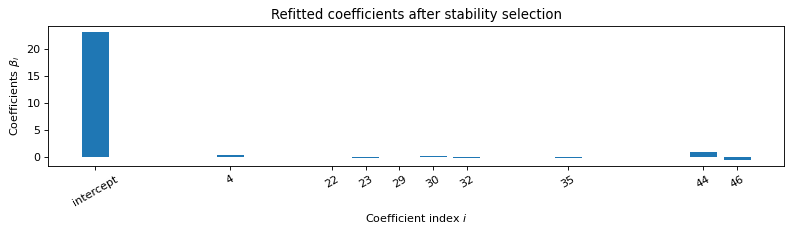


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.125s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.36 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.08 -0.23 0.00 0.00 0.00 0.00
 0.00 -0.09 0.17 0.00 -0.19 0.00 0.00 -0.17 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.56]
Error: 0.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

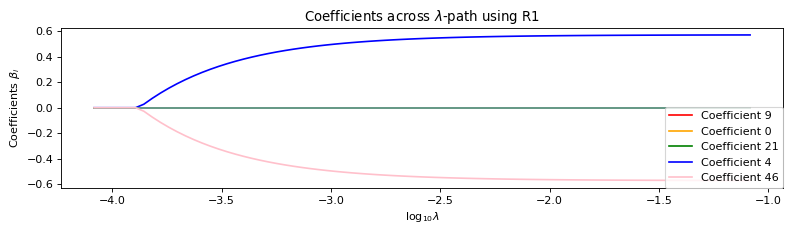

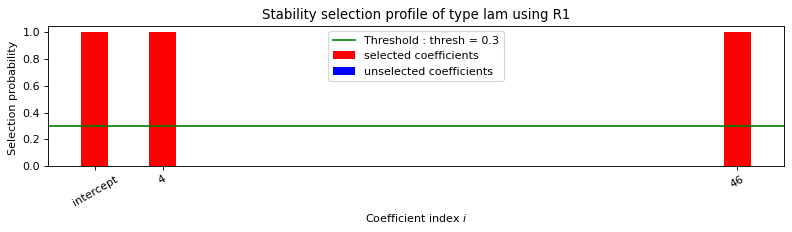

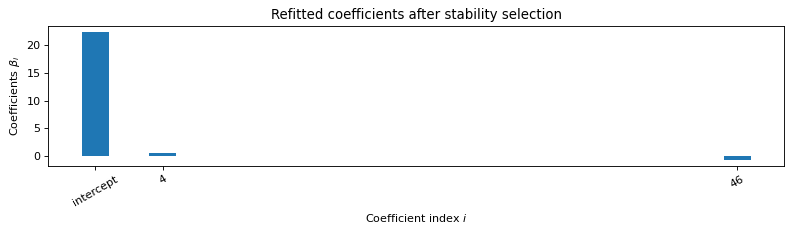


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.06s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 4.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


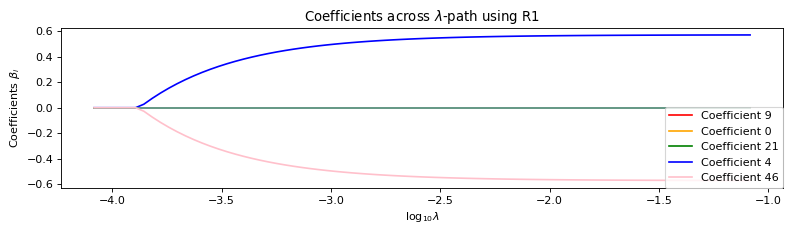

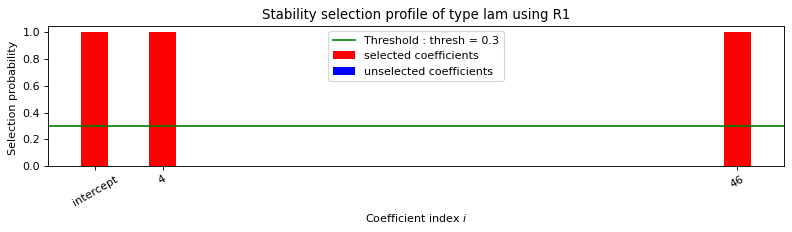

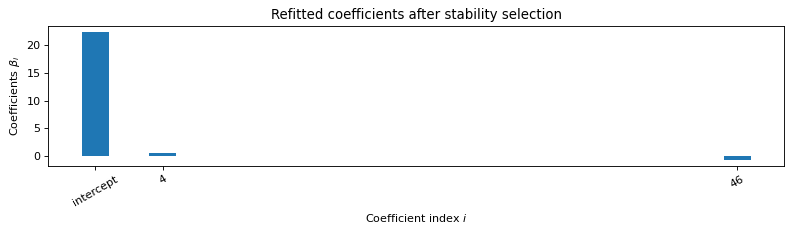


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.057s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 4.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.85

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -4876412.925
Model:                         IV2SLS   Adj. R-squared:           -5111790.722
Method:                     Two Stage   F-statistic:                 1.454e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:26:33                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -91.6509   1.14e+11  -8.06e-10      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.07 -0.12 0.02 0.02 0.02 0.02 0.02
 0.09 -0.21 0.02 -0.03 0.02 0.02 0.01 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.79 0.04 0.50]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.45 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.08 0.12
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.10 0.20 -0.02 0.03 -0.02 -0.02 -0.01
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.80 -0.02 -0.49]

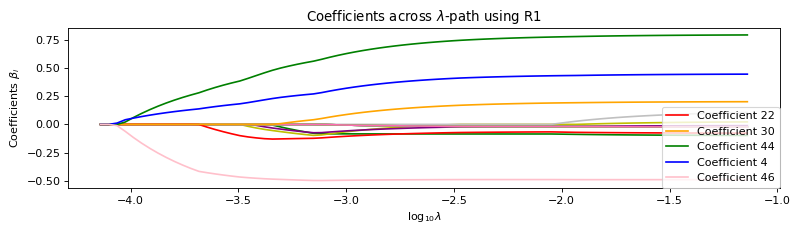

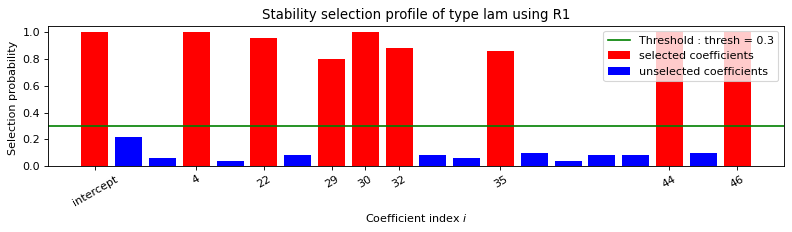

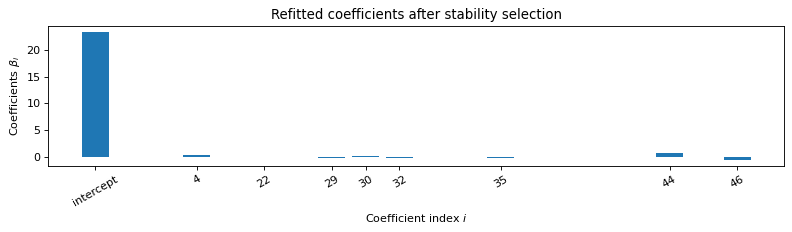


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.164s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.11 0.00 0.00 0.00 0.00 0.00
 0.00 -0.21 0.12 0.00 -0.18 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.71 0.00 -0.52]
Error: 0.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

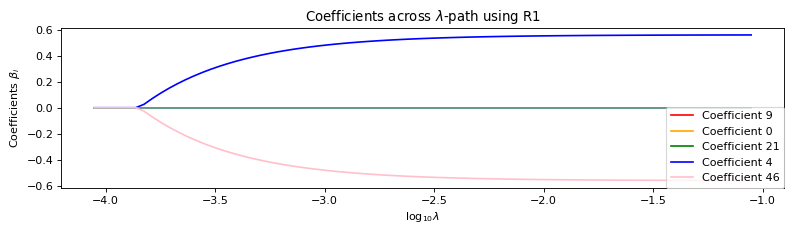

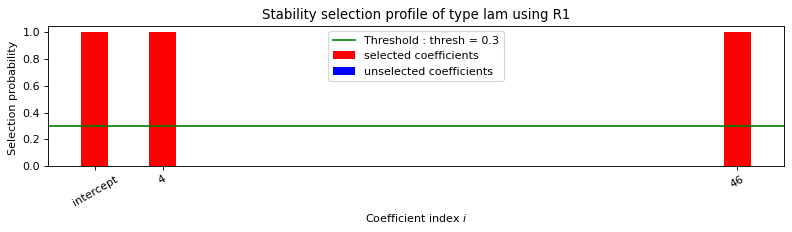

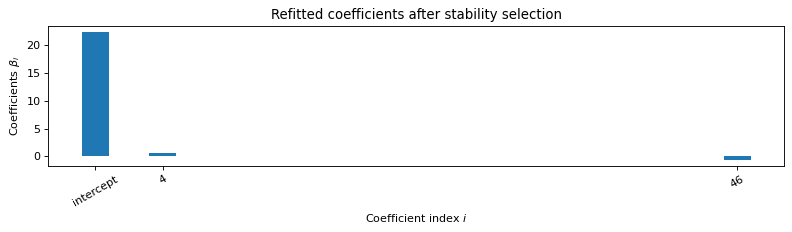


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.058s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 3.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


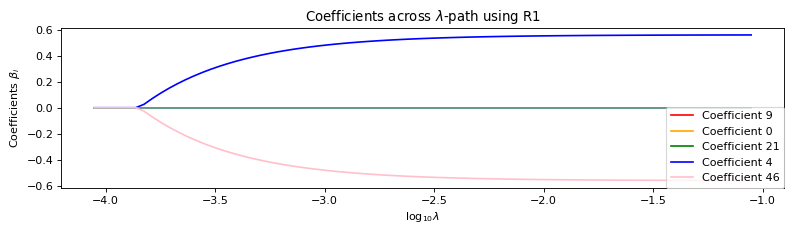

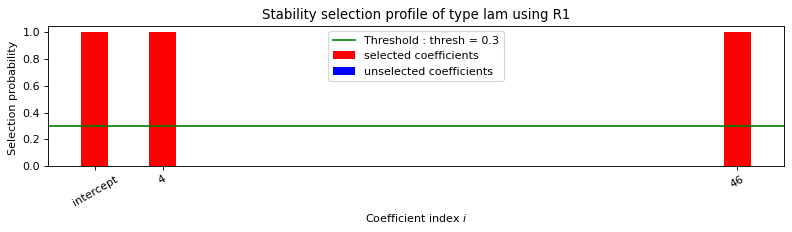

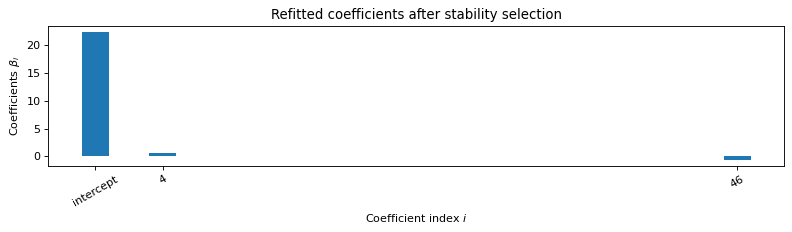


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.57]
Error: 3.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.87

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -414139.534
Model:                         IV2SLS   Adj. R-squared:            -434129.528
Method:                     Two Stage   F-statistic:                -1.383e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:29:16                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -212.6961        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.44 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.08 0.20 0.01 0.01 0.01 0.01 0.01
 0.00 -0.19 0.01 0.01 0.01 0.01 0.08 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.79 0.03 0.57]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.48 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.08 -0.19
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.19 -0.01 -0.01 -0.01 -0.01 -0.08
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.80 -0.01 -0.57]

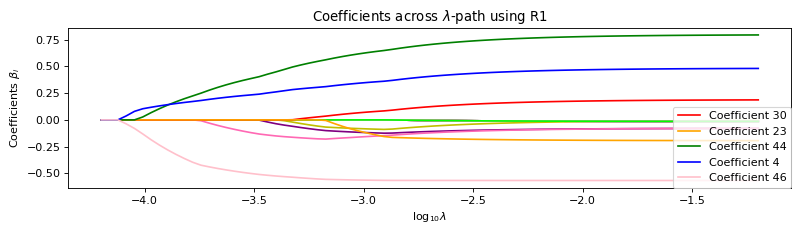

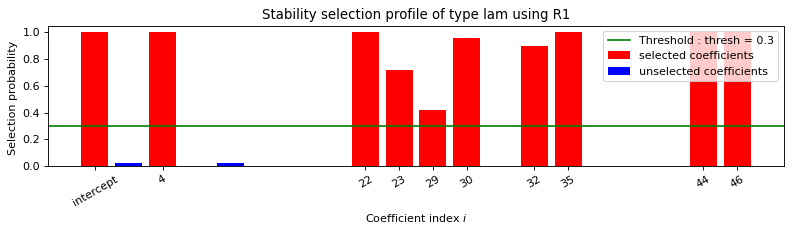

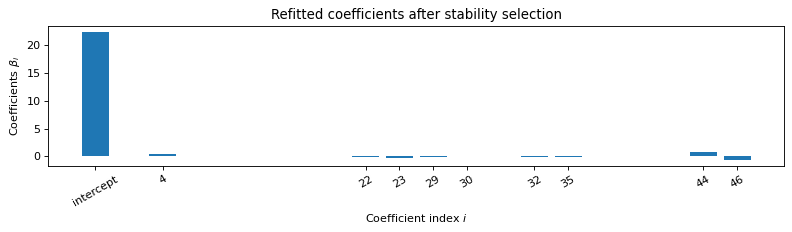


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.11s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.42 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.11 -0.33 0.00 0.00 0.00 0.00
 0.00 -0.04 0.14 0.00 -0.11 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.75 0.00 -0.58]
Error: 0.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.


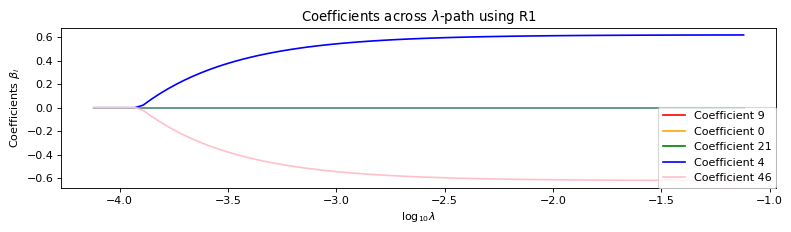

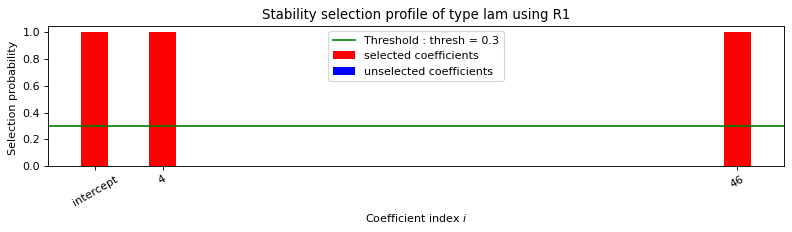

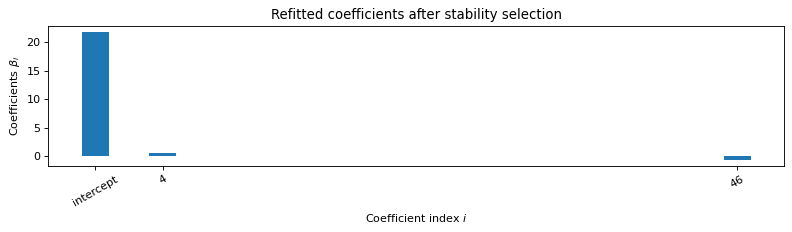


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.061s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.62 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.62]
Error: 3.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


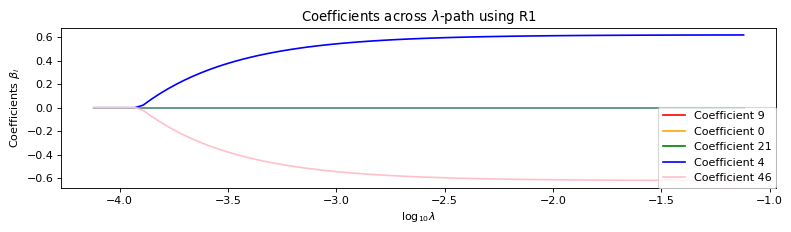

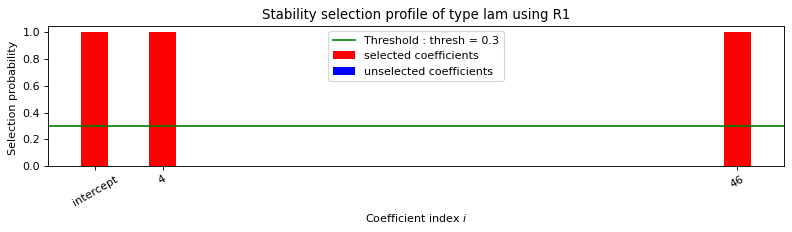

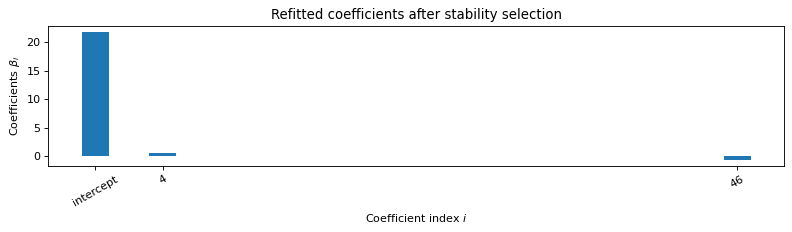


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.56 0.11 0.10 0.08 0.07 0.07 0.06 0.05 0.05 0.05 0.04
 0.04 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 0.01 0.01 0.63]
Error: 3.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.69

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -289179.689
Model:                         IV2SLS   Adj. R-squared:            -303138.044
Method:                     Two Stage   F-statistic:                -6.213e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:31:58                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -22.9249        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.39 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.08 -0.24 0.03 0.03 0.02 0.02 0.02
 0.07 -0.32 0.03 -0.01 0.03 0.03 0.08 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.87 0.04 0.59]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.41 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.08 0.24
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.08 0.32 -0.03 0.02 -0.03 -0.03 -0.08
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.87 -0.03 -0.58]

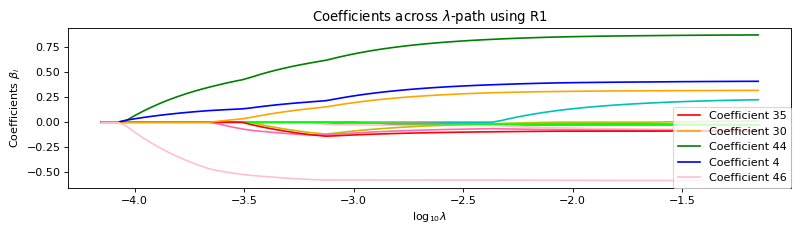

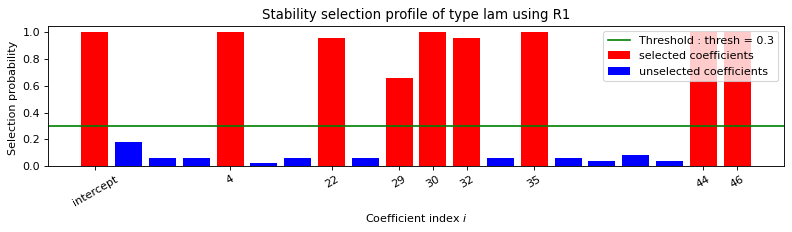

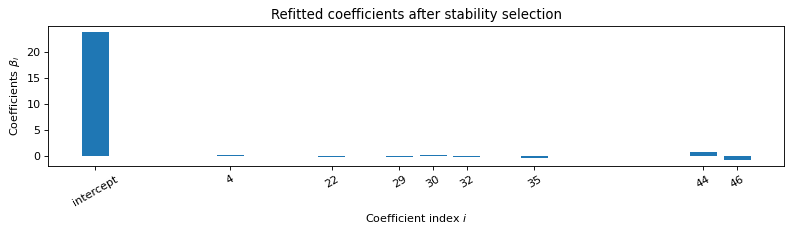


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.126s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.28 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 0.00 0.00 0.00 0.00 0.00
 0.00 -0.15 0.25 0.00 -0.20 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.77 0.00 -0.60]
Error: 0.82

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

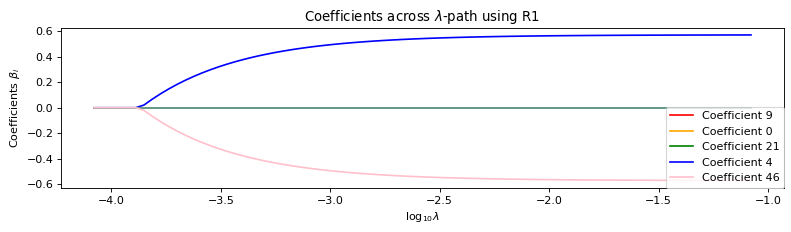

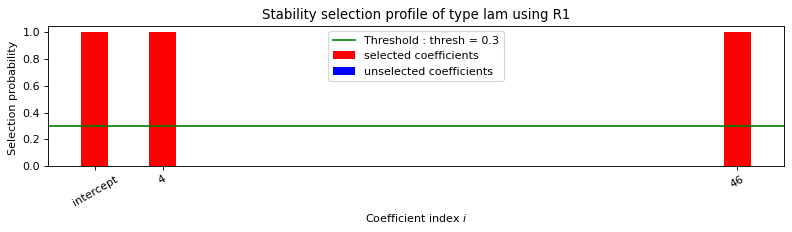

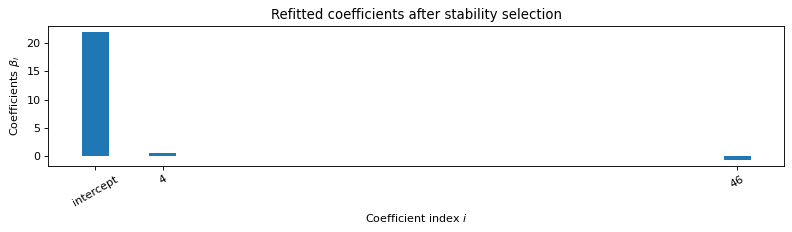


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.068s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.57 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.57]
Error: 3.3

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


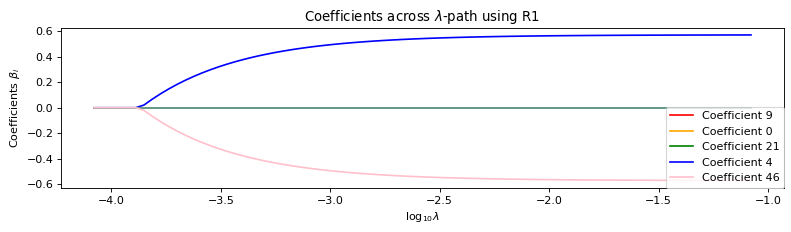

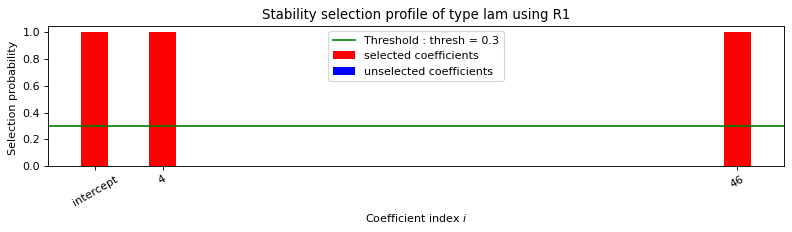

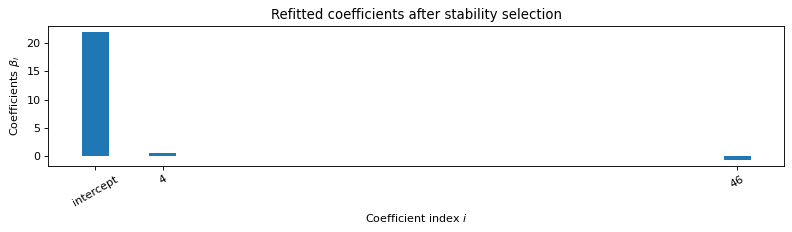


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.063s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.3

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.34

---------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -797395.440
Model:                         IV2SLS   Adj. R-squared:            -835884.670
Method:                     Two Stage   F-statistic:                -1.534e-13
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:34:46                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -920.7906        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.49 0.10 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.07 -0.12 0.03 0.03 0.02 0.02 0.02
 0.07 -0.25 0.03 0.00 0.03 0.03 -0.05 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 -0.88 0.04 0.57]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.52 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.08 0.11
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.08 0.24 -0.03 0.00 -0.03 -0.03 0.04
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.89 -0.03 -0.56]


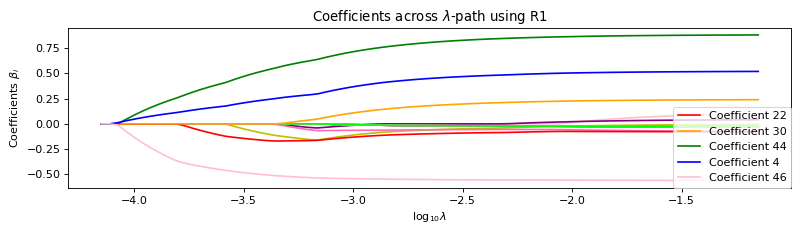

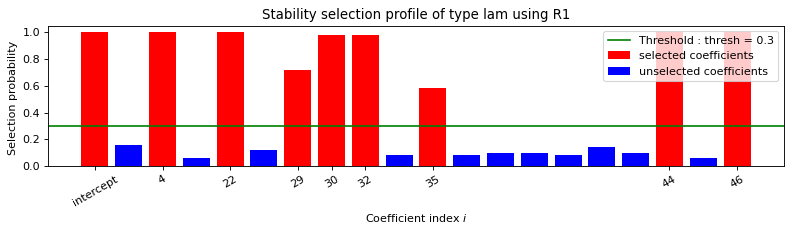

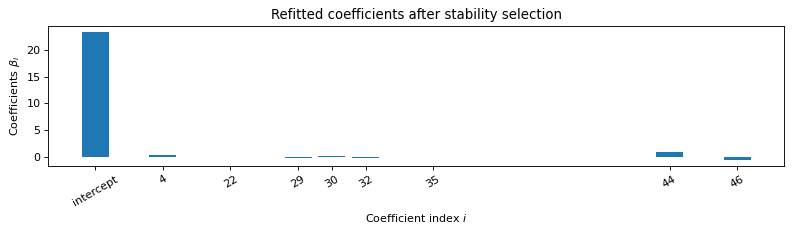


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    29    30    32    35    44    46    
   Running time :  0.131s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.37 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.16 0.00 0.00 0.00 0.00 0.00
 0.00 -0.19 0.14 0.00 -0.25 0.00 0.00 -0.12 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.79 0.00 -0.58]
Error: 0.68

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

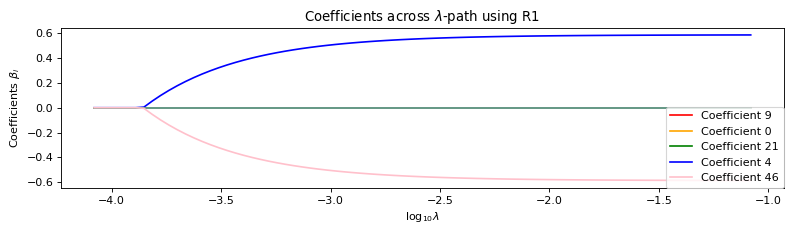

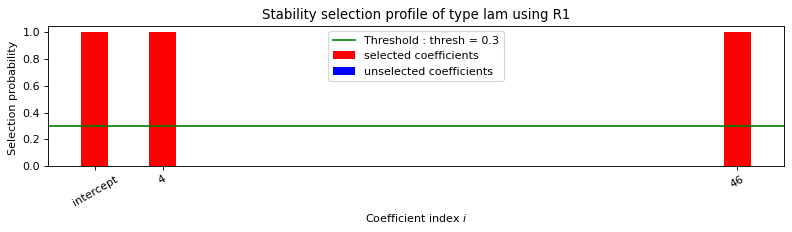

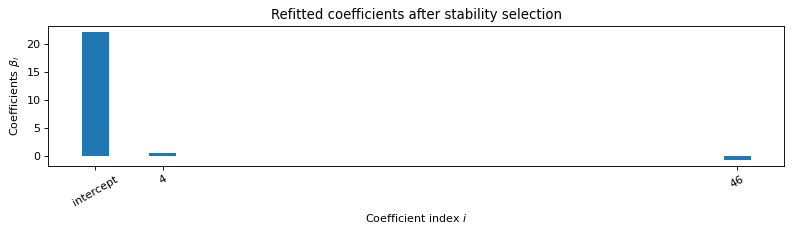


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.065s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.59 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.59]
Error: 4.0

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


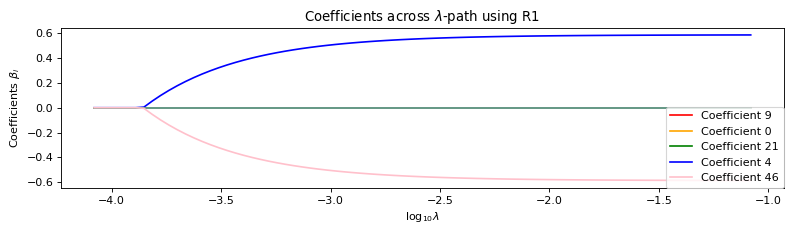

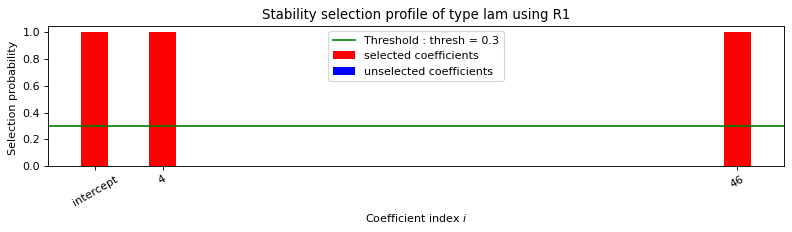

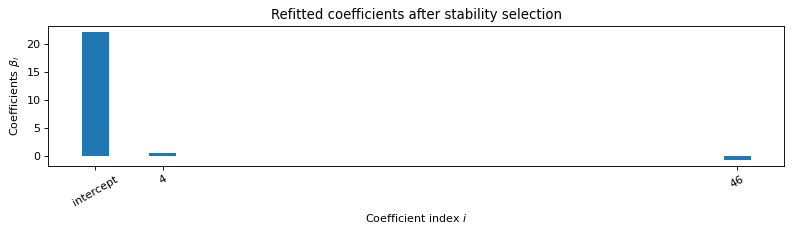


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.065s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.59]
Error: 4.0

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 15.17

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -4661.557
Model:                         IV2SLS   Adj. R-squared:              -4886.612
Method:                     Two Stage   F-statistic:                -2.274e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:37:43                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5460   8.74e+08  -1.77e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.44 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.12 0.05 0.01 0.01 0.01 0.01 0.01
 -0.02 -0.25 0.02 0.02 0.02 0.02 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.01 -0.83 0.03 0.55]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.48 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.12 -0.06
 -0.02 -0.02 -0.02 -0.02 -0.02 0.01 0.25 -0.02 -0.02 -0.02 -0.02 -0.03
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.83 -0.02 -0.54]

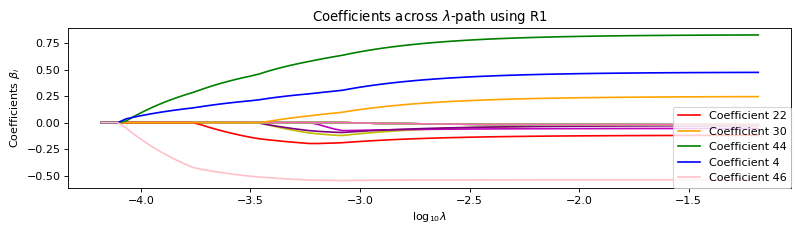

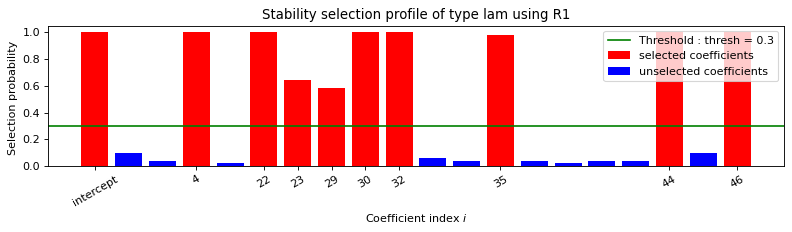

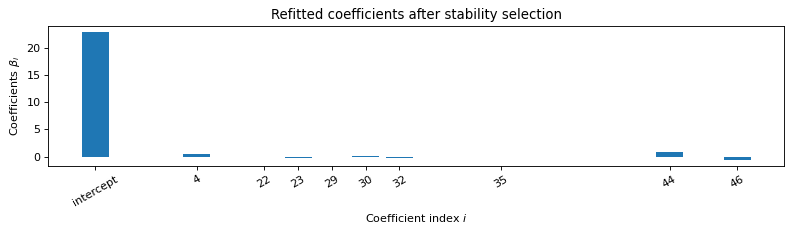


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.141s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.38 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.16 -0.28 0.00 0.00 0.00 0.00
 0.00 -0.02 0.18 0.00 -0.18 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.77 0.00 -0.56]
Error: 0.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

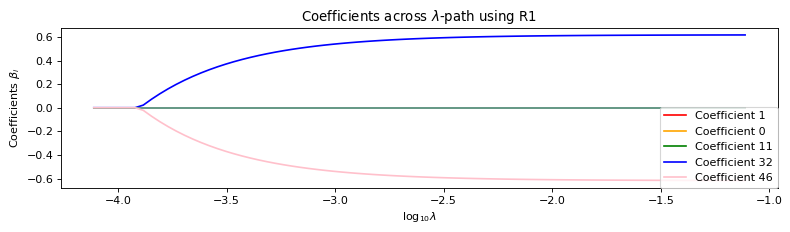

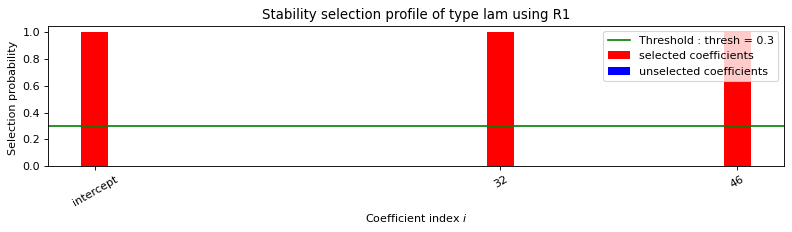

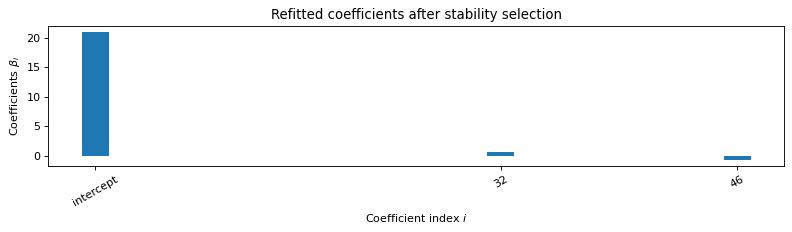


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.069s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.62 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.62]
Error: 8.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


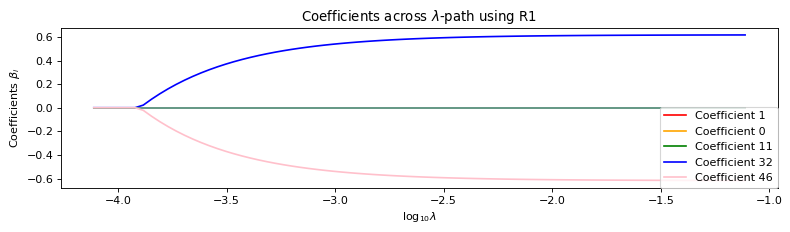

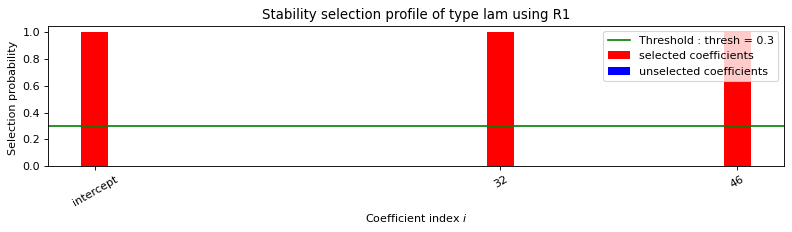

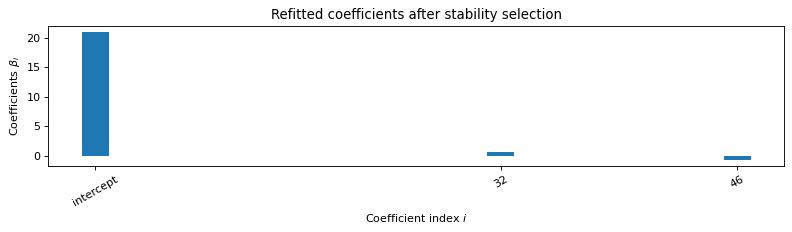


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.065s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.61 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01
 0.01 0.01 0.01 0.62]
Error: 8.51

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 7.12

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -713070.389
Model:                         IV2SLS   Adj. R-squared:            -747489.365
Method:                     Two Stage   F-statistic:                -1.812e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:40:40                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        219.2403   6.09e+09    3.6e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.13 0.04 0.01 0.01 0.01 0.01 0.01
 -0.05 -0.23 0.02 0.07 0.02 0.02 0.17 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.73 0.03 0.57]
Estimated Beta: [-0.01 -0.01 -0.01 -0.01 0.46 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.13 -0.04
 -0.01 -0.01 -0.01 -0.01 -0.01 0.05 0.23 -0.01 -0.06 -0.01 -0.01 -0.17
 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 -0.01 0.74 -0.01 -0.57]

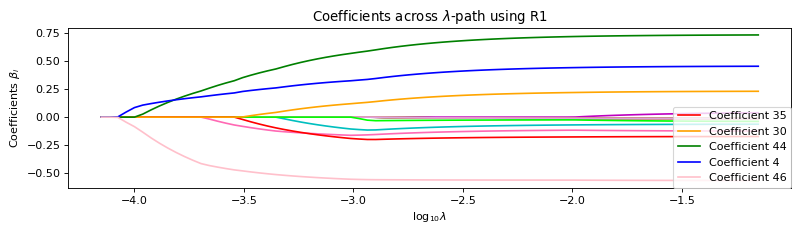

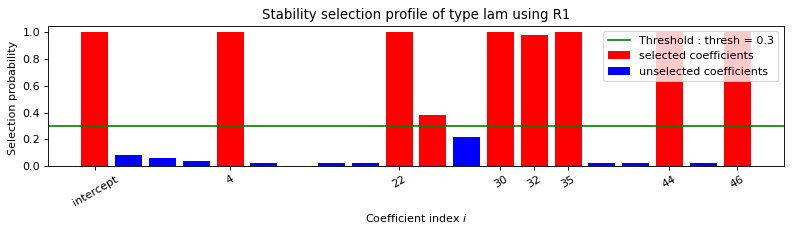

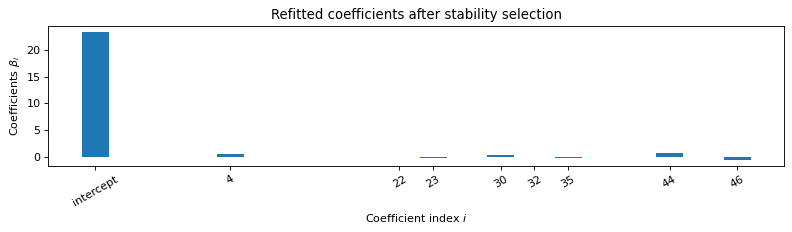


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.117s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.40 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.13 -0.18 0.00 0.00 0.00 0.00
 0.00 0.00 0.20 0.00 -0.16 0.00 0.00 -0.24 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.70 0.00 -0.58]
Error: 0.66

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

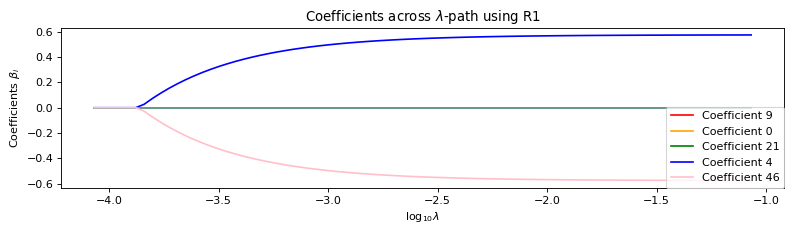

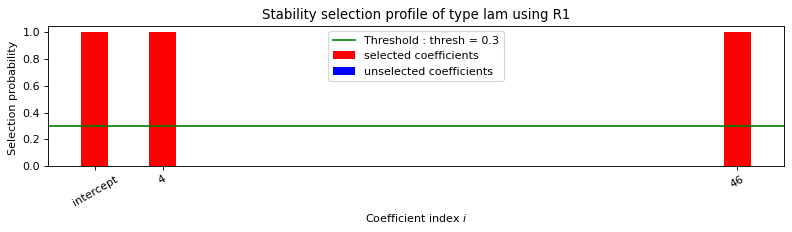

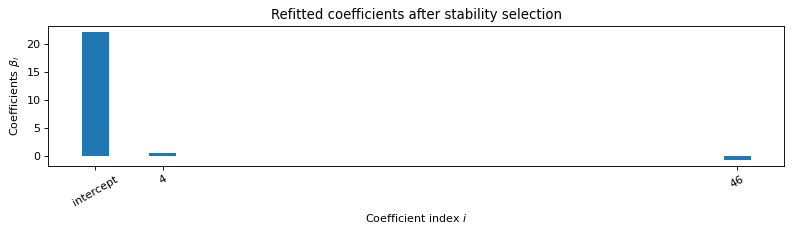


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.087s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.58 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.58]
Error: 3.7

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


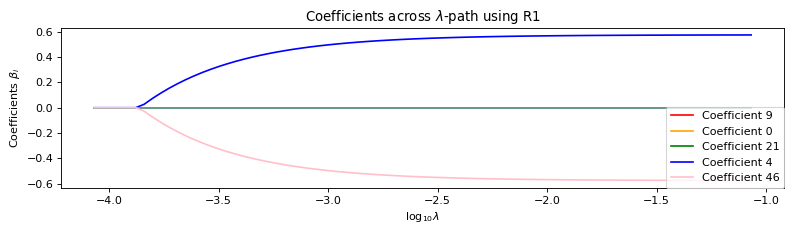

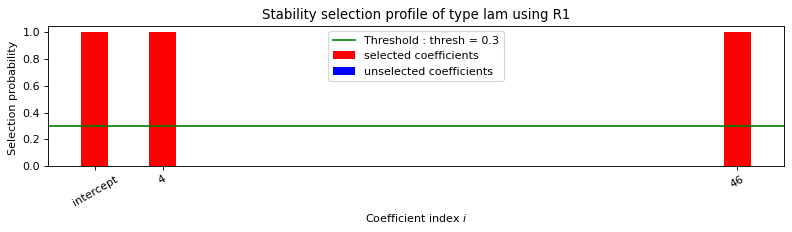

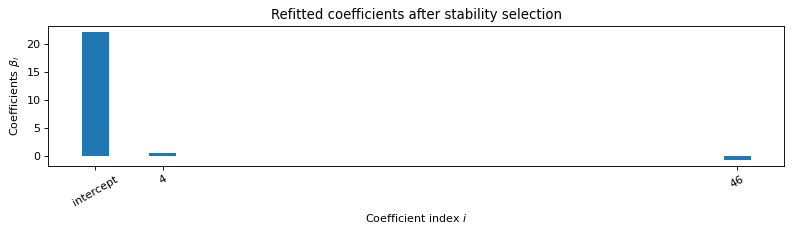


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.102s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.51 0.10 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.58]
Error: 3.7

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.31

---------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -293753.123
Model:                         IV2SLS   Adj. R-squared:            -307932.230
Method:                     Two Stage   F-statistic:                 1.774e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:43:38                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         34.4666   3.45e+09   9.99e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.39 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.20 -0.26 0.02 0.02 0.02 0.02 0.02
 -0.05 -0.28 0.03 -0.05 0.03 0.03 0.01 0.03 0.03 0.03 0.02 0.02 0.02 0.02
 0.02 -0.83 0.04 0.50]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.41 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.22 0.25
 -0.03 -0.03 -0.03 -0.03 -0.03 0.04 0.27 -0.03 0.04 -0.03 -0.03 -0.02
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.84 -0.03 -0.50]

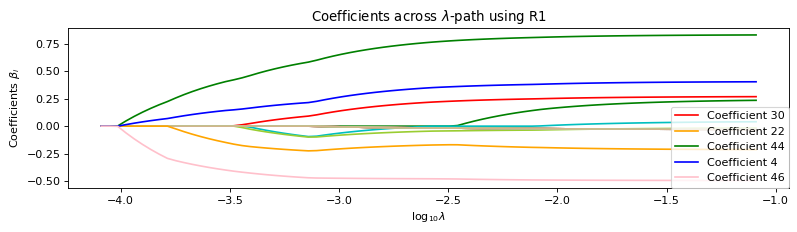

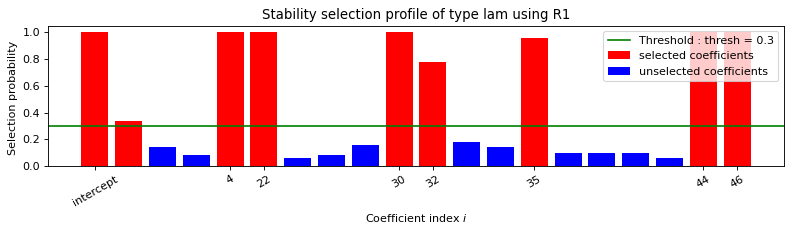

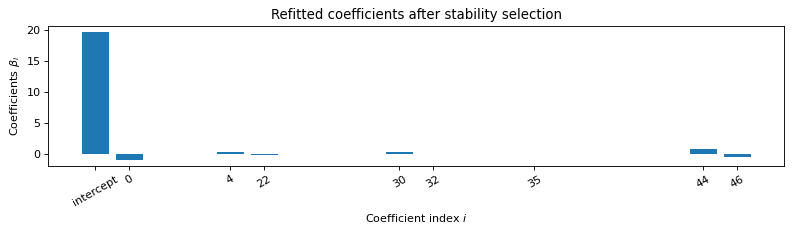


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    4    22    30    32    35    44    46    
   Running time :  0.129s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [-0.89 0.00 0.00 0.00 0.40 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.27 0.00 0.04 0.00 0.00 -0.02 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.84 0.00 -0.48]
Error: 0.57

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
--------

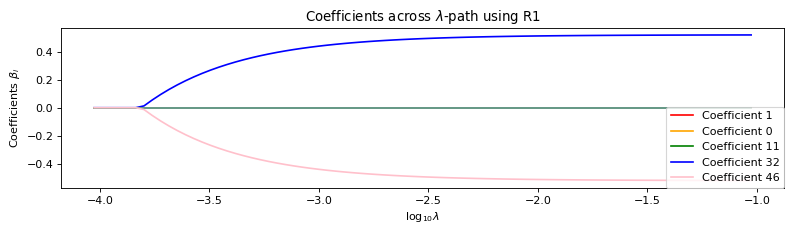

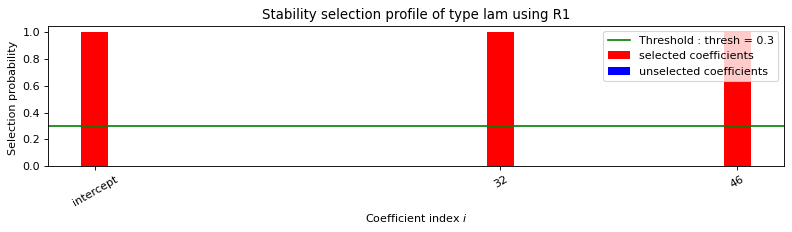

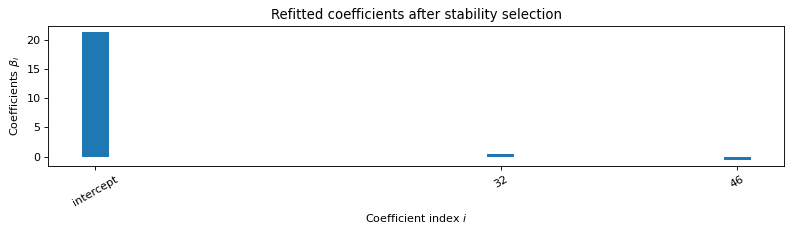


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.06s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.52 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.52]
Error: 6.89

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


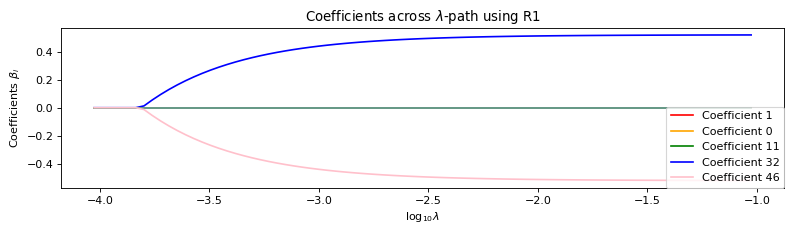

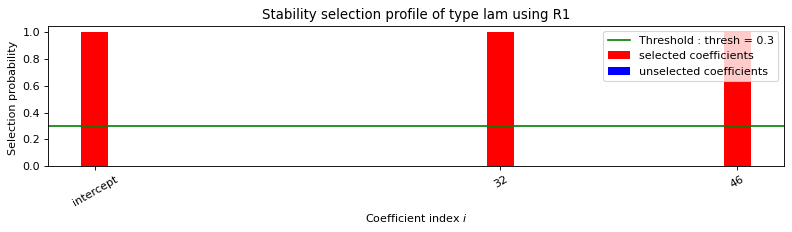

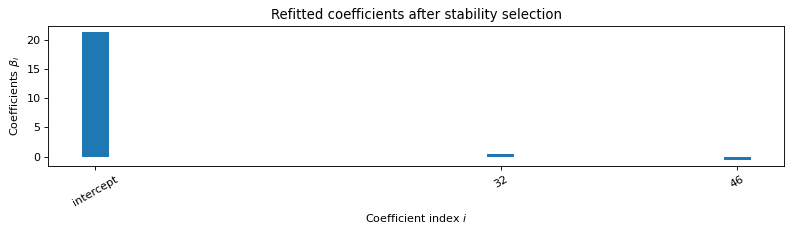


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.065s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.51 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.53]
Error: 6.89

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.39

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -2916.519
Model:                         IV2SLS   Adj. R-squared:              -3057.344
Method:                     Two Stage   F-statistic:                 7.037e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:46:44                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -16.9124   4.29e+08  -3.94e-08      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.41 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.14 -0.20 0.02 0.02 0.02 0.02 0.02
 0.00 -0.24 0.03 0.01 0.03 0.02 0.06 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.84 0.04 0.51]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.43 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.15 0.19
 -0.03 -0.03 -0.03 -0.03 -0.03 0.00 0.23 -0.03 -0.01 -0.03 -0.03 -0.06
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.85 -0.03 -0.50]


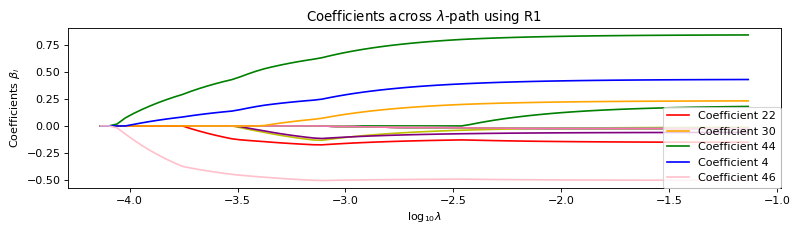

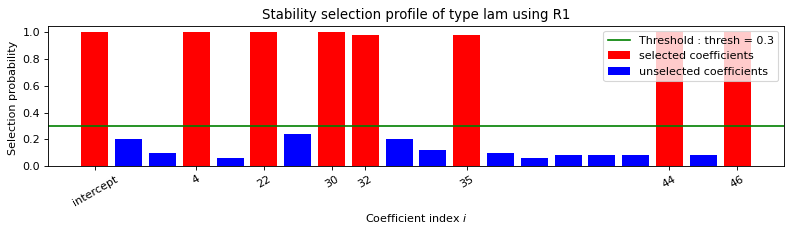

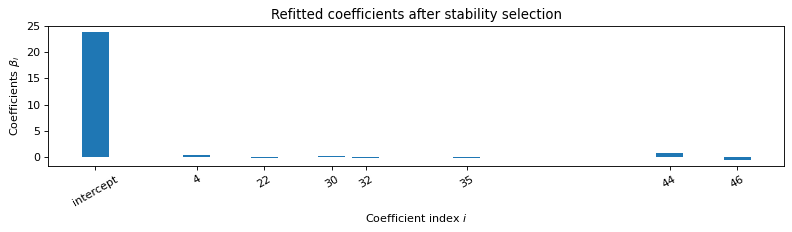


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.108s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.31 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.22 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.14 0.00 -0.23 0.00 0.00 -0.21 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.75 0.00 -0.54]
Error: 0.71

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

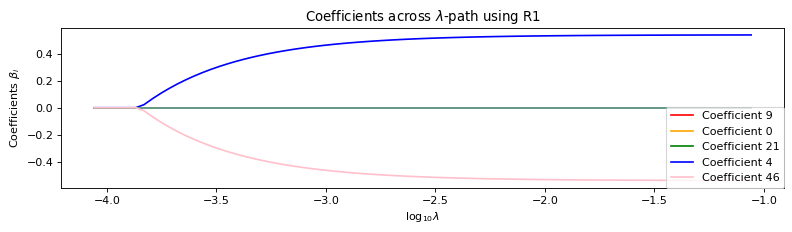

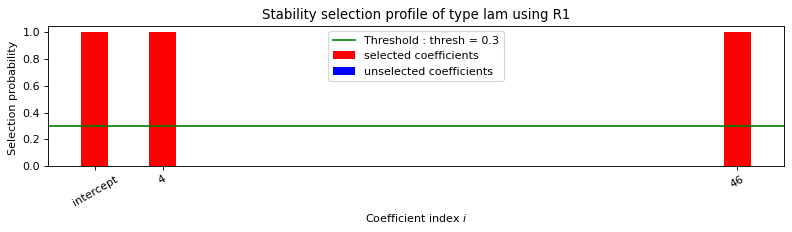

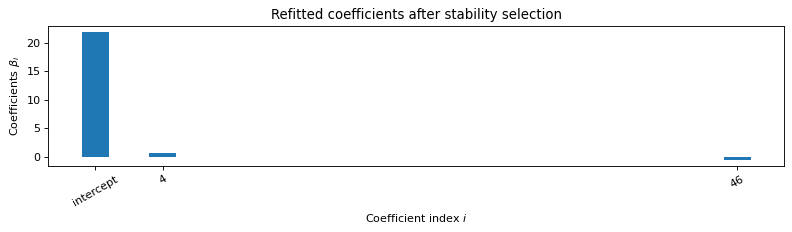


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.086s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.54 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.54]
Error: 3.34

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


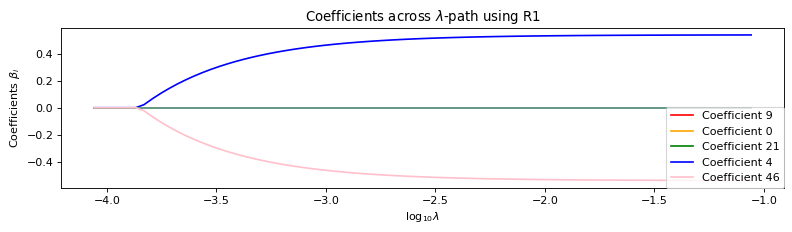

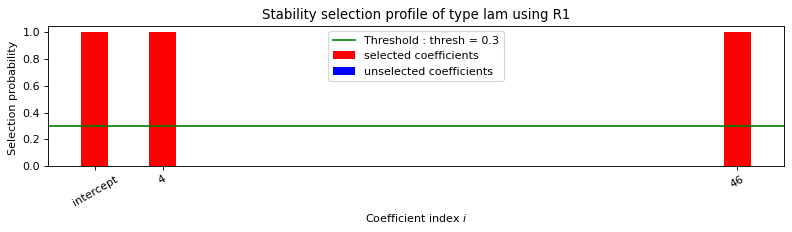

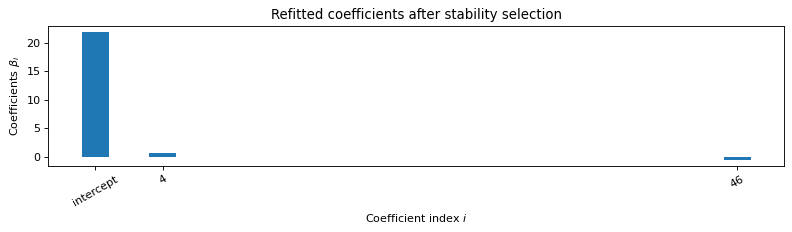


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.062s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.48 0.10 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.55]
Error: 3.34

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4.77

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -246797.570
Model:                         IV2SLS   Adj. R-squared:            -258710.197
Method:                     Two Stage   F-statistic:                 5.549e-17
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:49:42                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         31.1652        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.43 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.09 0.04 0.02 0.02 0.01 0.01 0.01
 0.00 -0.26 0.02 -0.01 0.02 0.02 0.01 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.90 0.04 0.52]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.46 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.09 -0.05
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.01 0.25 -0.02 0.00 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.91 -0.02 -0.51]

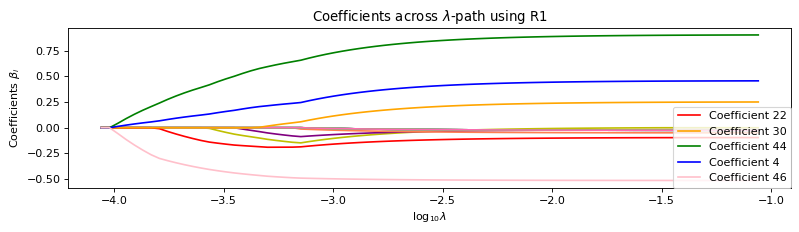

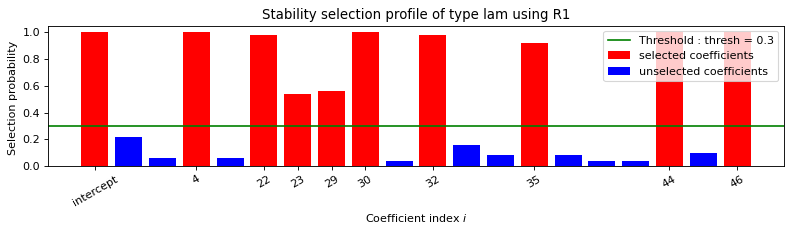

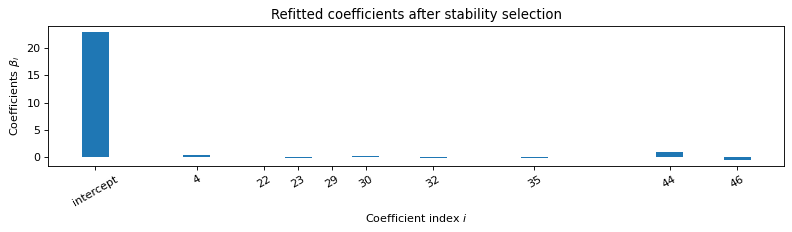


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.022s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.146s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.34 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.12 -0.30 0.00 0.00 0.00 0.00
 0.00 -0.08 0.18 0.00 -0.19 0.00 0.00 -0.14 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.83 0.00 -0.52]
Error: 0.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

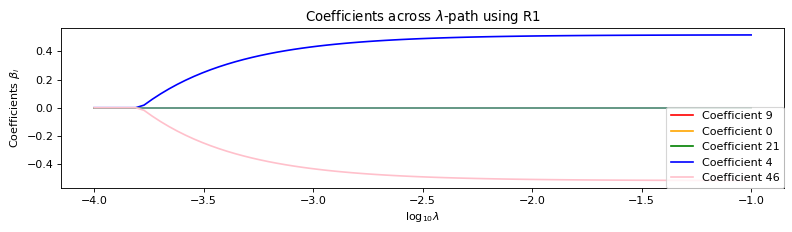

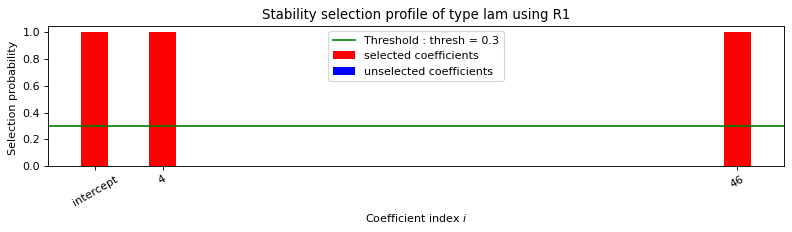

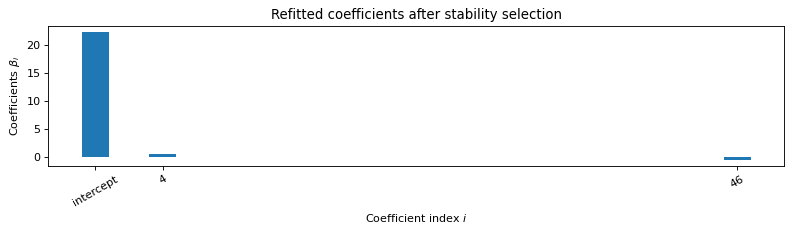


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.061s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.52 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.52]
Error: 3.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


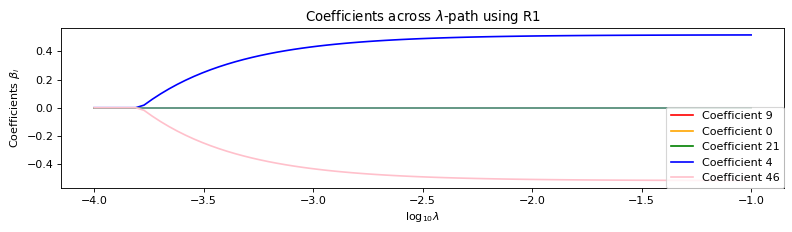

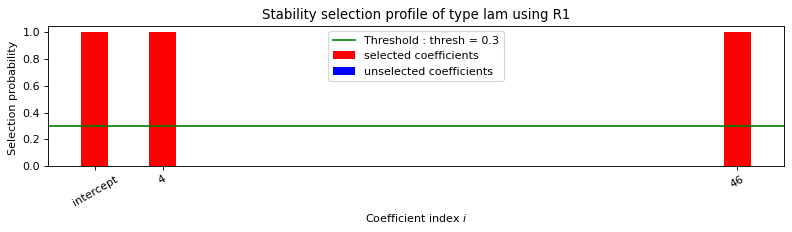

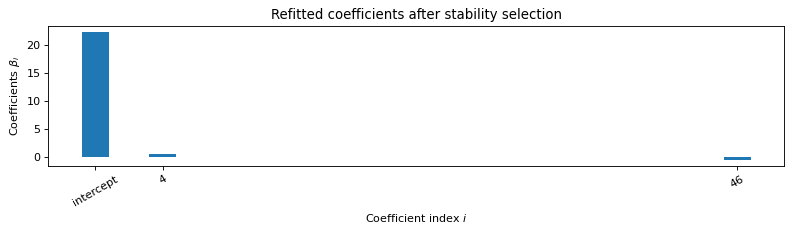


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.053s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.46 0.09 0.08 0.07 0.06 0.05 0.05 0.05 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.52]
Error: 3.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.86

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -7059.785
Model:                         IV2SLS   Adj. R-squared:              -7400.599
Method:                     Two Stage   F-statistic:                 6.309e-15
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:52:22                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.9348   2.74e+08  -3.41e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.39 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.03 0.03 0.03
 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.00 0.07 0.02 0.02 0.01 0.01 0.01
 0.04 -0.17 0.02 0.03 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 -0.83 0.03 0.60]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.42 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.00 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.04 0.16 -0.02 -0.04 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.83 -0.02 -0.59]


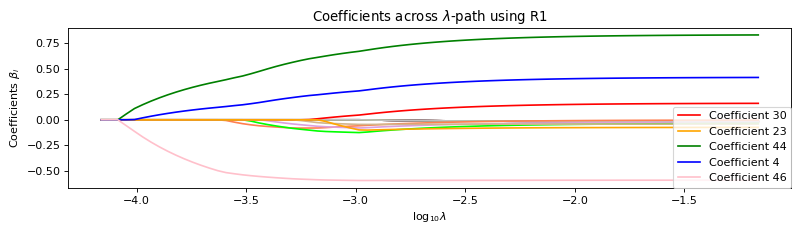

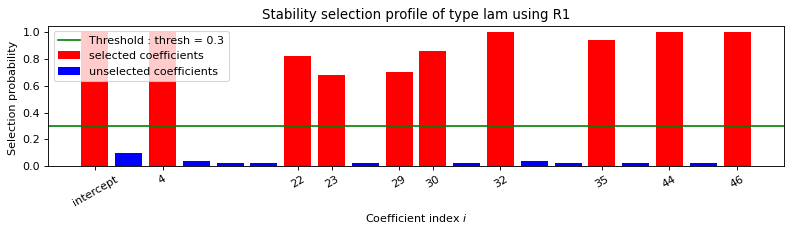

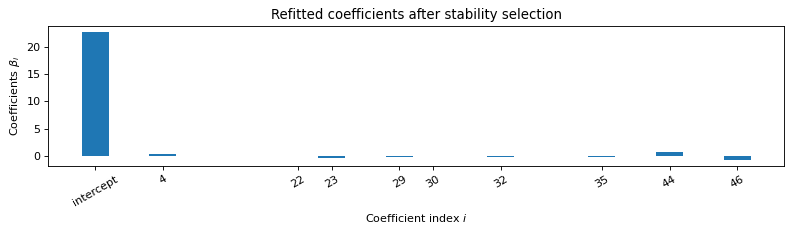


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.016s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    29    30    32    35    44    46    
   Running time :  0.186s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.35 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.02 -0.30 0.00 0.00 0.00 0.00
 0.00 -0.07 0.11 0.00 -0.15 0.00 0.00 -0.11 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.61]
Error: 0.52

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.

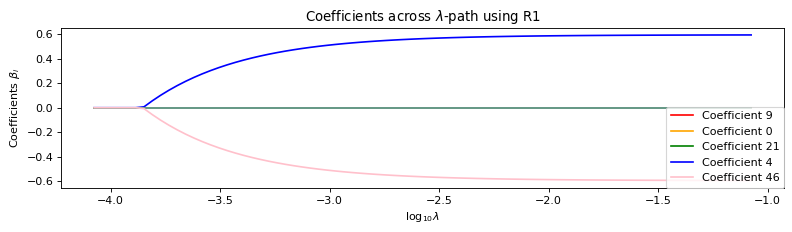

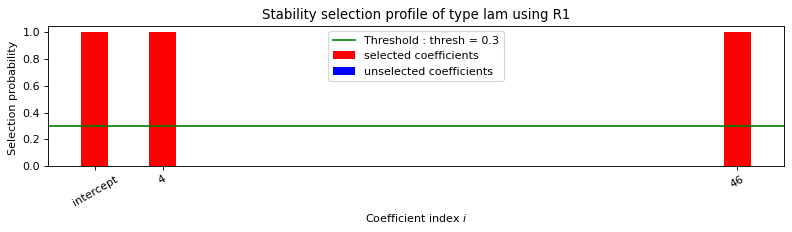

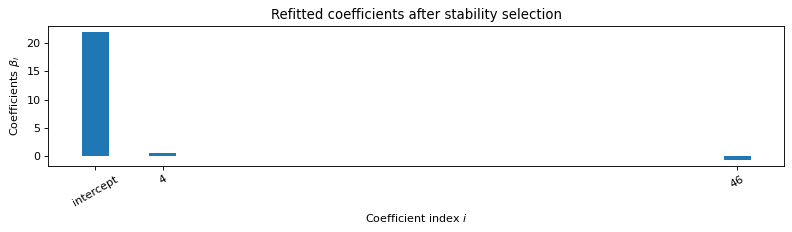


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.093s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.60 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.60]
Error: 3.46

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


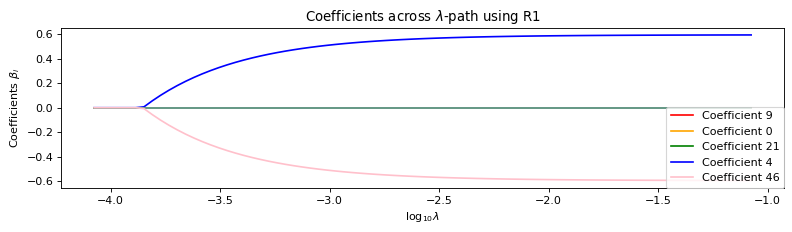

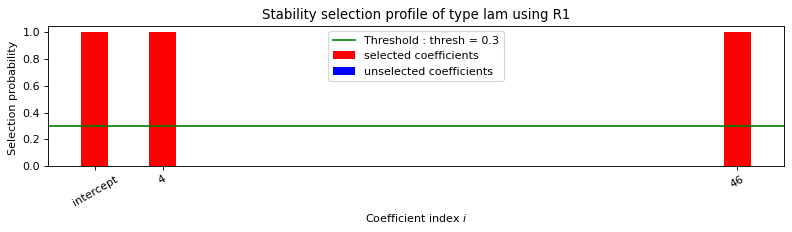

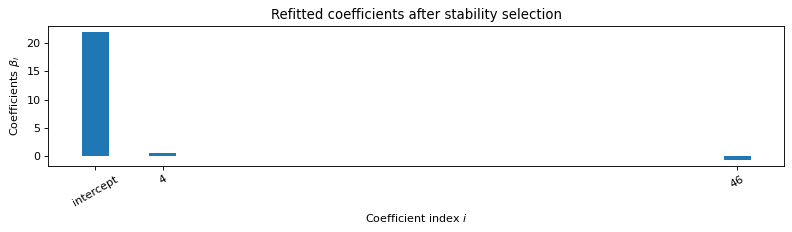


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.003s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.094s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.53 0.11 0.09 0.08 0.07 0.06 0.06 0.05 0.05 0.04 0.04
 0.04 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01
 0.01 0.01 0.01 0.60]
Error: 3.46

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 5.41

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                 -140012.788
Model:                         IV2SLS   Adj. R-squared:            -146771.062
Method:                     Two Stage   F-statistic:                -1.226e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        10:56:47                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.5180        nan        nan        n

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.43 0.09 0.07 0.06 0.06 0.05 0.05 0.04 0.04 0.04 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.09 -0.03 0.02 0.02 0.02 0.02 0.02
 -0.05 -0.19 0.02 0.00 0.02 0.02 0.06 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.82 0.03 0.54]
Estimated Beta: [-0.02 -0.02 -0.02 -0.02 0.46 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.09 0.02
 -0.02 -0.02 -0.02 -0.02 -0.02 0.04 0.18 -0.02 0.01 -0.02 -0.02 -0.07
 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 -0.02 0.82 -0.02 -0.53]


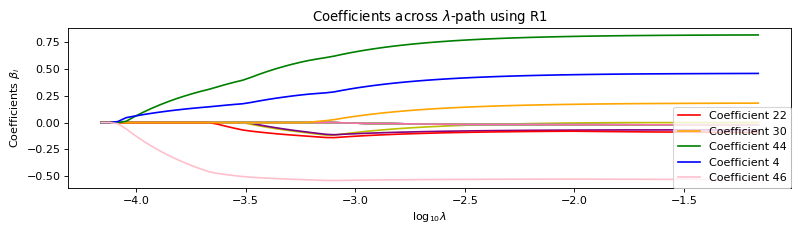

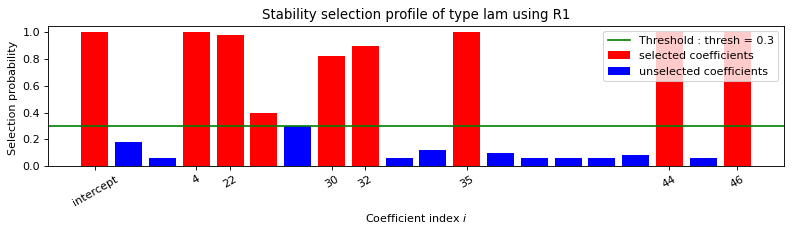

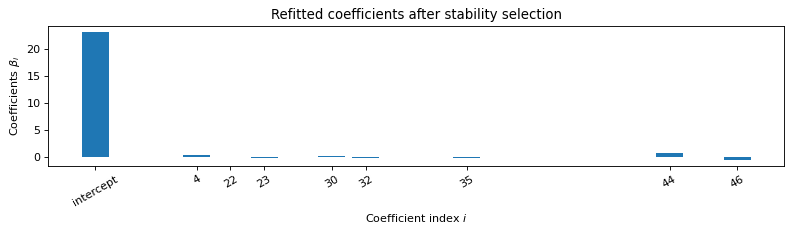


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    23    30    32    35    44    46    
   Running time :  0.267s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.36 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.14 -0.21 0.00 0.00 0.00 0.00
 0.00 0.00 0.11 0.00 -0.17 0.00 0.00 -0.18 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.76 0.00 -0.55]
Error: 0.47

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
------

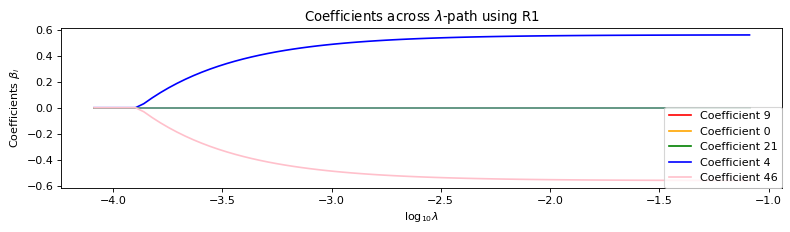

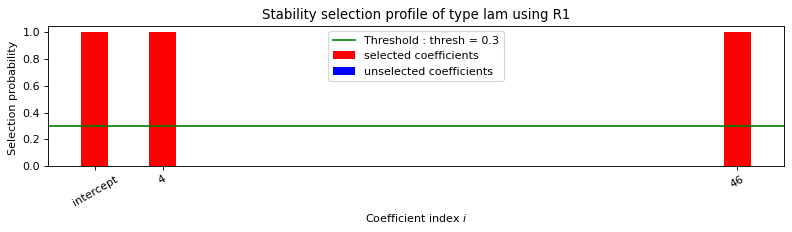

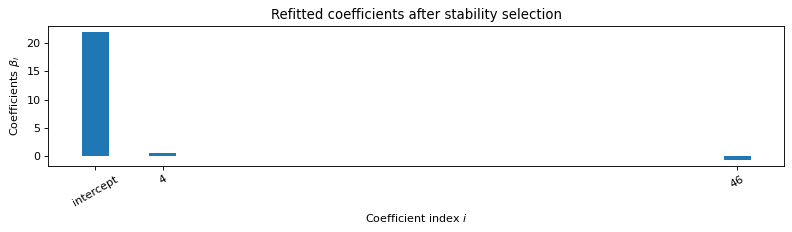


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.115s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 3.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


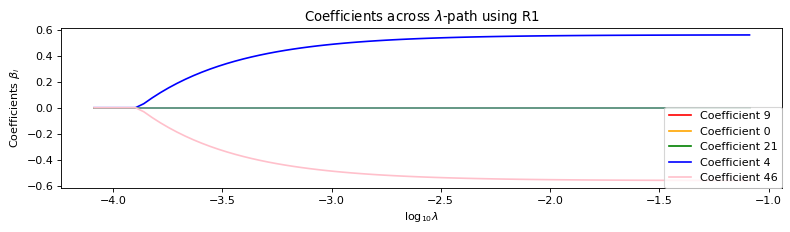

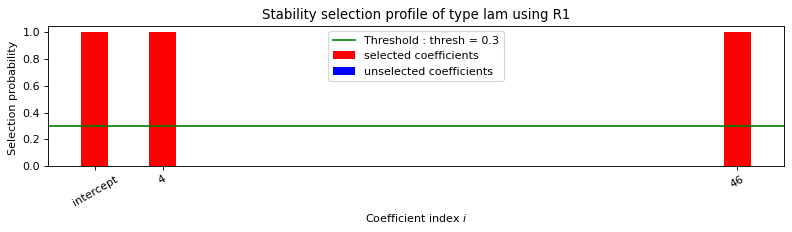

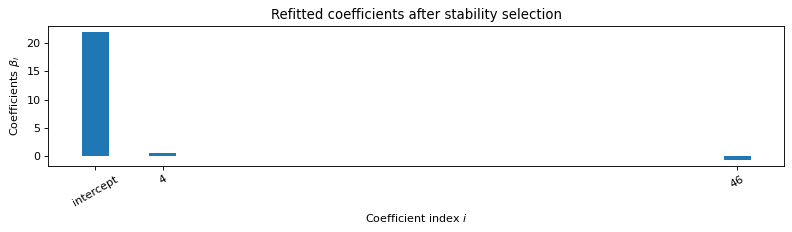


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.113s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.57]
Error: 3.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 16.04

-------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                -5500637.840
Model:                         IV2SLS   Adj. R-squared:           -5766146.115
Method:                     Two Stage   F-statistic:                -1.054e-18
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        11:02:09                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -35.9373   5.35e+10  -6.72e-10      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.42 0.09 0.07 0.06 0.06 0.05 0.04 0.04 0.04 0.03 0.03
 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.19 -0.27 0.02 0.02 0.02 0.02 0.02
 0.00 -0.26 0.03 0.02 0.03 0.03 -0.01 0.03 0.03 0.02 0.02 0.02 0.02 0.02
 0.02 -0.89 0.04 0.49]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.44 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.20 0.26
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.01 0.25 -0.03 -0.02 -0.03 -0.03 0.01
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.89 -0.03 -0.48]

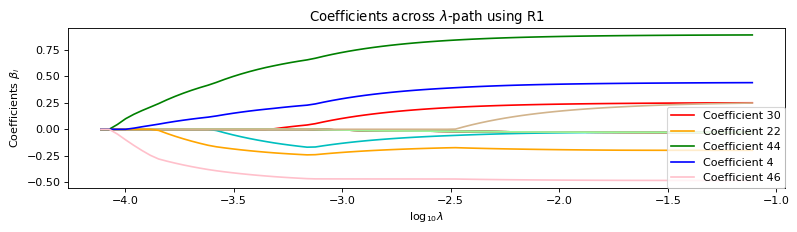

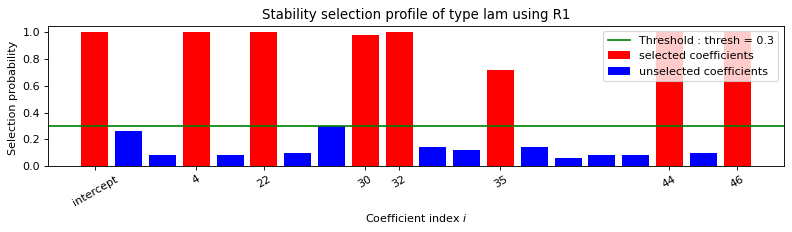

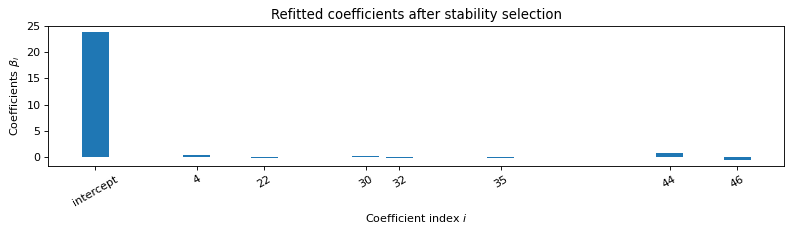


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.009s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.263s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.30 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.29 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.13 0.00 -0.26 0.00 0.00 -0.15 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.78 0.00 -0.51]
Error: 0.71

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

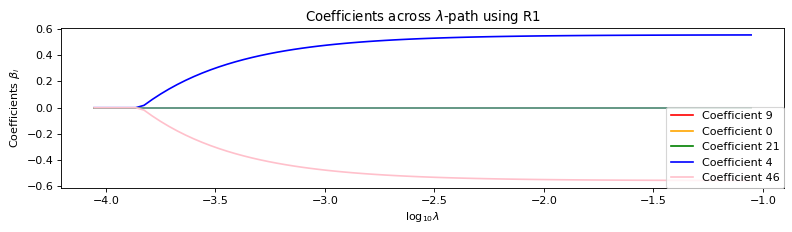

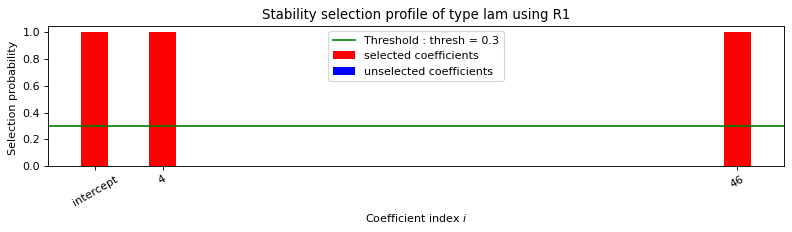

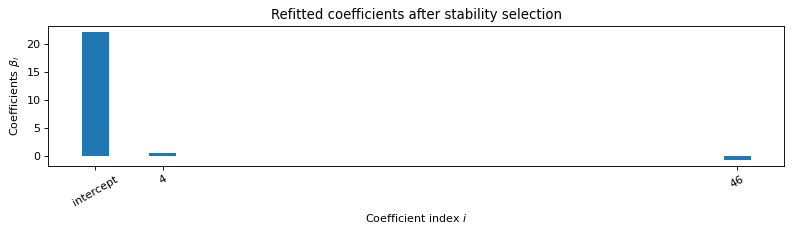


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.156s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.56 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.56]
Error: 3.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


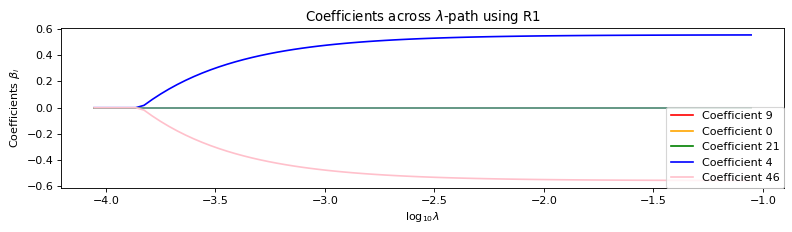

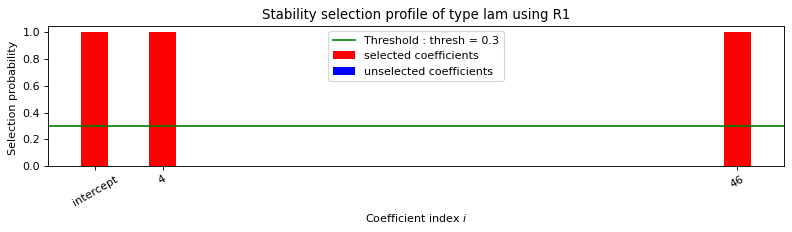

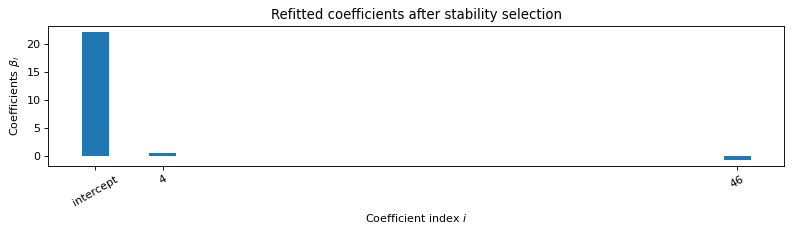


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    46    
   Running time :  0.156s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.50 0.10 0.09 0.07 0.07 0.06 0.05 0.05 0.04 0.04 0.04
 0.04 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.56]
Error: 3.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 9.62

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                  -16102.509
Model:                         IV2SLS   Adj. R-squared:             -16879.804
Method:                     Two Stage   F-statistic:                 2.155e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        11:07:41                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.1618   1.45e+09   6.99e-09      1.0

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:464: RuntimeWarning:

divide by zero encountered in log

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/skbio/stats/composition.py:466: RuntimeWarning:

invalid value encountered in subtract



---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 -0.46 0.09 0.08 0.07 0.06 0.05 0.05 0.04 0.04 0.04 0.04
 0.03 0.03 0.03 0.03 0.03 0.03 0.02 0.06 -0.15 0.03 0.03 0.02 0.02 0.02
 -0.03 -0.20 0.03 0.03 0.03 0.03 0.02 0.03 0.02 0.02 0.02 0.02 0.02 0.02
 0.02 -0.91 0.04 0.58]
Estimated Beta: [-0.03 -0.03 -0.03 -0.03 0.49 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.07 0.15
 -0.03 -0.03 -0.03 -0.03 -0.03 0.02 0.20 -0.03 -0.03 -0.03 -0.03 -0.02
 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 -0.03 0.91 -0.03 -0.58]

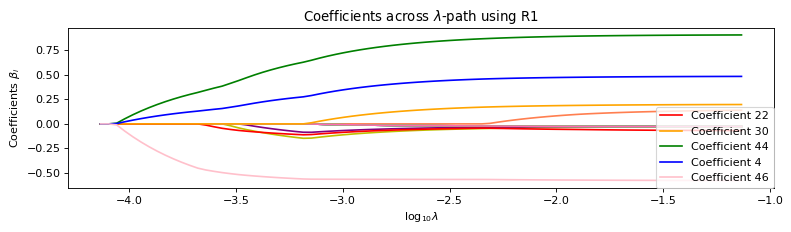

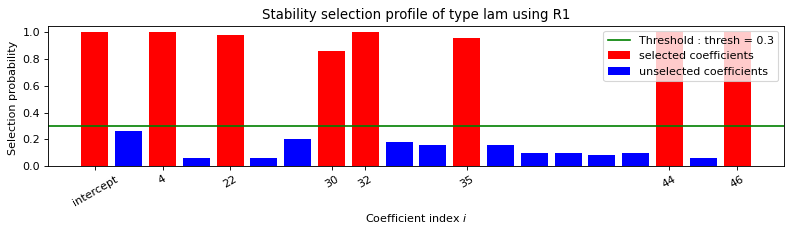

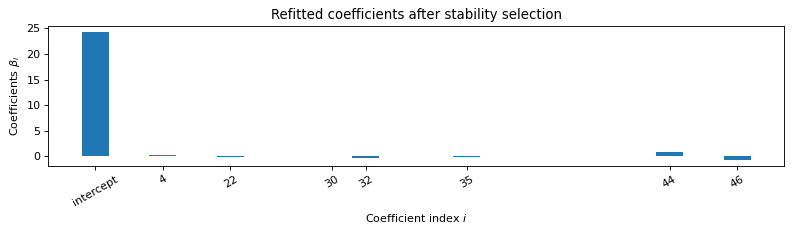


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.011s

 STABILITY SELECTION : 
   Selected variables :  intercept    4    22    30    32    35    44    46    
   Running time :  0.193s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.35 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 -0.16 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.10 0.00 -0.27 0.00 0.00 -0.19 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.80 0.00 -0.62]
Error: 0.72

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
-------------

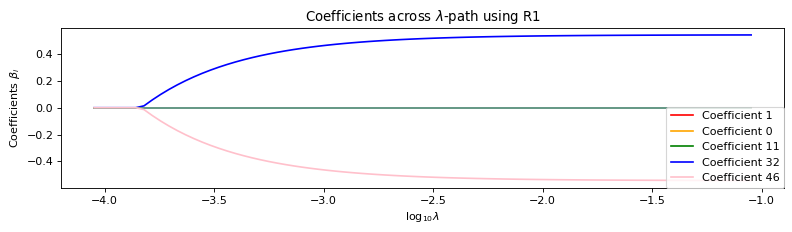

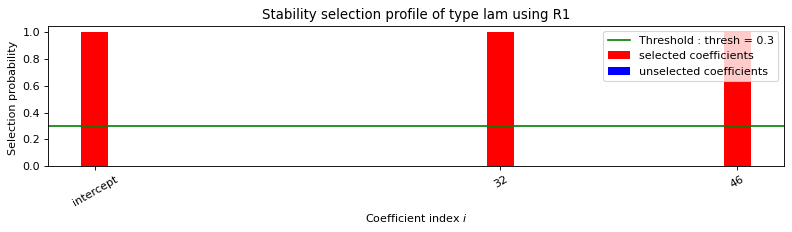

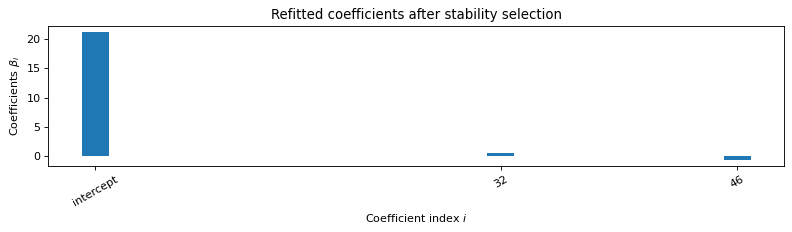


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.128s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.54 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.54]
Error: 8.41

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


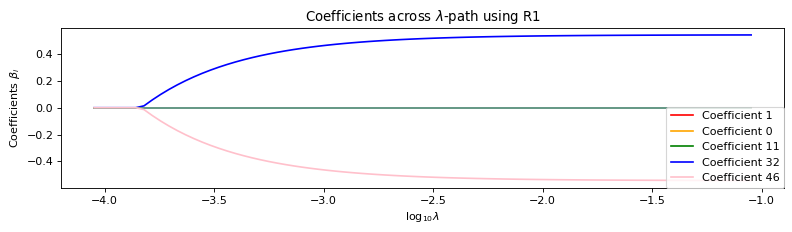

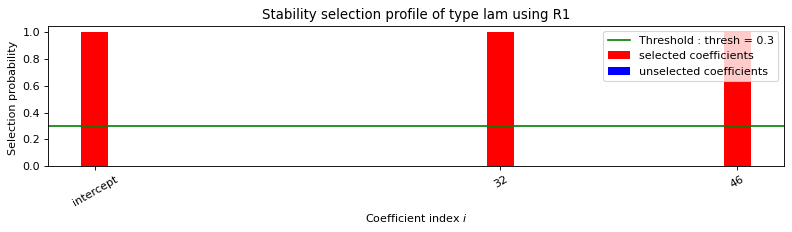

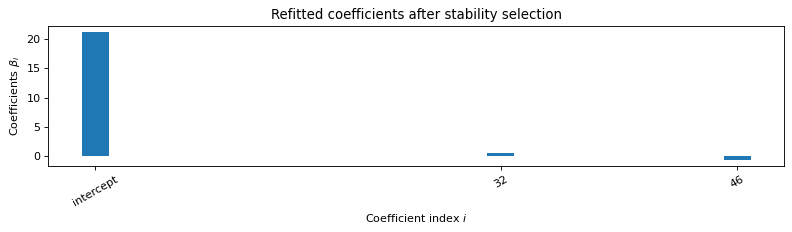


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    32    46    
   Running time :  0.11s

True Beta: [0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]
Estimated Beta: [0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 -0.54 0.02 0.02 0.02 0.01 0.01 0.01 0.01 0.01 0.01 0.01
 0.01 0.01 0.01 0.55]
Error: 8.41

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Error: 6.15

--------------------------------------------------------------------------------------------

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/sandbox/regression/gmm.py:290: RuntimeWarning:

invalid value encountered in sqrt

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 46, but rank is 3

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1787: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -559.442
Model:                         IV2SLS   Adj. R-squared:               -586.494
Method:                     Two Stage   F-statistic:                 8.589e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Mo, 14 Jun 2021                                         
Time:                        11:13:16                                         
No. Observations:                1000                                         
Df Residuals:                     953                                         
Df Model:                          46                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.2803        nan        nan        n

KeyError: 0.3930000066757202

In [46]:
today = datetime.now()
num_iteration = 50

path = os.getcwd()
mypath = os.path.join(path, "temp",
                      today.strftime("%Y_%m_%d_%H_%M") + "_SemiSynthetic_ConfidenceInterval_"
                      + str(num_iteration)+"_Microbiota_" +str(p))

if not os.path.isdir(mypath):
    os.makedirs(mypath)


# create logging file with relevant information
for handler in logging.root.handlers[:]:
    logging.root.removeHandler(handler)

logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s %(name)-12s %(levelname)-8s %(message)s',
                    datefmt='%m-%d %H:%M',
                    filename=os.path.join(os.getcwd(), mypath, "configurations.log"),
                    filemode='w'
                    )

#logging.info("n="+str(n)+", p="+str(p)+", instrument strength: "+instrument_strength)
logging.info("Number of runs: "+str(num_iteration))
logging.info("First Stage Specification: ")
logging.info("Number of Instruments: "+str(num_inst))
logging.info("Instrument Strength by F-Test: " +str(F))
logging.info("alpha0="+str(alpha0)+", alphaT="+str(alphaT)+", confounder multiplicator c_X="+str(c_X))
logging.info("Second Stage Specification: ")
logging.info("beta0="+str(beta0)+", betaT="+str(betaT)+", confounder multiplicator c_Y="+str(c_Y))
logging.info("Confounder mean mu_c="+str(mu_c))


df_beta, df_mse, mse_large_confidence= run_methods_confidence_interval(
    key, num_iteration, 
    n, p, num_inst, mu_c, c_X, alpha0, alphaT, c_Y, beta0, betaT, is_lognormal=True, 
    num_star=num_star, 
    logcontrast_threshold=0.3)

In [48]:
path

'/Users/elisabeth.ailer/Projekte/P1_Microbiom/Code/notebooks'

In [ ]:
import pickle
results = {
    "df_mse": df_mse,
    "df_beta": df_beta,
    "mse_large": mse_large_confidence
}

with open(os.path.join(savepath, "results_"+str(p)+str(instrument_strength)+".pickle"), "wb") as f:
    pickle.dump(results, f)
    f.close()


In [49]:
with open(os.path.join(savepath, "results_47unknown.pickle"), "rb") as f:
    results = pickle.load(f)
    df_mse = results["df_mse"]
    df_beta = results["df_beta"]
    f.close()

# Mean Squarred Error Plot

In [100]:
df_mse.Method=df_mse.Method.replace({"KIV+KIV":"KIV"})

In [102]:
filter_list = ["ALR+LC", "ONLY Second LC", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
#fig.update_yaxes(range=(0, 5000))
fig.write_image(os.path.join(savepath,
                             "MSE_Small_Real" +str(p)+"InstrumentStrength_"+str(instrument_strength)+".pdf" ))
fig.show()

In [103]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.update_yaxes(range=(0, 11))
fig.write_image(os.path.join(savepath,
                             "MSE_Full_Real" +str(p)+"InstrumentStrength_"+str(instrument_strength)+"_2.pdf" ))
fig.show()

In [104]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC", "ILR+ILR", "ONLY Second LC", "ONLY Second ILR", "KIV"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.update_yaxes(range=(0, 1000000))
fig.write_image(os.path.join(savepath,
                             "MSE_Full_Real" +str(p)+"InstrumentStrength_"+str(instrument_strength)+".pdf" ))
fig.show()

# Beta Plot

In [72]:
print(betaT)

[0.00 0.00 0.00 0.00 0.39 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 0.00 0.00 0.00 0.00 -0.26 0.00 0.49 0.00 -0.09 -0.12 0.00 0.00 -0.19 0.00
 0.00 0.00 0.11 0.00 0.00 0.00 -0.25 0.00 0.00 0.00 0.00 0.00 0.00 0.00
 -0.25 0.00 0.70 0.00 -0.53]


In [76]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.update_yaxes(range=(-100, 60))
fig.update_layout(width=2000, height=500)
fig.write_image(os.path.join(savepath,
                             "Beta_Full_Real" +str(p)+"InstrumentStrength_"+str(instrument_strength)+".pdf" ))

fig.show()

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              0
1              
-0.533  #00CC96
-0.257  #AB63FA
-0.255  #FFA15A
-0.252  #19D3F3
-0.188  #FF6692
-0.125  #B6E880
-0.090  #FF97FF
 0.000  #FECB52
 0.113  #636EFA
 0.393  #EF553B
 0.494  #00CC96
 0.700  #AB63FA


In [78]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
#fig.update_yaxes(range=(-100, 60))
fig.update_layout(width=2000, height=500)
fig.write_image(os.path.join(savepath,
                             "Beta_Full_Real" +str(p)+"InstrumentStrength_"+str(instrument_strength)+".pdf" ))

fig.show()

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              0
1              
-0.533  #00CC96
-0.257  #AB63FA
-0.255  #FFA15A
-0.252  #19D3F3
-0.188  #FF6692
-0.125  #B6E880
-0.090  #FF97FF
 0.000  #FECB52
 0.113  #636EFA
 0.393  #EF553B
 0.494  #00CC96
 0.700  #AB63FA


In [79]:
filter_list = ["ALR+LC", "ILR+LC", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR", "KIV+KIV"]
fig = plot_beta_results(df_beta, betaT, filter_list, sort_to_filter=True, beta_zero=True)
fig.update_layout(showlegend=False)
#fig.update_yaxes(range=(-100, 60))
fig.update_layout(width=2000, height=500)
fig.write_image(os.path.join(savepath,
                             "Beta0_Full_Real" +str(p)+"InstrumentStrength_"+str(instrument_strength)+".pdf" ))

fig.show()

/opt/anaconda3/envs/gen_iv_models/lib/python3.7/site-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



              0
1              
-0.533  #00CC96
-0.257  #AB63FA
-0.255  #FFA15A
-0.252  #19D3F3
-0.188  #FF6692
-0.125  #B6E880
-0.090  #FF97FF
 0.000  #FECB52
 0.113  #636EFA
 0.393  #EF553B
 0.494  #00CC96
 0.700  #AB63FA


In [66]:
fig = plot_beta_results(df_beta, betaT, filter_list, beta_zero=True)


fig.update_yaxes(range=(-1, 1))
fig.update_layout(width=2000, height=500)
fig.write_image(os.path.join(savepath,
                             "BetaZeroFull_" +str(p)+"SemiSynthetic_"+str(instrument_strength)+".pdf" ))

fig.show()


KeyError: 0.11299999803304672